In [1]:
#Used for displaying plots below the cell
%matplotlib inline
import math

import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

import scipy
import scipy.stats as stats
from scipy.stats.stats import pearsonr

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import LocalOutlierFactor

In [2]:
df_geo = pd.read_csv('../geography.csv', sep=',', index_col=0)
df_ram = pd.read_csv('../ram.csv', sep=',', index_col=0)

# Original dataset split for VCS purposes
df_sales_part1 = pd.read_csv('../sales_ram-part1.csv', sep=',', index_col=0) #The dataset doesn't have a column name. This causes the error.
df_sales_part2 = pd.read_csv('../sales_ram-part2.csv', sep=',', index_col=0)
df_sales = df_sales_part1.append(df_sales_part2)

df_time = pd.read_csv('../time.csv', sep=',', index_col=0)
df_vendor = pd.read_csv('../vendor.csv', sep=',', index_col=0)

/home/avenger/.local/lib/python3.9/site-packages/numpy/lib/arraysetops.py:583: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


# Task 1.1: Data understanding

## Auxiliary functions

In [3]:
#Plot mean and std values of the sales for any feature given as input
def plt_generate_sales_scatter(source_df, features, title):
    plt.title(title)
    
    mean_df = source_df.groupby(features)["sales_uds"].mean().rename("mean")
    mean_df.index = mean_df.index.to_flat_index().rename("index")
    mean_df = mean_df.reset_index("index")
    mean_df.loc[:, "index"] = mean_df["index"].apply(lambda x: str(x)).rename("index")
    
    std_df = source_df.groupby(features)["sales_uds"].std().rename("std")
    std_df.index = std_df.index.to_flat_index().rename("index")
    std_df = std_df.reset_index("index")
    std_df.loc[:, "index"] = std_df["index"].apply(lambda x: str(x)).rename("index")
    
    plt.scatter(mean_df["index"], mean_df["mean"], c="g", marker="*", label="Mean", alpha=0.50)
    plt.scatter(std_df["index"], std_df["std"], c="r", marker="o", label="Std", alpha=0.50)
    
    plt.ylabel("Sales (USD)")
    plt.xlabel("")
    plt.xticks(rotation = 90)
    plt.legend()

In [4]:
df_sales_merged = df_sales[["Id", "ram_code"]].join(df_ram, on="ram_code", rsuffix="_ram")
df_sales_merged["time_code"] = df_sales["time_code"]
df_sales_merged = df_sales_merged.join(df_time.set_index("time_code"), on="time_code")
df_sales_merged["geo_code"] = df_sales["geo_code"]
df_sales_merged = df_sales_merged.join(df_geo.set_index("geo_code"), on="geo_code")
df_sales_merged["vendor_code"] = df_sales["vendor_code"]
df_sales_merged = df_sales_merged.join(df_vendor.set_index("vendor_code"), on="vendor_code", rsuffix="_vendor")
df_sales_merged = df_sales_merged.join(df_sales[["sales_uds", "sales_currency"]])

In this section we will go through all the datasets imported and try to mine some interesting information.  
In order to make the analysis process easier we will merge all of the datasets into a single one.

## Data types

In [5]:
df_sales_merged.dtypes

Id                  int64
ram_code          float64
brand              object
name               object
memory            float64
memory_type        object
clock               int64
time_code           int64
year                int64
month               int64
day                 int64
week                int64
geo_code            int64
continent          object
country            object
region             object
currency           object
vendor_code         int64
name_vendor        object
sales_uds         float64
sales_currency    float64
dtype: object

The data types are reasonable, all of the strings are being treated as generic objects.  
For the purposes of our analysis this is irrelevant, we would like however to have time_code be a datetime and not a simple int64.

In [6]:
df_sales_merged["time_code"].head()

2602347    20130322
2602348    20130323
2602349    20130326
2602350    20130327
2602351    20130328
Name: time_code, dtype: int64

In [7]:
df_sales_merged.loc[:, "time_code"] = pd.to_datetime(df_sales_merged["time_code"], format="%Y%m%d")

In [8]:
df_sales_merged["time_code"].head()

2602347   2013-03-22
2602348   2013-03-23
2602349   2013-03-26
2602350   2013-03-27
2602351   2013-03-28
Name: time_code, dtype: datetime64[ns]

## Geography

In [9]:
df_geo.head()

,geo_code,continent,country,region,currency
1,1,Oceania,Australia,northern territory,AUD
2,2,Oceania,Australia,queensland,AUD
3,3,Oceania,Australia,south australia,AUD
4,4,Oceania,Australia,tasmania,AUD
5,5,Oceania,Australia,victoria,AUD


### Continent

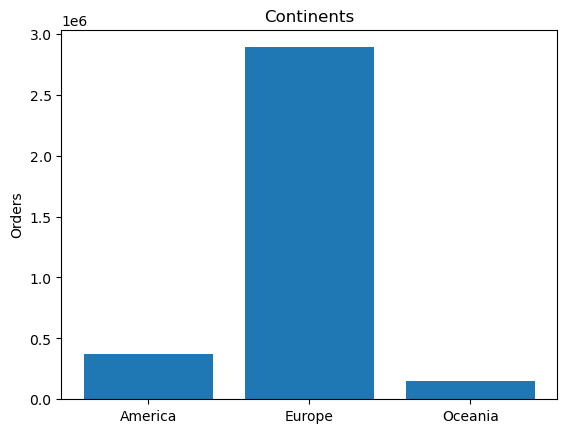

In [10]:
plt.title("Continents")
labels, counts = np.unique(df_sales_merged["continent"], return_counts=True)
plt.bar(labels, counts, align='center')
plt.ylabel("Orders")
plt.show()

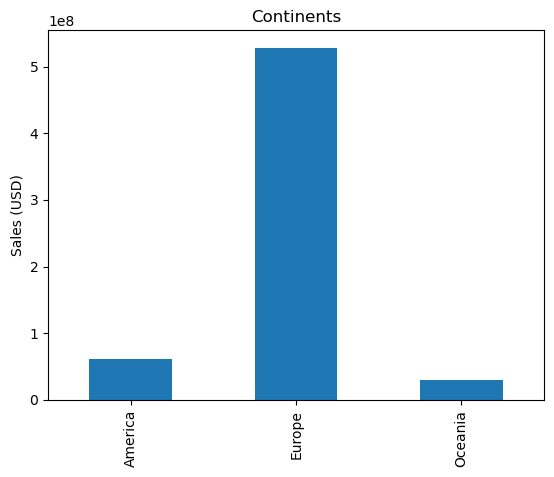

In [11]:
plt.title("Continents")
df_sales_merged.groupby("continent")["sales_uds"].sum().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xlabel("")
plt.show()

The majority of the business is conducted in Europe, possibly an indicator that the sellers are mostly located in Europe.

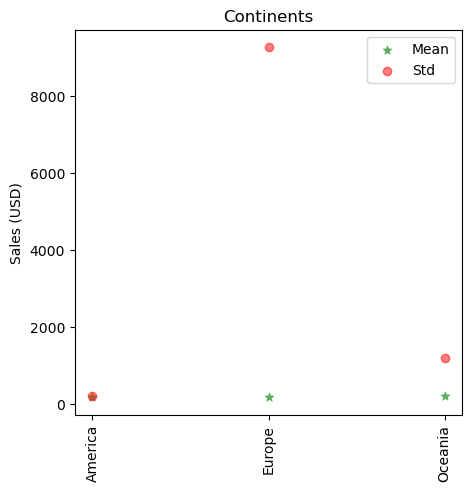

In [12]:
plt.figure(figsize=(5, 5))
plt_generate_sales_scatter(df_sales_merged, "continent", "Continents")
plt.show()

Europe has also the highest swings in prices. 

### Country

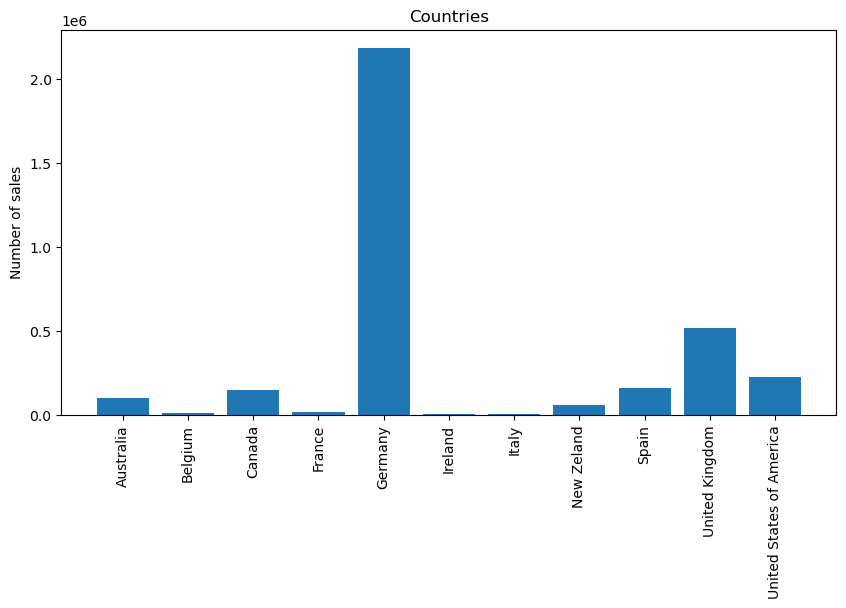

In [13]:
plt.figure(figsize=(10, 5))
plt.title("Countries")
labels, counts = np.unique(df_sales_merged["country"], return_counts=True)
plt.bar(labels, counts, align='center')
plt.ylabel("Number of sales")
plt.xticks(rotation=90)
plt.show()

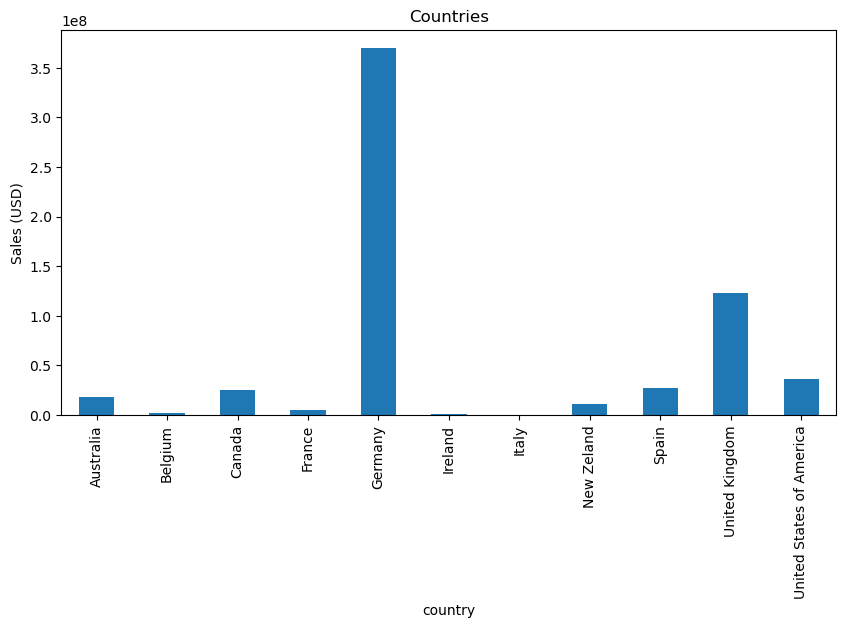

In [14]:
plt.figure(figsize=(10, 5))
plt.title("Countries")
df_sales_merged.groupby("country")["sales_uds"].sum().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xticks(rotation=90)
plt.show()

Germany is the biggest buyer by far, both in terms of units sold and revenue.

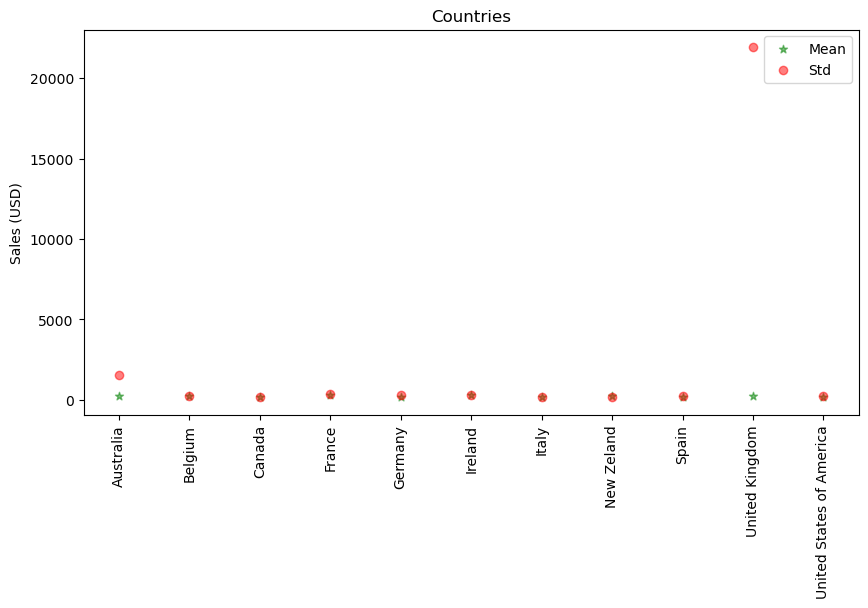

In [15]:
plt.figure(figsize=(10, 5))
plt_generate_sales_scatter(df_sales_merged, "country", "Countries")
plt.show()

The UK has an high amount of variance of its prices, with Australia is a distant second place.

### Region

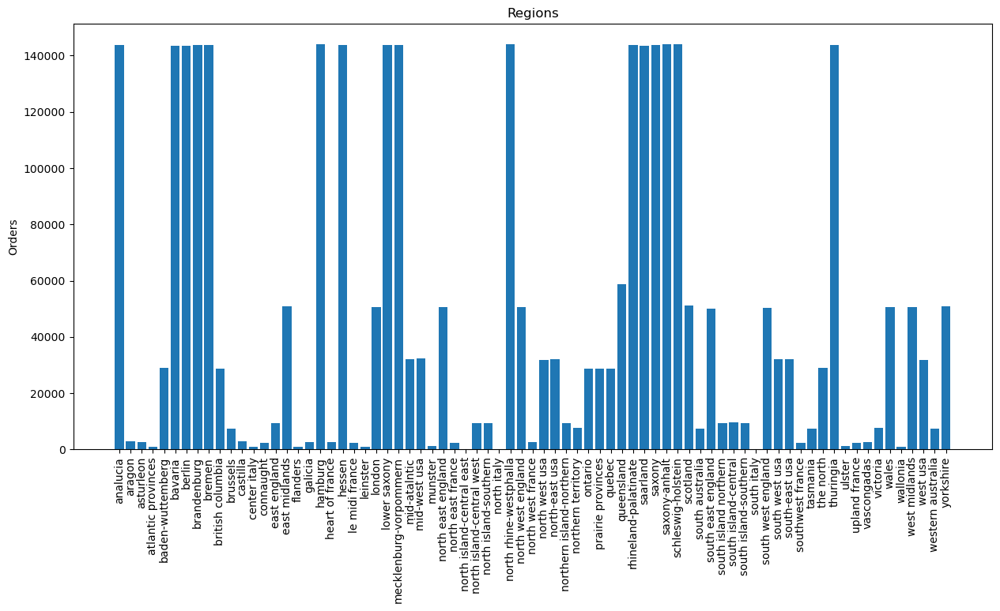

In [16]:
plt.figure(figsize=(15, 7))
plt.title("Regions")
labels, counts = np.unique(df_sales_merged["region"], return_counts=True)
plt.bar(labels, counts, align='center')
plt.ylabel("Orders")
plt.xticks(rotation = 90)
plt.show()

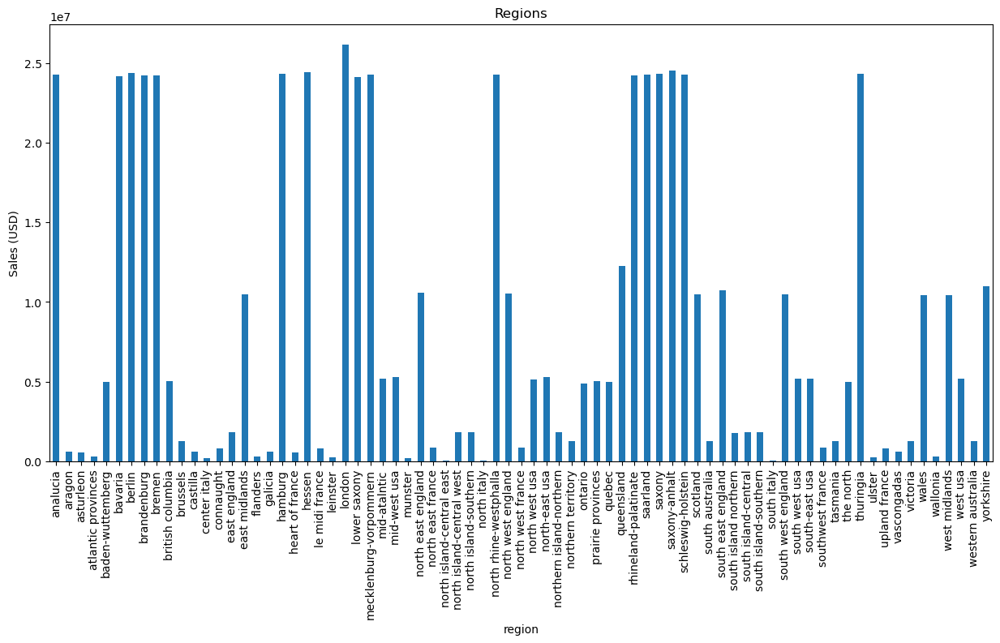

In [17]:
plt.figure(figsize=(15, 7))
plt.title("Regions")
df_sales_merged.groupby("region")["sales_uds"].sum().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xticks(rotation = 90)
plt.show()

All the high peaks, except the first one (andalucia), are german regions.

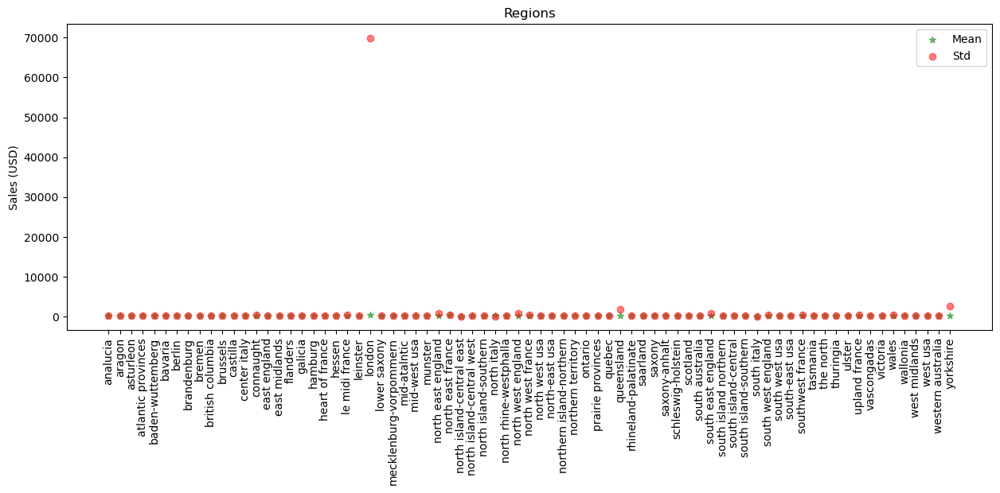

In [18]:
plt.figure(figsize=(15, 5))
plt_generate_sales_scatter(df_sales_merged, "region", "Regions")
plt.show()

London seems to be the region that skews all the rest of the UK sales.

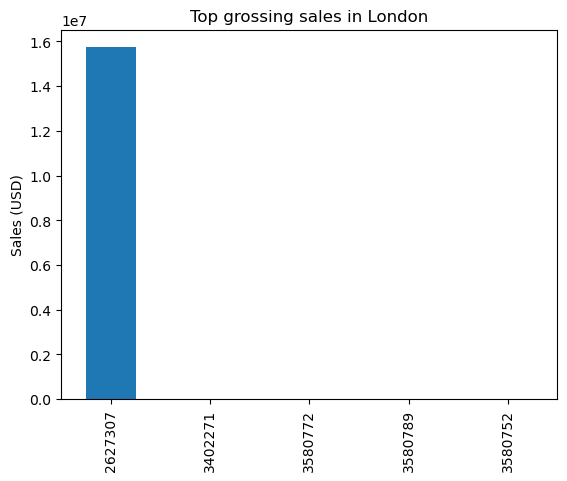

In [19]:
df_sales_merged.loc[df_sales_merged["region"] == "london"].sort_values("sales_uds", ascending=False)\
        .head()["sales_uds"].plot(kind="bar", title="Top grossing sales in London", ylabel="Sales (USD)")
plt.show()

The top value of the region is clearly an outlier.

### Currency

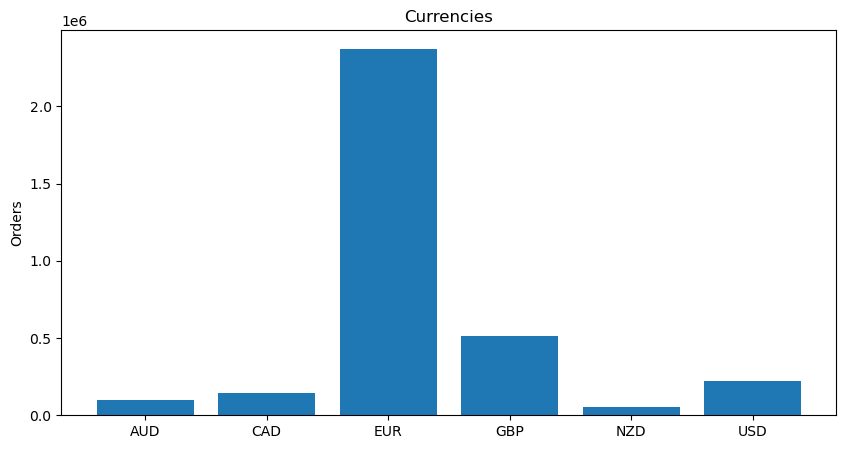

In [20]:
plt.figure(figsize=(10, 5))
plt.title("Currencies")
labels, counts = np.unique(df_sales_merged["currency"], return_counts=True)
plt.bar(labels, counts, align='center')
plt.ylabel("Orders")
plt.show()

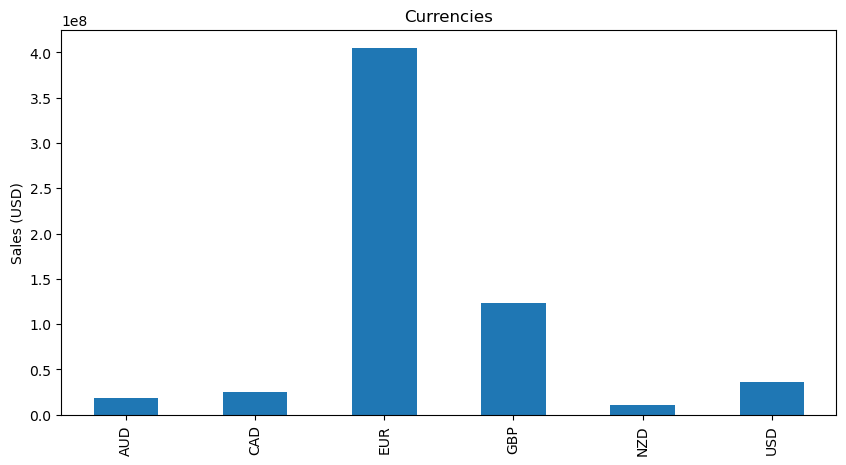

In [21]:
plt.figure(figsize=(10, 5))
plt.title("Currencies")
df_sales_merged.groupby("currency")["sales_uds"].sum().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xlabel("")
plt.show()

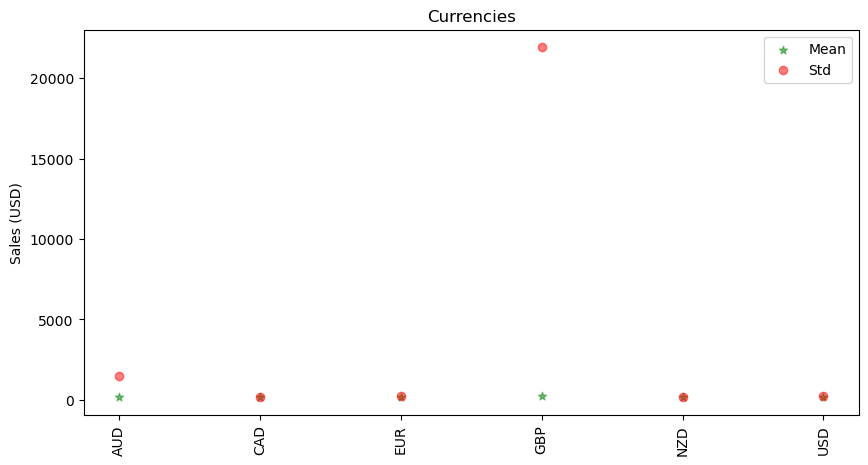

In [22]:
plt.figure(figsize=(10, 5))
plt_generate_sales_scatter(df_sales_merged, "currency", "Currencies")
plt.show()

The australian and british currencies are again on top.

#### Analysis of exchange rate between currencies

In [23]:
exchange_cur_usd = df_sales_merged.groupby("currency").apply(lambda x: x["sales_currency"]/x["sales_uds"])
exchange_cur_usd.groupby("currency").describe()

,count,mean,std,min,25%,50%,75%,max
currency,,,,,,,,
AUD,96396.0,1.013293,0.286888,0.629580,0.755755,0.813305,1.314050,1.394000
CAD,144653.0,1.292795,0.050212,0.800675,1.269350,1.293910,1.320665,1.374285
EUR,2374526.0,0.865309,0.084751,0.717792,0.813372,0.880615,0.909845,1.394000
GBP,515973.0,0.758413,0.100920,0.629580,0.708700,0.758075,0.784400,1.493850
NZD,56648.0,1.404504,0.044923,0.803325,1.376200,1.399000,1.435625,1.493850
USD,224135.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


From these results we can see that there are no apparent errors in the input of data in the dataset concerning the relative value of currencies (exchange value is stable), this allows us to continue using the USD as our main currency for analysis of prices, even outside the US market.  

Note that this table also tells us that the feature sales_uds is indeed the value in US dollars (possibly misspelled).

### Value checks

Let's check for missing/duplicate/invalid values.

In [24]:
print(df_geo["geo_code"].duplicated().any())

False


In [25]:
df_geo.groupby(["continent","country", "region", "currency"]).size().describe()

count    75.0
mean      1.0
std       0.0
min       1.0
25%       1.0
50%       1.0
75%       1.0
max       1.0
dtype: float64

Each combination of attributes in the dataset is unique, therefore there are no entries with different geo_code but same content.

In [26]:
print(df_geo["continent"].isna().any())
print(df_geo["country"].isna().any())
print(df_geo["region"].isna().any())
print(df_geo["currency"].isna().any())

False
False
False
False


No missing values in sight.

## Ram

In [27]:
df_ram.head()

,brand,name,memory,memory_type,clock
ram_code,,,,,
2,ADATA,Adata,1.0,DDR,333
1,ADATA,Adata,0.5,DDR,400
3,ADATA,Adata,1.0,DDR,400
4,ADATA,Adata,2.0,DDR,400
5,ADATA,Adata,1.0,DDR2,667


### Brands

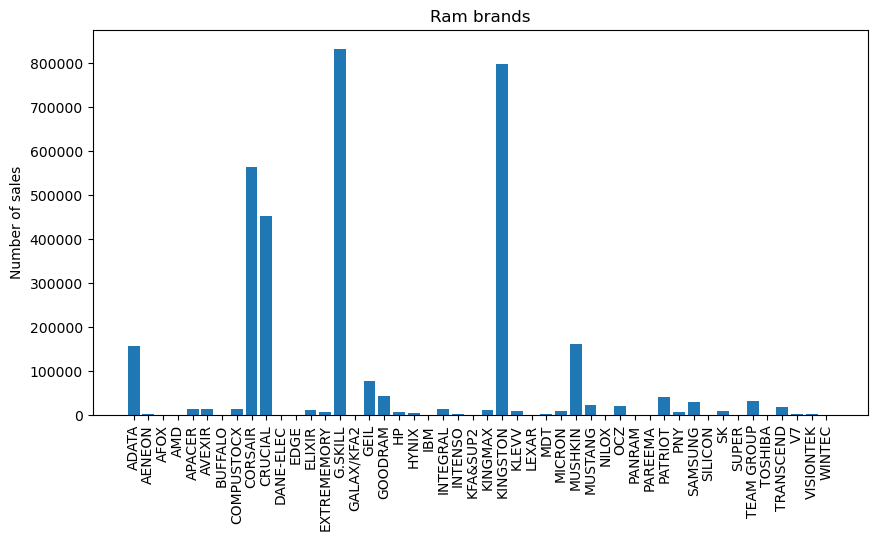

In [28]:
plt.figure(figsize=(10, 5))
plt.title("Ram brands")
labels, counts = np.unique(df_sales_merged["brand"], return_counts=True)
plt.bar(labels, counts, align='center')
plt.ylabel("Number of sales")
plt.xticks(rotation = 90)
plt.show()

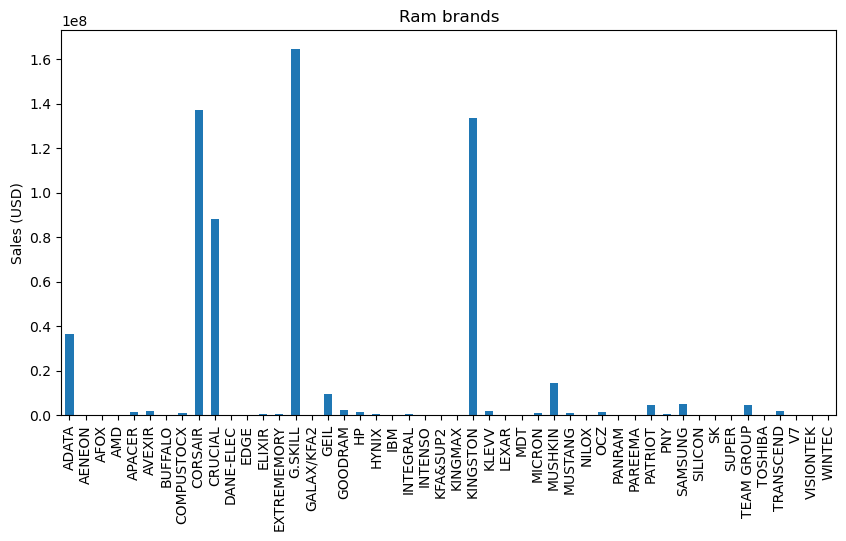

In [29]:
plt.figure(figsize=(10, 5))
plt.title("Ram brands")
brand_sales = df_sales_merged.groupby("brand")["sales_uds"].sum()
brand_sales.plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xlabel("")
plt.xticks(rotation = 90)
plt.show()

The sales value follows the trend of the amount of orders of each vendor.

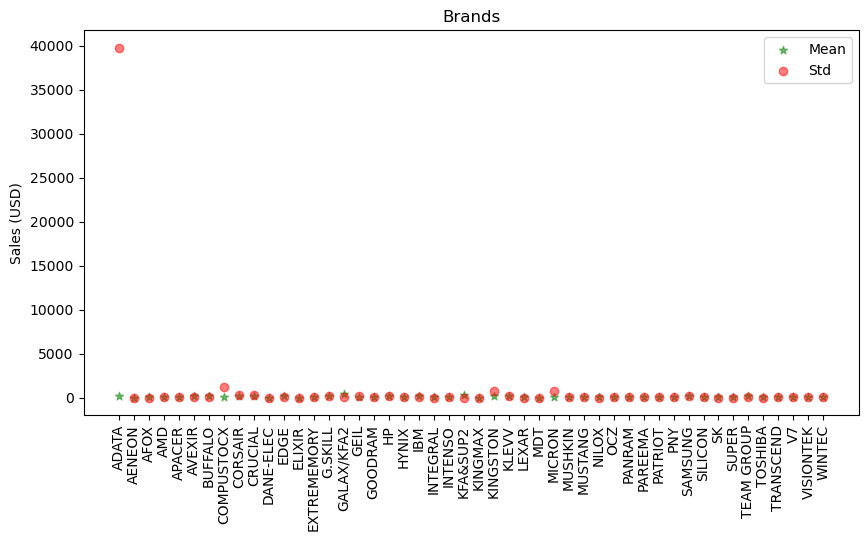

In [30]:
plt.figure(figsize=(10, 5))
plt_generate_sales_scatter(df_sales_merged, "brand", "Brands")
plt.show()

ADATA seems to have quite some outliers among its sales.

### Names

There are too many entries to visualise the "name" distribution with ease, let's restrict the plot to the most sold entries.

In [31]:
ram_names_redux = df_sales_merged.groupby("name").size()
ram_names_redux = ram_names_redux.sort_values(ascending=False).loc[ram_names_redux > ram_names_redux.quantile(0.75)]

names_redux_df = df_sales_merged.loc[df_sales_merged["name"].isin(ram_names_redux.index)]
unq_ram_redux = np.unique(ram_names_redux.index)

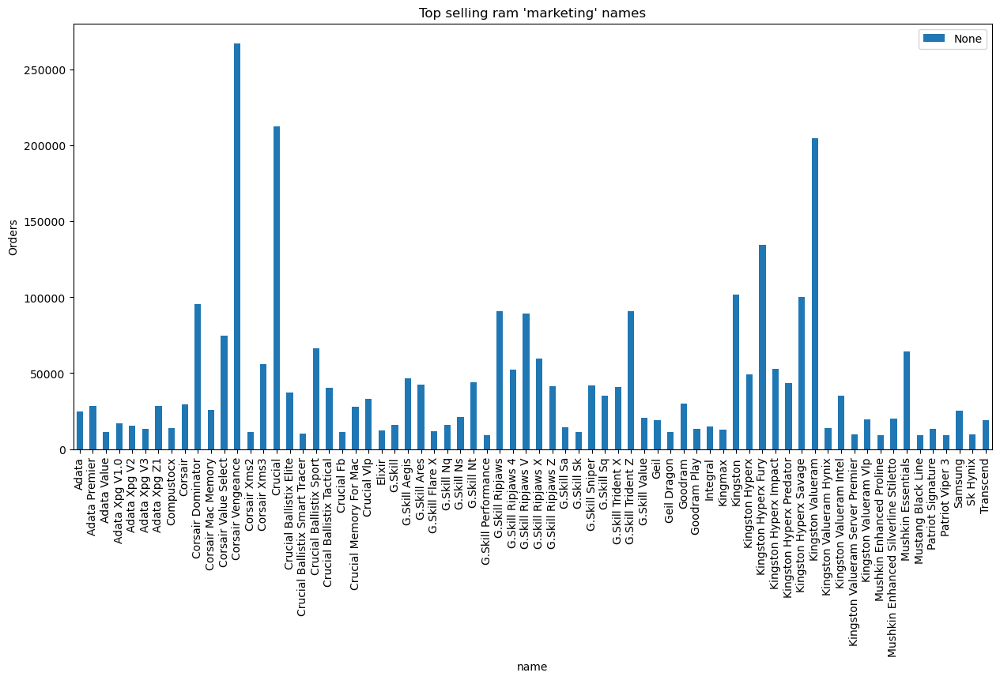

In [32]:
plt.figure(figsize=(15, 7))
plt.title("Top selling ram 'marketing' names")
brands = names_redux_df["brand"].unique()
names_redux_df.groupby("name").size().plot(kind="bar", legend=True)
#plt.hist([names_redux_df.loc[names_redux_df["brand"] == x, 'name'] for x in brands], label=brands)
#plt.xticks(names_redux_df["name"].unique(), rotation=90)
plt.ylabel("Orders")
#plt.legend()
plt.show()

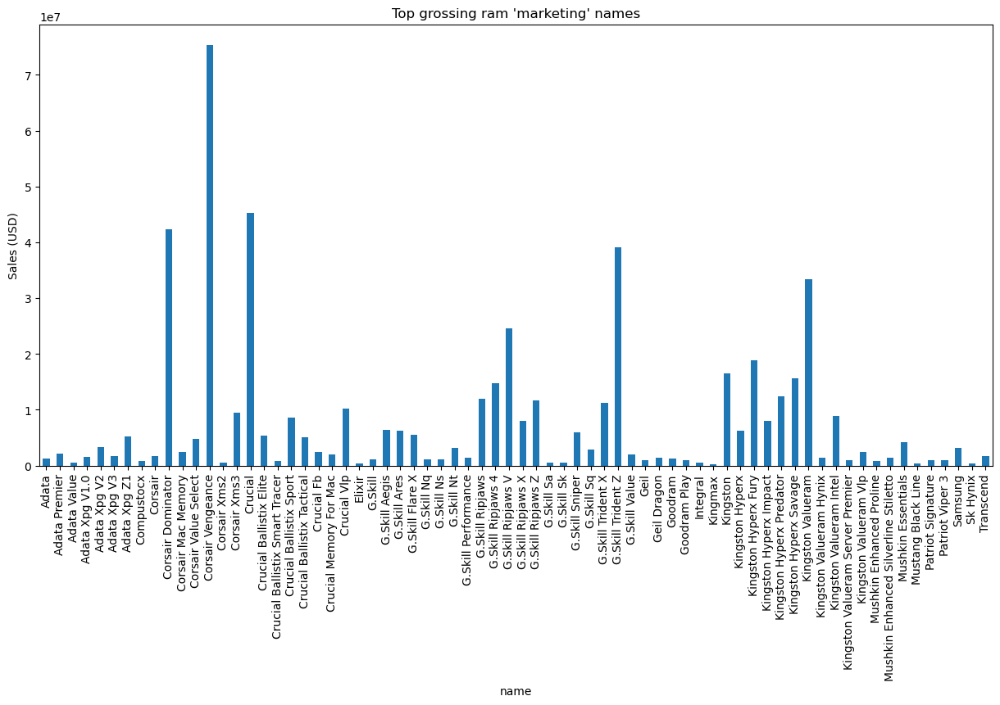

In [33]:
brands = names_redux_df["brand"].unique()
name_sales = names_redux_df.groupby(["name"])["sales_uds"].sum().rename("sum")
names_sales = name_sales.reset_index(["name"])

names_sales.set_index("name").plot(by="sum", kind="bar", \
                    title="Top grossing ram 'marketing' names", figsize=(15, 7), legend=False)
plt.xticks(rotation=90)
plt.ylabel("Sales (USD)")
plt.show()

The distribution of the sales revenue does not reflect the number of items sold from that product series.  
This could be both because of a higher-tier product or because of outliers.

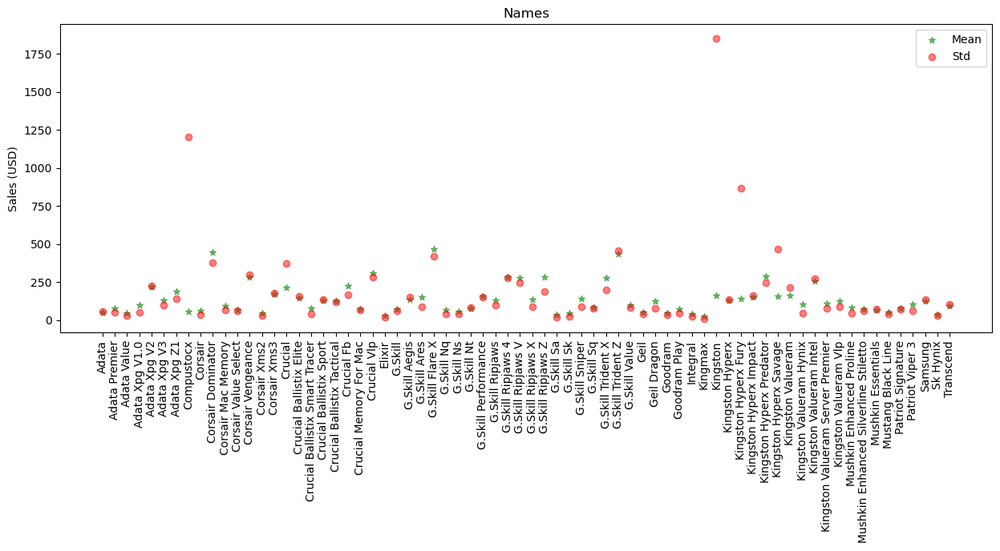

In [34]:
plt.figure(figsize=(15, 5))
plt_generate_sales_scatter(names_redux_df, "name", "Names")
plt.show()

These values are still within a reasonable range, however when plotting the names with the most variance we get a different view.

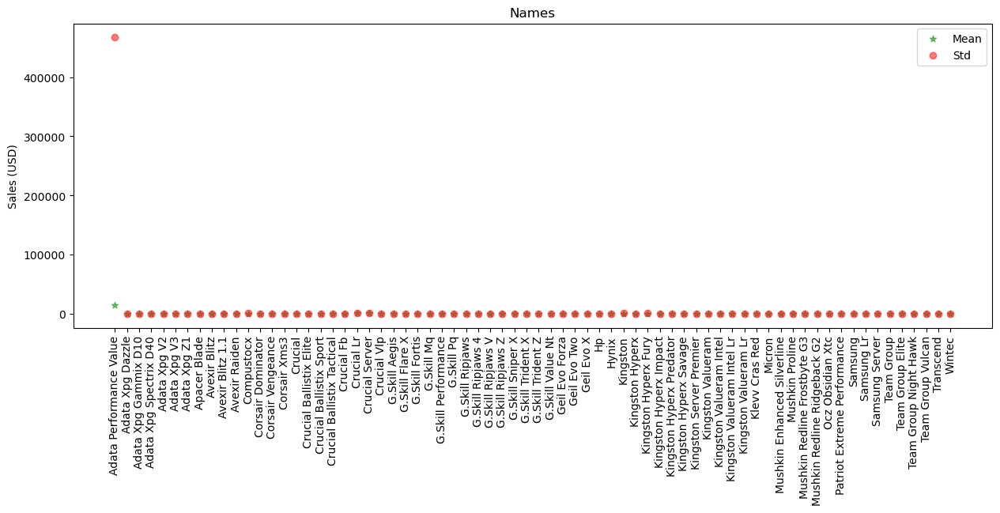

In [35]:
names_top_std_df = df_sales_merged.groupby("name")["sales_uds"].std().sort_values(ascending=False)
names_top_std_df = names_top_std_df.loc[names_top_std_df > names_top_std_df.quantile(0.75)]
names_top_std_df = df_sales_merged.loc[df_sales_merged["name"].isin(names_top_std_df.index)]

plt.figure(figsize=(15, 5))
plt_generate_sales_scatter(names_top_std_df, "name", "Names")
plt.show()

Spot the outlier.

### Memory type

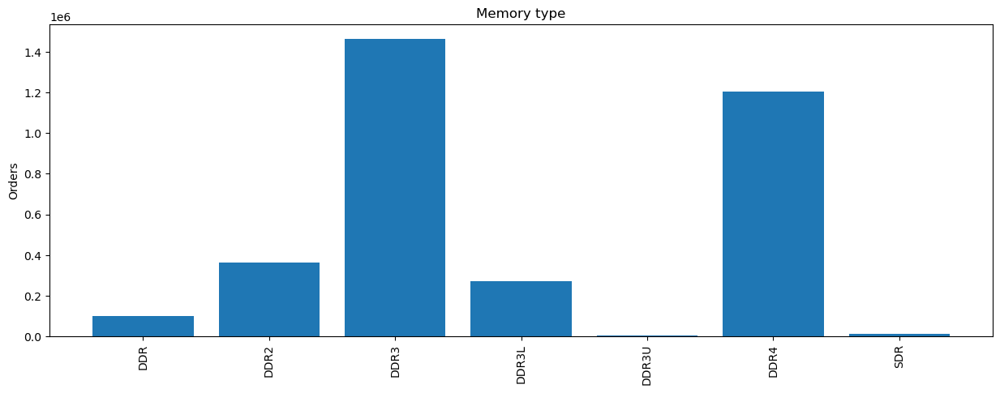

In [36]:
plt.figure(figsize=(15, 5))
plt.title("Memory type")
labels, counts = np.unique(df_sales_merged["memory_type"], return_counts=True)
plt.bar(labels, counts, align='center')
plt.ylabel("Orders")
plt.xticks(rotation = 90)
plt.show()

No surprises here considering the timeframe in which the sales take place.

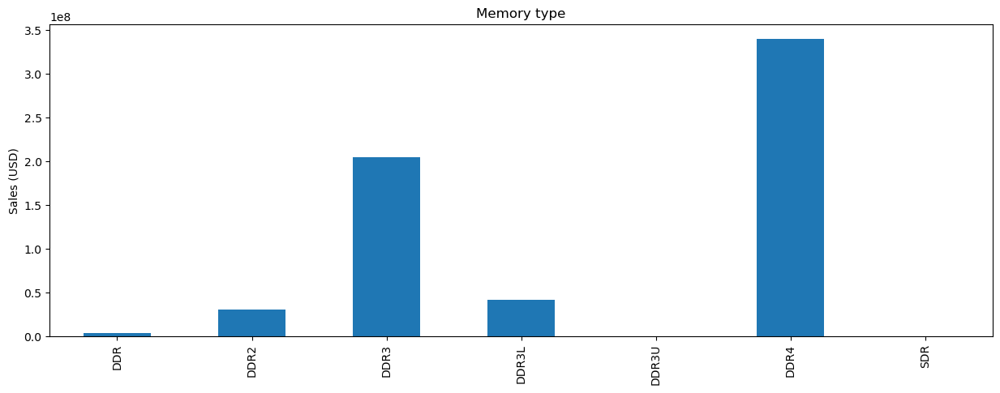

In [37]:
plt.figure(figsize=(15, 5))
plt.title("Memory type")
mem_type_sales = df_sales_merged.groupby("memory_type")["sales_uds"].sum()
mem_type_sales.plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xlabel("")
plt.xticks(rotation = 90)
plt.show()

The newest technologies generated the most revenue, which should be expected given both the higher price and the recent introduction and consequent hardware change from the end-user.

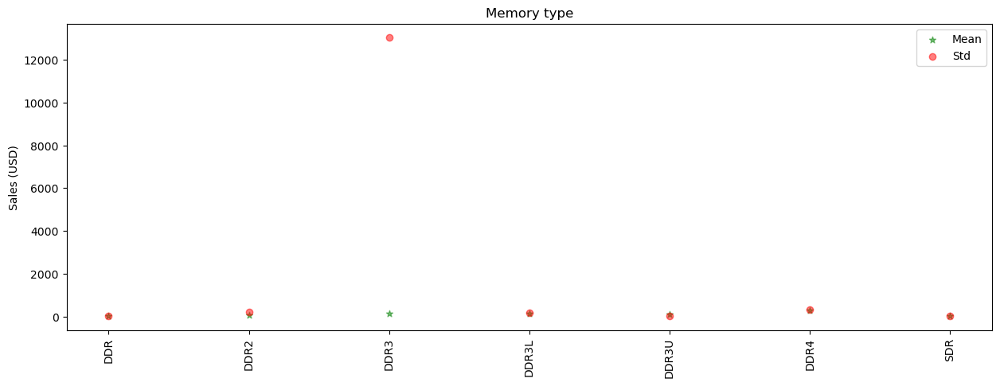

In [38]:
plt.figure(figsize=(15, 5))
plt_generate_sales_scatter(df_sales_merged, "memory_type", "Memory type")
plt.show()

The DDR3 category presents an high amount of variance compared to the others, probably due to the presence of outliers.  
Further investigations will be performed after we remove the outliers.

In [39]:
df_sales_merged.groupby("memory_type")["sales_uds"].describe()

,count,mean,std,min,25%,50%,75%,max
memory_type,,,,,,,,
DDR,100612.0,35.918339,27.980781,3.289655,19.668977,28.774918,43.382283,2.543665e+02
DDR2,361447.0,83.615612,201.959392,0.705064,22.414456,36.758714,77.009302,6.245039e+03
DDR3,1463100.0,139.607053,13032.602313,2.104936,46.783726,85.192780,155.813373,1.574134e+07
DDR3L,268999.0,152.770178,191.956660,8.787894,45.845701,86.026332,173.142330,2.327290e+03
DDR3U,3661.0,94.781882,29.204194,39.892213,72.843514,92.578759,118.616080,1.650207e+02
DDR4,1203526.0,281.865324,330.082389,3.177368,99.990000,185.245431,335.953341,4.826446e+04
SDR,10986.0,28.448155,14.134141,7.799262,17.043557,25.089772,34.230355,7.491976e+01


### Value checks

In [40]:
df_ram.describe()

,memory,clock
count,3705.000000,3705.000000
mean,16.280938,1969.170040
std,20.422881,797.256751
min,0.125000,100.000000
25%,4.000000,1333.000000
50%,8.000000,1866.000000
75%,16.000000,2400.000000
max,256.000000,4600.000000


The values are all within reasonable range, there are no apparent problems (ie 0).

In [41]:
print(df_ram["brand"].isna().any())
print(df_ram["name"].isna().any())
print(df_ram["memory_type"].isna().any())

False
False
False


No missing values.

### Correlation

In [42]:
df_ram.corr()

,memory,clock
memory,1.000000,0.331674
clock,0.331674,1.000000


The RAMs included in the dataset do not have a correlation between their clock and memory capacity. 

## Sales

In [43]:
df_sales.head()

,Id,ram_code,time_code,geo_code,vendor_code,sales_uds,sales_currency
2602347,3719,1.0,20130322,25,32,13.749032,10.65
2602348,3719,1.0,20130323,18,32,13.828708,10.65
2602349,3719,1.0,20130326,28,32,13.694297,10.65
2602350,3719,1.0,20130327,25,32,13.690530,10.65
2602351,3719,1.0,20130328,27,32,13.605216,10.65


In [44]:
df_sales.describe()

,Id,ram_code,time_code,geo_code,vendor_code,sales_uds,sales_currency
count,3.412331e+06,3.412331e+06,3.412331e+06,3.412331e+06,3.412331e+06,3.412331e+06,3.412331e+06
mean,5.257606e+03,1.539606e+03,2.016166e+07,3.293352e+01,3.949093e+01,1.814250e+02,1.590673e+02
std,8.536889e+02,8.536889e+02,1.309320e+04,1.896925e+01,1.416273e+01,8.536833e+03,5.426377e+03
min,3.719000e+03,1.000000e+00,2.013032e+07,1.000000e+00,1.000000e+00,7.050645e-01,5.000000e-01
25%,4.522000e+03,8.040000e+02,2.015112e+07,2.000000e+01,3.200000e+01,4.858296e+01,4.202000e+01
50%,5.141000e+03,1.423000e+03,2.016111e+07,2.600000e+01,3.200000e+01,9.906795e+01,8.760000e+01
75%,5.957000e+03,2.239000e+03,2.017081e+07,3.200000e+01,4.500000e+01,2.058690e+02,1.829000e+02
max,7.422000e+03,3.704000e+03,2.018041e+07,7.500000e+01,8.100000e+01,1.574134e+07,1.000000e+07


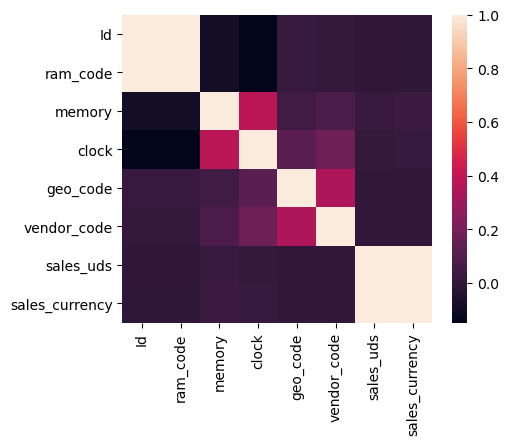

In [45]:
feat_to_drop = ["brand", "name", "memory_type", "continent", "country", "region", "currency", "name_vendor", "year", "month", "day", "week"]
num_sales_df = df_sales_merged.drop(feat_to_drop, axis=1)

plt.figure(figsize=(5,4))
sn.heatmap(num_sales_df.corr())
plt.show()

The majority of the correlation coefficients present are irrelevant, some however give us some information about the meaning of the data:  
- (ram_code, id): it implies that there is a 1-to-1 relationship between them, in other words for each id we have a single ram_code and viceversa.  
    One of these is redundant.
- (sales_uds, sales_currency): interesting indicator of the stability of the currencies, implies that the usd lost value only when the others lost it.  
    Probably due to the presence of strong currencies only.

### Id/ram_code meaning  
We want to check the relationship between them and the vendors.

In [46]:
df_sales_merged.loc[(df_sales_merged["ram_code"]+3718) != df_sales_merged["Id"]]

,Id,ram_code,brand,name,memory,memory_type,clock,time_code,year,month,...,week,geo_code,continent,country,region,currency,vendor_code,name_vendor,sales_uds,sales_currency


Again, there is 1-to-1 relationship between ram_code and Id.

In [47]:
df_sales_merged.groupby("vendor_code")["ram_code"].unique()

vendor_code
1     [448.0, 496.0, 497.0, 498.0, 507.0, 509.0, 510...
2     [113.0, 115.0, 117.0, 120.0, 144.0, 145.0, 146...
3     [48.0, 432.0, 433.0, 434.0, 435.0, 436.0, 437....
4     [48.0, 432.0, 433.0, 435.0, 436.0, 437.0, 438....
5     [15.0, 18.0, 19.0, 20.0, 21.0, 23.0, 24.0, 25....
                            ...                        
77    [444.0, 547.0, 549.0, 550.0, 552.0, 553.0, 659...
78    [225.0, 226.0, 227.0, 229.0, 230.0, 231.0, 232...
79    [432.0, 435.0, 437.0, 438.0, 439.0, 440.0, 441...
80    [14.0, 43.0, 97.0, 101.0, 108.0, 110.0, 143.0,...
81          [858.0, 861.0, 974.0, 976.0, 978.0, 1591.0]
Name: ram_code, Length: 78, dtype: object

The same vendor can have products with different ram_codes.  

In [48]:
df_sales_merged.groupby("ram_code")["vendor_code"].unique()

ram_code
1.0           [32]
2.0           [32]
3.0           [32]
4.0           [32]
5.0       [32, 68]
            ...   
3699.0        [47]
3700.0    [47, 49]
3701.0        [47]
3703.0        [47]
3704.0        [47]
Name: vendor_code, Length: 3119, dtype: object

Each product identified by ram_code can be sold by different vendors.

### geo_code meaning

In [49]:
df_sales_merged.groupby("vendor_code")["geo_code"].unique()

vendor_code
1                          [56, 53, 54, 58, 57, 55, 52]
2                          [72, 69, 75, 74, 73, 71, 70]
3     [36, 34, 39, 44, 35, 42, 40, 33, 41, 37, 43, 3...
4                                          [49, 51, 50]
5     [68, 61, 60, 63, 66, 59, 65, 2, 67, 64, 32, 17...
                            ...                        
77                                [5, 4, 6, 2, 3, 7, 1]
78                         [74, 73, 71, 72, 70, 75, 69]
79                                [2, 3, 4, 7, 5, 1, 6]
80                             [14, 12, 16, 11, 13, 15]
81          [59, 62, 68, 64, 2, 63, 60, 61, 67, 65, 66]
Name: geo_code, Length: 78, dtype: object

From this results we can infer that the relationship between geo_code and vendor_code is many-to-many.

### currency meaning

In [50]:
df_sales_merged.groupby("vendor_code")["currency"].unique()

vendor_code
1          [NZD, GBP]
2               [USD]
3               [EUR]
4          [EUR, NZD]
5     [GBP, AUD, EUR]
           ...       
77         [AUD, EUR]
78              [USD]
79         [AUD, EUR]
80         [CAD, EUR]
81         [GBP, AUD]
Name: currency, Length: 78, dtype: object

Many vendors have multiple currencies associated with their sales, this implies that the sales_currency is not tied to the vendor but to the buyer.

### Relationship between ram characteristics and price  
In this section we look into the correlation between the features of a RAM module and its price.

In [51]:
df_sales_merged.corrwith(df_sales_merged["sales_uds"])[["memory", "clock"]]

memory    0.023777
clock     0.010018
dtype: float64

It seems that there is no correlation between memory/clock characteristics and sales_uds.  
This seems counterintuitive given that this features should, together with the brand name and the memory type, be the main contributors to the price of ram.  
Let's check that aren't any problematic situations in the dataset.

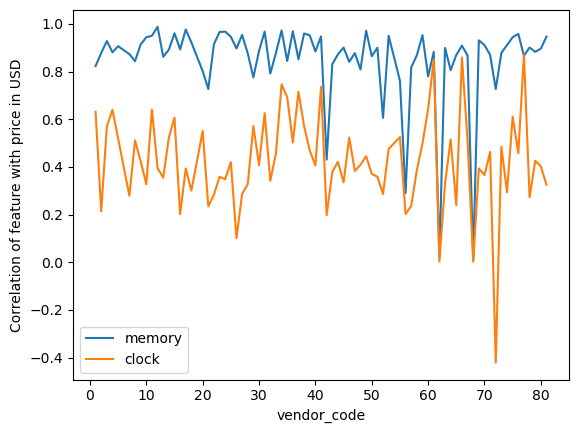

In [52]:
df_sales_merged.groupby("vendor_code")[["memory", "clock"]].corrwith(df_sales_merged["sales_uds"]).plot()
plt.ylabel("Correlation of feature with price in USD")
plt.show()

However, when grouping by vendor_code the correlation between characteristics and price is very strong except for a few vendors.  
In general the clock is not as strongly correlated, positively or negatively, to the price of the ram as it can be seen from the distribution of the correlations.

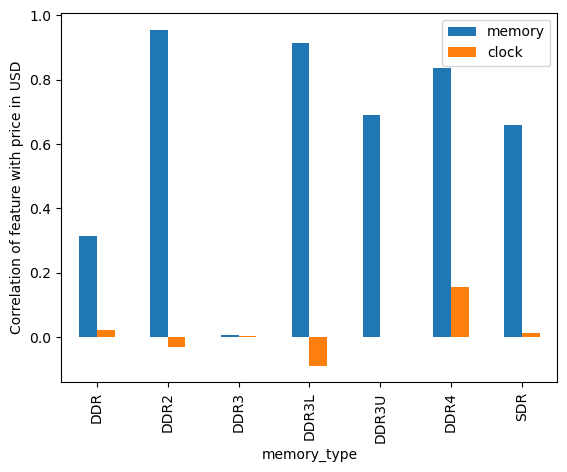

In [53]:
df_sales_merged.groupby(["memory_type"])[["memory", "clock"]].corrwith(df_sales_merged["sales_uds"]).plot(kind="bar")
plt.ylabel("Correlation of feature with price in USD")
plt.show()

The variance of the clock in DDR3U is 0 (1600 MHz), therefore the correlation is not defined.

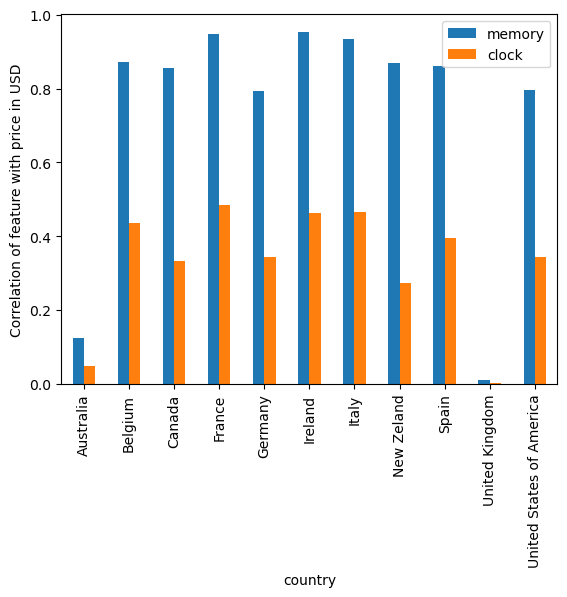

In [54]:
df_sales_merged.groupby(["country"])[["memory", "clock"]].corrwith(df_sales_merged["sales_uds"]).plot(kind="bar")
plt.ylabel("Correlation of feature with price in USD")
plt.xticks(rotation=90)
plt.show()

Whatever the problem is it seems connected with specific countries/currencies.  
Together with the findings in the previous sections, this adds further suspicions towards the data points in these categories.

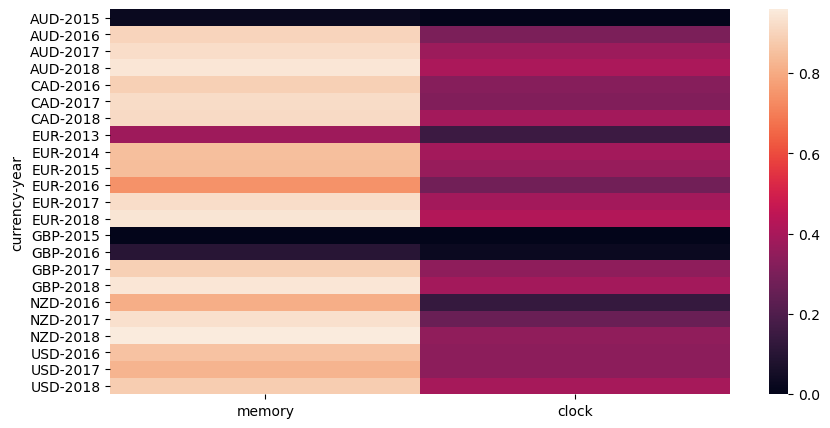

In [55]:
plt.figure(figsize=(10,5))
sn.heatmap(df_sales_merged.groupby(["currency", "year"])[["memory", "clock"]].corrwith(df_sales_merged["sales_uds"]))
plt.show()

The correlation (memory-wise) for GBP and AUD is low for the first years of sales (2015/2016), the other countries have an high correlation average (note the smallish correlation for EUR/2013).  
Let's take a deeper dive.

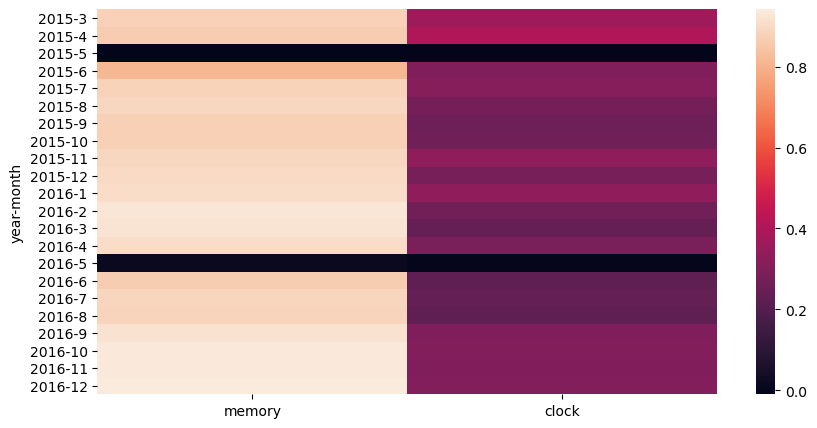

In [56]:
plt.figure(figsize=(10,5))
sn.heatmap(df_sales_merged.loc[(df_sales_merged["currency"] == "GBP") & (df_sales_merged["year"].isin([2015,2016]))]\
    .groupby(["year", "month"])[["memory", "clock"]].corrwith(df_sales_merged["sales_uds"]))
plt.show()

During the months of May 2015 and 2016 the correlation takes a nosedive, otherwise it stays fairly high.

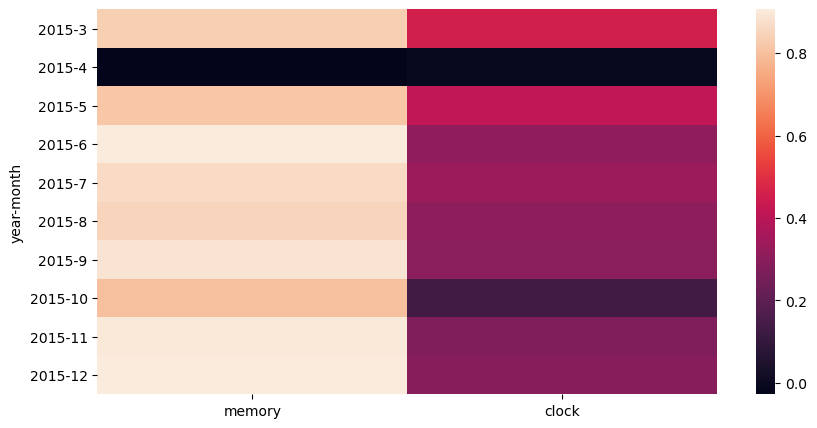

In [57]:
plt.figure(figsize=(10,5))
sn.heatmap(df_sales_merged.loc[(df_sales_merged["currency"] == "AUD") & (df_sales_merged["year"] == 2015)]\
    .groupby(["year", "month"])[["memory", "clock"]].corrwith(df_sales_merged["sales_uds"]))
plt.show()

Similar situation for the AUD, here it happens on the month of April 2015.

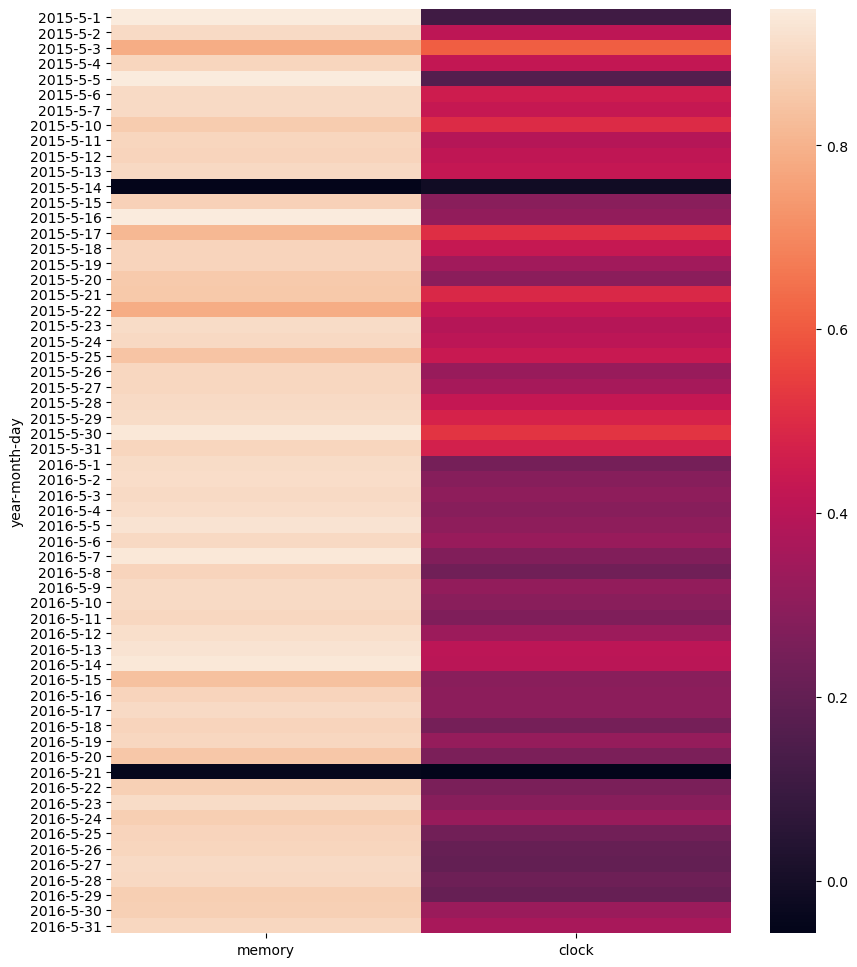

In [58]:
plt.figure(figsize=(10, 12))
sn.heatmap(df_sales_merged.loc[(df_sales_merged["currency"] == "GBP") & (df_sales_merged["year"].isin([2015,2016])) & \
                               (df_sales_merged["month"] == 5)].groupby(["year", "month", "day"])\
           [["memory", "clock"]].corrwith(df_sales_merged["sales_uds"]))
plt.show()

Really weird behaviour appears only on the 14/05/2015 and 21/05/2016.

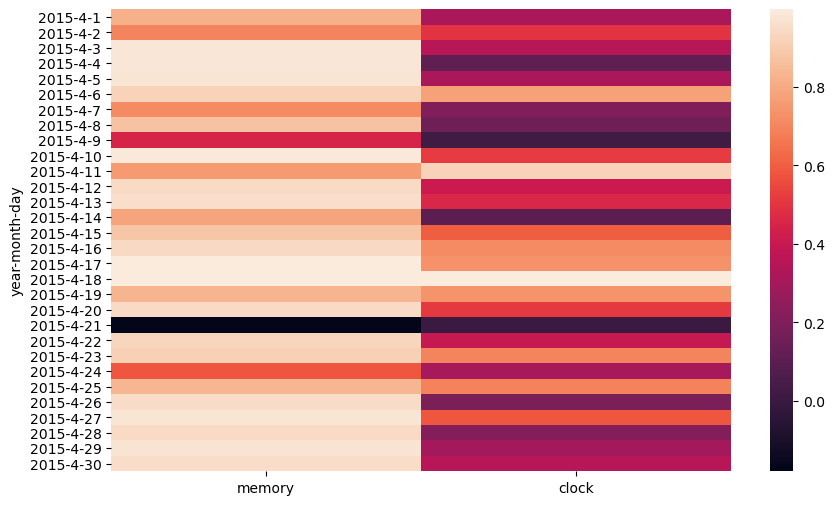

In [59]:
plt.figure(figsize=(10, 6))
sn.heatmap(df_sales_merged.loc[(df_sales_merged["currency"] == "AUD") & (df_sales_merged["year"] == 2015) & \
                               (df_sales_merged["month"] == 4)].groupby(["year", "month", "day"])[["memory", "clock"]]\
           .corrwith(df_sales_merged["sales_uds"]))
plt.show()

Here the correlation falls drastically on the 21/04/2015.

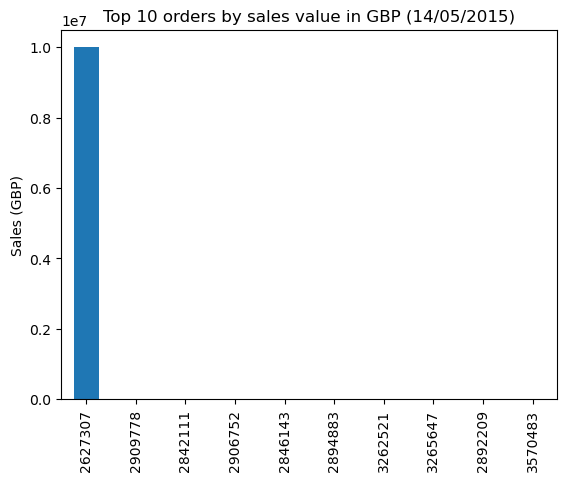

In [60]:
plt.title("Top 10 orders by sales value in GBP (14/05/2015)")
df_sales_merged.loc[(df_sales_merged["currency"] == "GBP") & (df_sales_merged["year"] == 2015) & \
                    (df_sales_merged["month"] == 5) & (df_sales_merged["day"] == 14), "sales_currency"]\
                    .sort_values(ascending=False).head(10).plot(kind="bar")
plt.ylabel("Sales (GBP)")
plt.show()

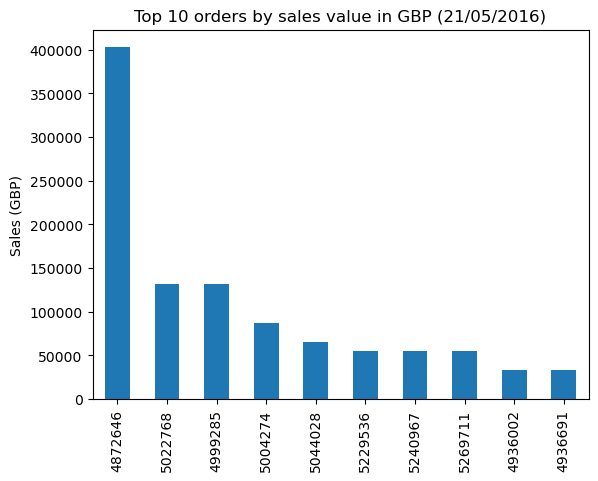

In [61]:
plt.title("Top 10 orders by sales value in GBP (21/05/2016)")
df_sales_merged.loc[(df_sales_merged["currency"] == "GBP") & (df_sales_merged["year"] == 2016) & \
                    (df_sales_merged["month"] == 5) & (df_sales_merged["day"] == 21), "sales_currency"]\
                    .sort_values(ascending=False).head(10).plot(kind="bar")
plt.ylabel("Sales (GBP)")
plt.show()

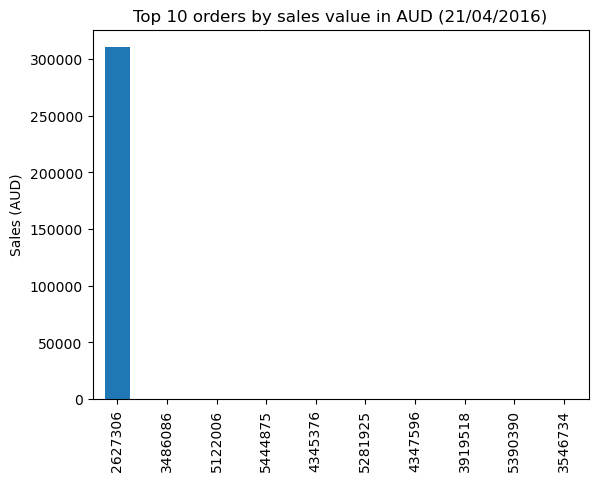

In [62]:
plt.title("Top 10 orders by sales value in AUD (21/04/2016)")
df_sales_merged.loc[(df_sales_merged["currency"] == "AUD") & (df_sales_merged["year"] == 2015) & \
                    (df_sales_merged["month"] == 4) & (df_sales_merged["day"] == 21), "sales_currency"]\
                    .sort_values(ascending=False).head(10).plot(kind="bar")
plt.ylabel("Sales (AUD)")
plt.show()

All of these dates present what we can only describe as outliers/input errors given the exorbitant price for what are otherwise subpar specs for the sold RAM.  
These values will be handled in the outlier section of the notebook.  
Mistery solved.

### Consistency of prices throughout vendors  
We want to understand if the prices for the same ram_code module are stable across vendors/countries.

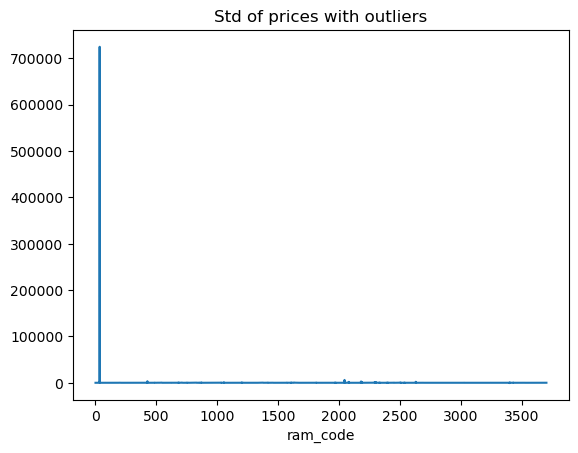

In [63]:
plt.title("Std of prices with outliers")
df_sales_merged.groupby("ram_code")["sales_uds"].std().plot()
plt.show()

In [64]:
df_sales_merged.groupby("ram_code")["sales_uds"].var().describe()

count    3.113000e+03
mean     1.687968e+08
std      9.416077e+09
min      0.000000e+00
25%      6.881601e+01
50%      4.455895e+02
75%      2.640885e+03
max      5.253631e+11
Name: sales_uds, dtype: float64

The sales value ranges a lot, there are clearly some outliers, as we have also pointed out above.  
We will come back to this topic after dealing with the outliers.  

### Value checks

In [65]:
df_sales[["sales_uds", "sales_currency"]].describe()

,sales_uds,sales_currency
count,3.412331e+06,3.412331e+06
mean,1.814250e+02,1.590673e+02
std,8.536833e+03,5.426377e+03
min,7.050645e-01,5.000000e-01
25%,4.858296e+01,4.202000e+01
50%,9.906795e+01,8.760000e+01
75%,2.058690e+02,1.829000e+02
max,1.574134e+07,1.000000e+07


The mins of these features are concerning, we will handle them as outliers later on.

### Data semantics

In [66]:
df_sales.head()

,Id,ram_code,time_code,geo_code,vendor_code,sales_uds,sales_currency
2602347,3719,1.0,20130322,25,32,13.749032,10.65
2602348,3719,1.0,20130323,18,32,13.828708,10.65
2602349,3719,1.0,20130326,28,32,13.694297,10.65
2602350,3719,1.0,20130327,25,32,13.690530,10.65
2602351,3719,1.0,20130328,27,32,13.605216,10.65


* Id: Id and ram_code are virtually the same, they identify the type of ram sold by the vendor. For each Id there is only a type of ram sold. Different vendors can have orders with the same Id/ram_code.
* ram_code: see above
* time_code: identifies the date in which the ram was sold by the vendor
* geo_code: identifies the location in which the ram was sold/sent
* vendor_code: identifies the vendor that carried out the transaction
* sales_uds: identifies the value of the sale in us dollars
* sales_currency: identifies the value of the sale in the local currency of the country in which it was sold

## Time

In [67]:
df_time

,time_code,year,month,day,week
0,20130322,2013,3,22,12
1,20130323,2013,3,23,12
2,20130326,2013,3,26,13
3,20130327,2013,3,27,13
4,20130328,2013,3,28,13
...,...,...,...,...,...
1841,20180408,2018,4,8,14
1842,20180409,2018,4,9,15
1843,20180410,2018,4,10,15
1844,20180411,2018,4,11,15


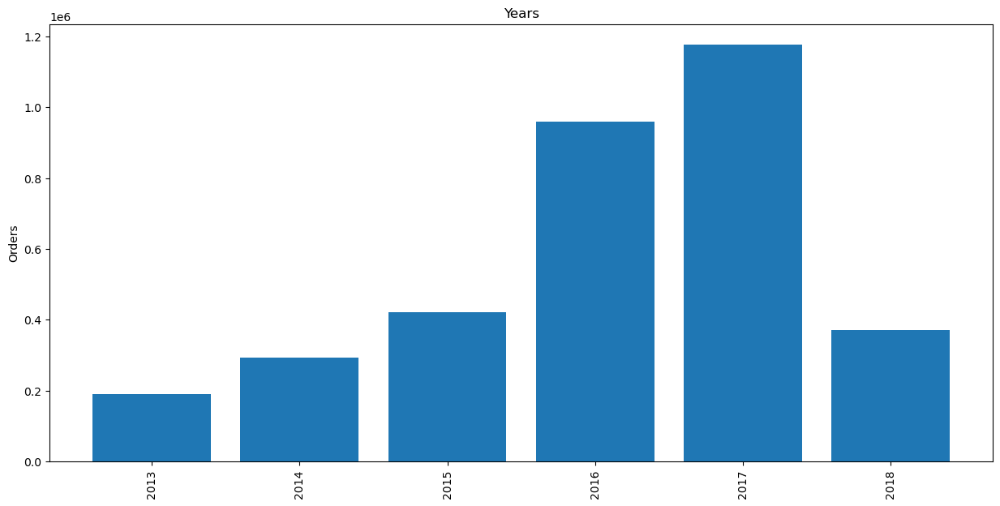

In [68]:
plt.figure(figsize=(15, 7))
plt.title("Years")
labels, counts = np.unique(df_sales_merged["year"], return_counts=True)
plt.bar(labels, counts, align='center')
plt.ylabel("Orders")
plt.xticks(rotation = 90)
plt.show()

Even though the sales seem to drop a lot in 2018, this is due to the dataset stopping at May 2018.

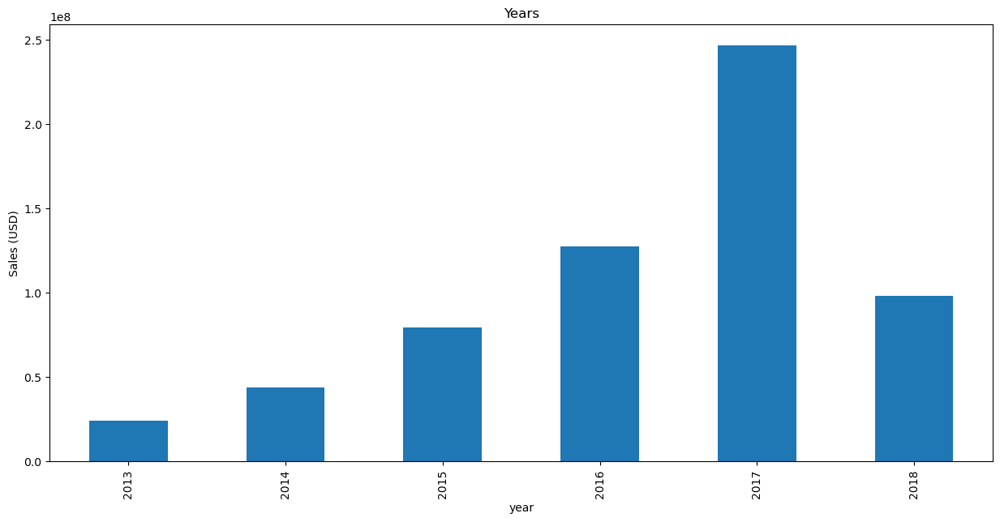

In [69]:
plt.figure(figsize=(15, 7))
plt.title("Years")
df_sales_merged.groupby("year")["sales_uds"].sum().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xticks(rotation = 90)
plt.show()

Compared to 2016, in 2017 the average sale value of the items increased.

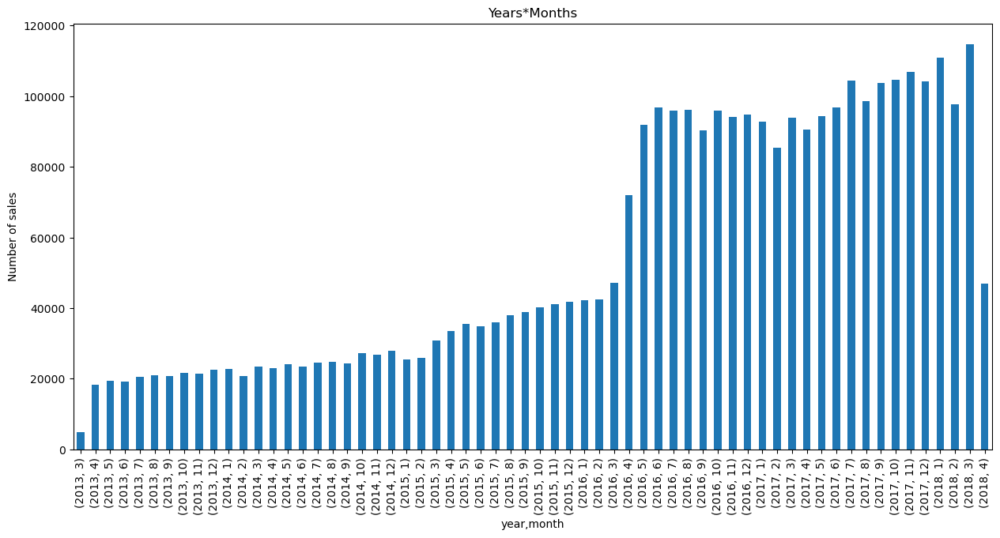

In [70]:
plt.figure(figsize=(15, 7))
plt.title("Years*Months")
df_sales_merged.groupby(["year", "month"]).size().plot(kind="bar")
plt.ylabel("Number of sales")
plt.xticks(rotation = 90)
plt.show()

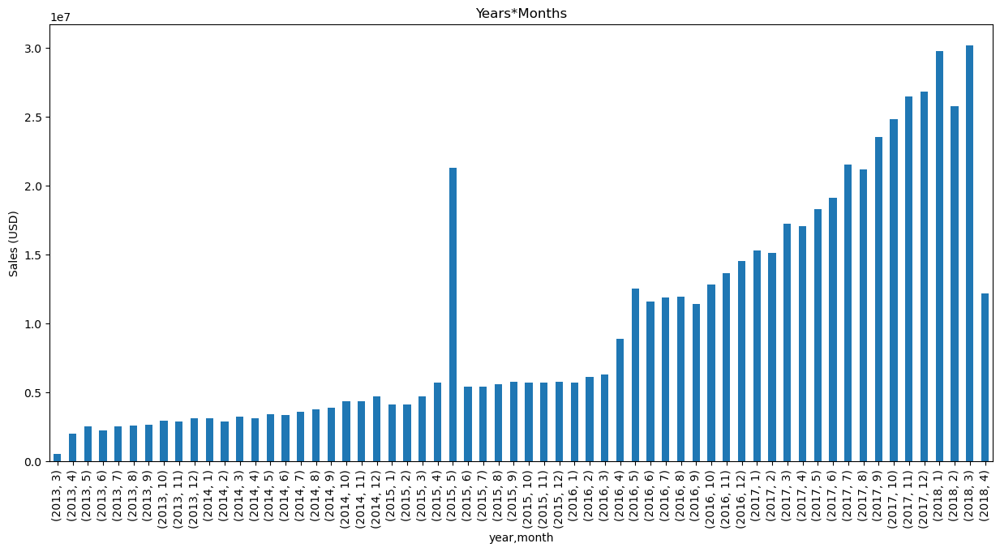

In [71]:
plt.figure(figsize=(15, 7))
plt.title("Years*Months")
df_sales_merged.groupby(["year", "month"])["sales_uds"].sum().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xticks(rotation = 90)
plt.show()

Just by looking at the first months of 2018 we can see that the sales were on track to reach a record level compared to the previous years.  
We will deal with the outlier in 05/2015 later on.

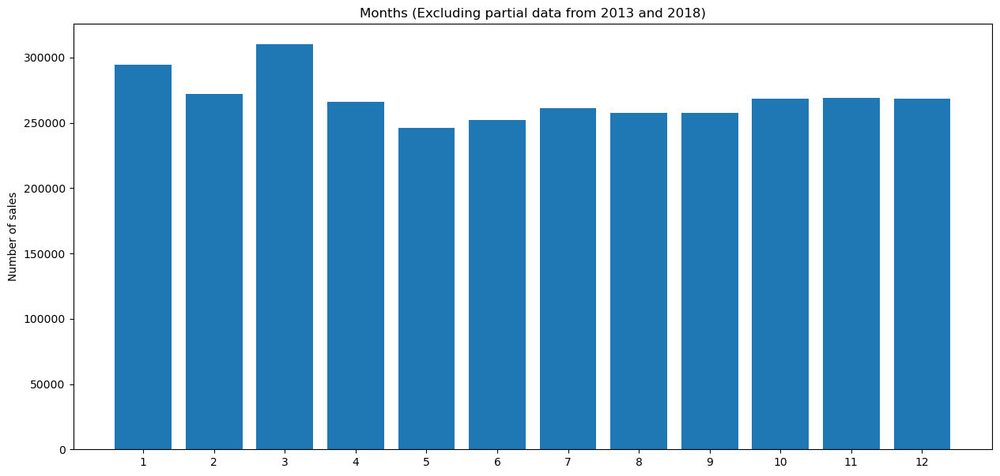

In [72]:
plt.figure(figsize=(15, 7))
plt.title("Months (Excluding partial data from 2013 and 2018)")
full_year_df = df_sales_merged.loc[(df_sales_merged["year"] > 2013) & (df_sales_merged["year"] <= 2018), "month"]
labels, counts = np.unique(full_year_df, return_counts=True)
plt.bar(labels, counts, align='center')
plt.ylabel("Number of sales")
plt.xticks(np.arange(1,13))
plt.show()

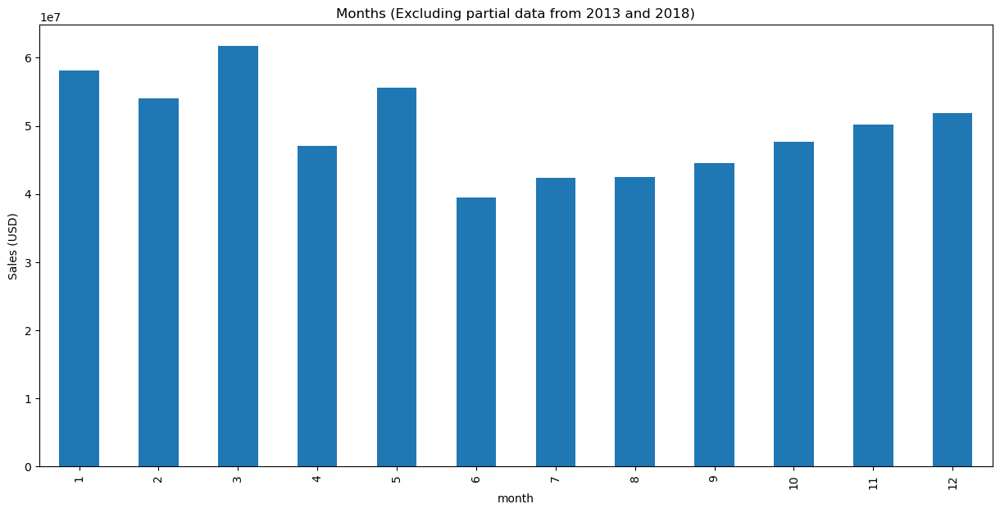

In [73]:
plt.figure(figsize=(15, 7))
plt.title("Months (Excluding partial data from 2013 and 2018)")
full_year_df = df_sales_merged.loc[(df_sales_merged["year"] > 2013) & (df_sales_merged["year"] <= 2018)].groupby("month")["sales_uds"].sum()
full_year_df.plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.show()

We were expecting for an increase in sale/orders during the festivities, this doesn't seem to be the case.

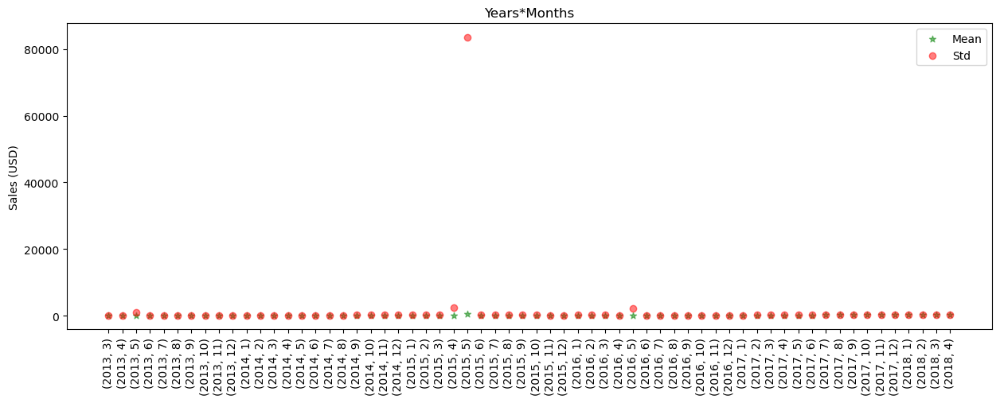

In [74]:
plt.figure(figsize=(15, 5))
plt_generate_sales_scatter(df_sales_merged, ["year", "month"], "Years*Months")
plt.show()

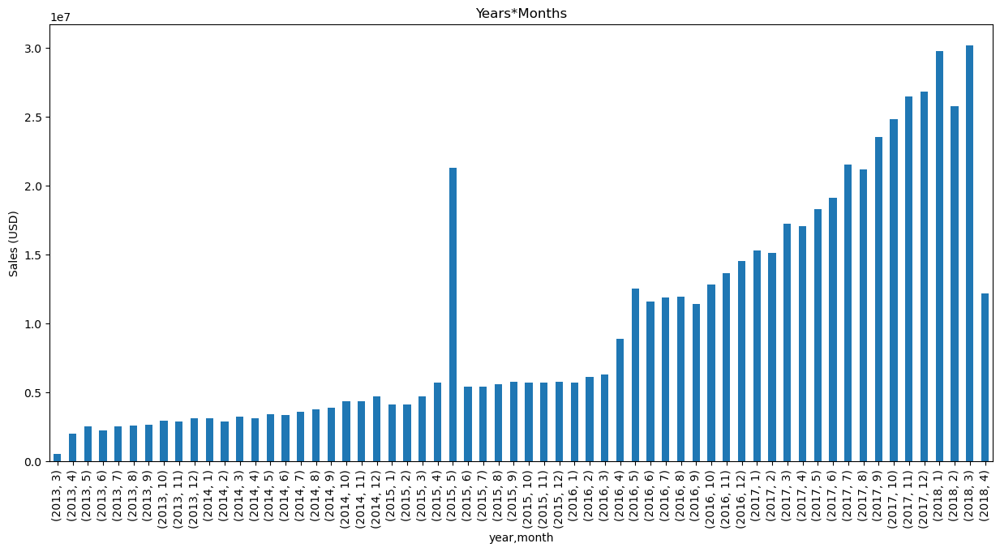

In [75]:
plt.figure(figsize=(15, 7))
plt.title("Years*Months")
df_sales_merged.groupby(["year", "month"])["sales_uds"].sum().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.xticks(rotation = 90)
plt.show()

Confirms that there is something going on during the month of May 2015.

### Value checks

In [76]:
df_time.describe()

,time_code,year,month,day,week
count,1.840000e+03,1840.000000,1840.000000,1840.000000,1840.000000
mean,2.015324e+07,2015.257609,6.497283,15.734239,26.917935
std,1.488919e+04,1.496033,3.441738,8.813179,15.044119
min,2.013032e+07,2013.000000,1.000000,1.000000,1.000000
25%,2.014063e+07,2014.000000,4.000000,8.000000,14.000000
50%,2.015101e+07,2015.000000,6.000000,16.000000,27.000000
75%,2.017011e+07,2017.000000,9.250000,23.000000,40.000000
max,2.018041e+07,2018.000000,12.000000,31.000000,53.000000


No suspicious values here.

In [77]:
print(f"Duplicated time_code values: {df_time['time_code'].duplicated().any()}")
print(f"Presence of NaN in the dataset: {df_time.isna().any().any()}")

Duplicated time_code values: False
Presence of NaN in the dataset: False


## Vendor

In [78]:
df_vendor.head()

,vendor_code,name
0,1,1stWave Technologies
1,2,Adorama
2,3,Alternate
3,4,Alternate Italia
4,5,Alza


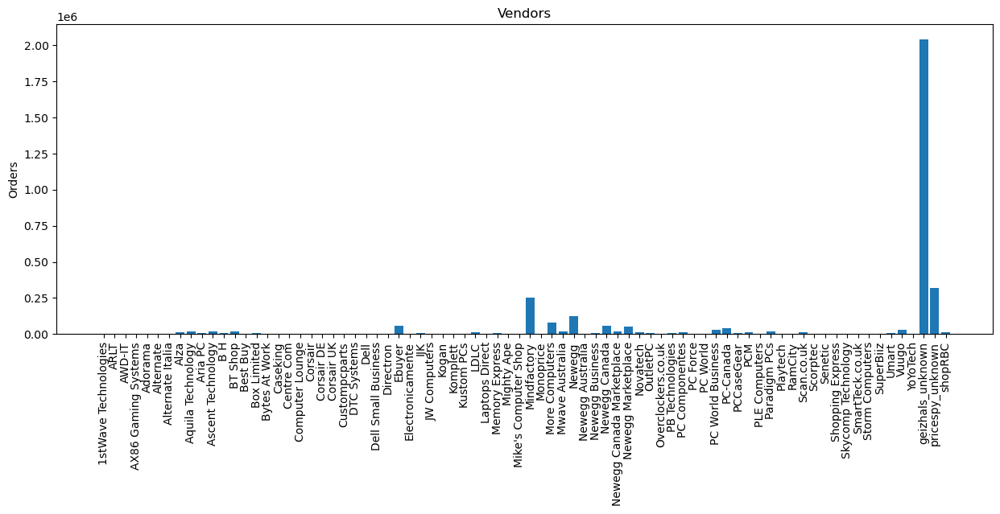

In [79]:
plt.figure(figsize=(15, 5))
plt.title("Vendors")
labels, counts = np.unique(df_sales_merged["name_vendor"], return_counts=True)
plt.bar(labels, counts, align='center')
plt.xticks(rotation = 90)
plt.ylabel("Orders")
plt.show()

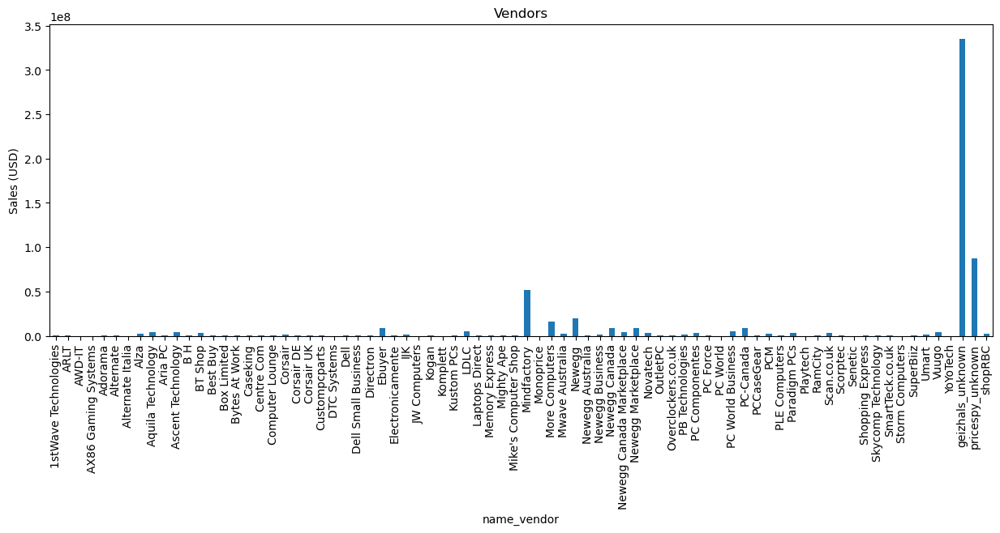

In [80]:
plt.figure(figsize=(15, 5))
plt.title("Vendors")
df_sales_merged.groupby("name_vendor")["sales_uds"].sum().plot(kind="bar")
plt.xticks(rotation = 90)
plt.ylabel("Sales (USD)")
plt.show()

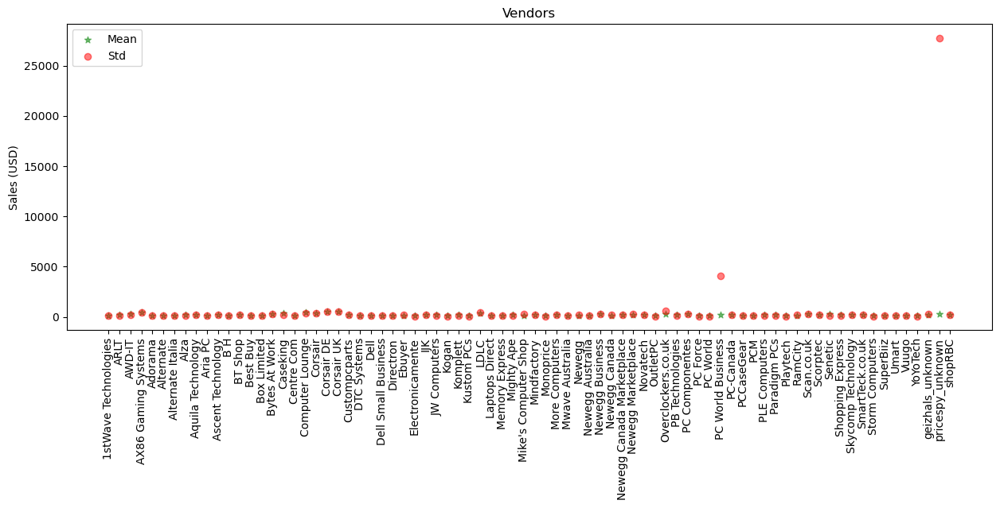

In [81]:
plt.figure(figsize=(15, 5))
plt_generate_sales_scatter(df_sales_merged, "name_vendor", "Vendors")
plt.show()

Note that the two biggest vendors (geizhals_unknown and pricespy_unknown) are price comparison engines, while Mindfactory is a real one.  
We assume that the "unknown" part is used to avoid mentioning smallers vendors featured on the websites.

### Value checks

In [82]:
df_vendor.describe()

,vendor_code
count,78.000000
mean,41.564103
std,23.459603
min,1.000000
25%,22.250000
50%,41.500000
75%,61.750000
max,81.000000


In [83]:
print(f"Number of vendors: {len(df_vendor['name'].unique())}")

print(df_vendor["name"].isna().any())
print("" in df_vendor["name"].unique())

Number of vendors: 78
False
False


In [84]:
df_vendor.groupby(["vendor_code" ,"name"]).size().transform(lambda x: True if x>1 else False).any()

False

No duplicates or missing values in sight.

# Task 1.2: Data preparation

## Auxiliary functions

In [85]:
# Note: run %matplotlib notebook to enable interactivity
def plot_3d_scatter(data_points_list, labels_list=None):
    
    if(labels_list):
        if(len(data_points_list) != len(labels_list)):
            raise RuntimeError
        
    list_size = len(data_points_list)
    fig = plt.figure(figsize=(15,10))
    
    for i in range(list_size):
        
        ax = fig.add_subplot((list_size+1)//2, 2, i+1, projection='3d') #row, column, index
        X = data_points_list[i].copy()
        
        if(labels_list):
            
            if(len(data_points_list[i]) != len(labels_list[i])):
                raise RuntimeError

            X["label"] = labels_list[i]

            for l in np.unique(labels_list[i]):
                ax.scatter(X.loc[X.label == l, 0], X.loc[X.label == l, 1], X.loc[X.label == l, 2],
                           cmap=plt.get_cmap("Pastel1"),
                           s=20, edgecolor='k')
        else:
            ax.scatter(X[0], X[1], X[2], s=20, edgecolor='k')

## Outliers

All the datasets except Sales contain the description of a particular code (ie ram_code), we are therefore gonna assume that there is no point in looking for outliers there since they are just identifiers of different "objects".  
We will just focus on the Sales dataset and in particular on sales_uds and sales_currency, given that from the analysis above we already know of the presence of outliers.

In [86]:
df_sales.head()

,Id,ram_code,time_code,geo_code,vendor_code,sales_uds,sales_currency
2602347,3719,1.0,20130322,25,32,13.749032,10.65
2602348,3719,1.0,20130323,18,32,13.828708,10.65
2602349,3719,1.0,20130326,28,32,13.694297,10.65
2602350,3719,1.0,20130327,25,32,13.690530,10.65
2602351,3719,1.0,20130328,27,32,13.605216,10.65


In [87]:
zscore_sample = df_sales[["sales_uds", "sales_currency"]].values
scaler = StandardScaler()
scaler.fit(zscore_sample)
norm_zscore_sample = scaler.transform(zscore_sample)

#Dataframe containing the standardised features
df_sales_zscore = pd.DataFrame(norm_zscore_sample, index=df_sales.index)

#Dataframe with only the features that we are currently analysing
df_sales_cur = df_sales[["sales_uds", "sales_currency"]]

We normalise the dataset since we are dealing with (marginally) different units (USD vs local currency).

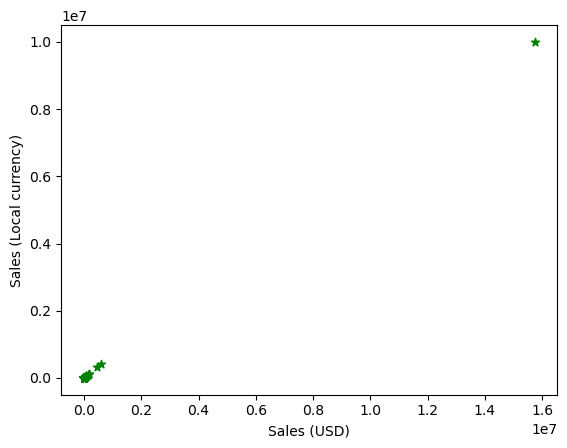

In [88]:
plt.scatter(df_sales_cur["sales_uds"], df_sales_cur["sales_currency"], color='g', marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")
plt.show()

The plot for now is too zoomed-out to tells us something about the structure of the dataset.  
We will revisit it for each outlier detection technique used.

### IQR approach  
Here we will use the boxplot whiskers to determine which data points are outliers of the respective features, we will then take the union of the two outliers set obtained in order to have a complete picture.

In [89]:
Q1 = df_sales_cur.quantile(0.25)
Q3 = df_sales_cur.quantile(0.75)
IQR = Q3 - Q1
right_whisker = Q3 + 1.5*IQR
left_whisker = Q1 - 1.5*IQR

In [90]:
print(f"Sale USD 2.5-quantile: {df_sales_cur['sales_uds'].quantile(0.025)}")
print(f"Sale USD 97.5-quantile: {df_sales_cur['sales_uds'].quantile(0.975)}")
print(f"Sale Local 2.5-quantile: {df_sales_cur['sales_currency'].quantile(0.025)}")
print(f"Sale Local 97.5-quantile: {df_sales_cur['sales_currency'].quantile(0.975)}\n")

print(f"Left whisker:\n{left_whisker[['sales_uds', 'sales_currency']]}\n")
print(f"Right whisker:\n{right_whisker[['sales_uds', 'sales_currency']]}")

Sale USD 2.5-quantile: 16.299072780775
Sale USD 97.5-quantile: 811.7509082622499
Sale Local 2.5-quantile: 13.79
Sale Local 97.5-quantile: 707.65624999995

Left whisker:
sales_uds        -187.346128
sales_currency   -169.300000
dtype: float64

Right whisker:
sales_uds         441.798115
sales_currency    394.220000
dtype: float64


Note that the left whisker is negative, while the dataset doesn't contain any negative value.  
This is probably a consequence of a skewed distribution.

In [91]:
df_wo_out_iqr = df_sales_cur.copy()
outliers_iqr = df_sales_cur.copy()

df_wo_out_iqr = df_wo_out_iqr.loc[(df_wo_out_iqr["sales_uds"] >= left_whisker["sales_uds"]) & (df_wo_out_iqr["sales_uds"] <= right_whisker["sales_uds"])]
df_wo_out_iqr = df_wo_out_iqr.loc[(df_wo_out_iqr["sales_currency"] >= left_whisker["sales_currency"]) & (df_wo_out_iqr["sales_currency"] <= right_whisker["sales_currency"])]

outliers_iqr = outliers_iqr.loc[(outliers_iqr["sales_uds"] < left_whisker["sales_uds"]) | (outliers_iqr["sales_uds"] > right_whisker["sales_uds"])]
outliers_iqr = outliers_iqr.loc[(outliers_iqr["sales_currency"] < left_whisker["sales_currency"]) | (outliers_iqr["sales_currency"] > right_whisker["sales_currency"])]

df_size_diff = df_sales_cur.shape[0]-df_wo_out_iqr.shape[0]
print(f'The number of total outliers in the dataset is: {df_size_diff}')
print(f'That is {df_size_diff*100/df_sales.shape[0]:3.2f}% of the total entries.')

The number of total outliers in the dataset is: 309760
That is 9.08% of the total entries.


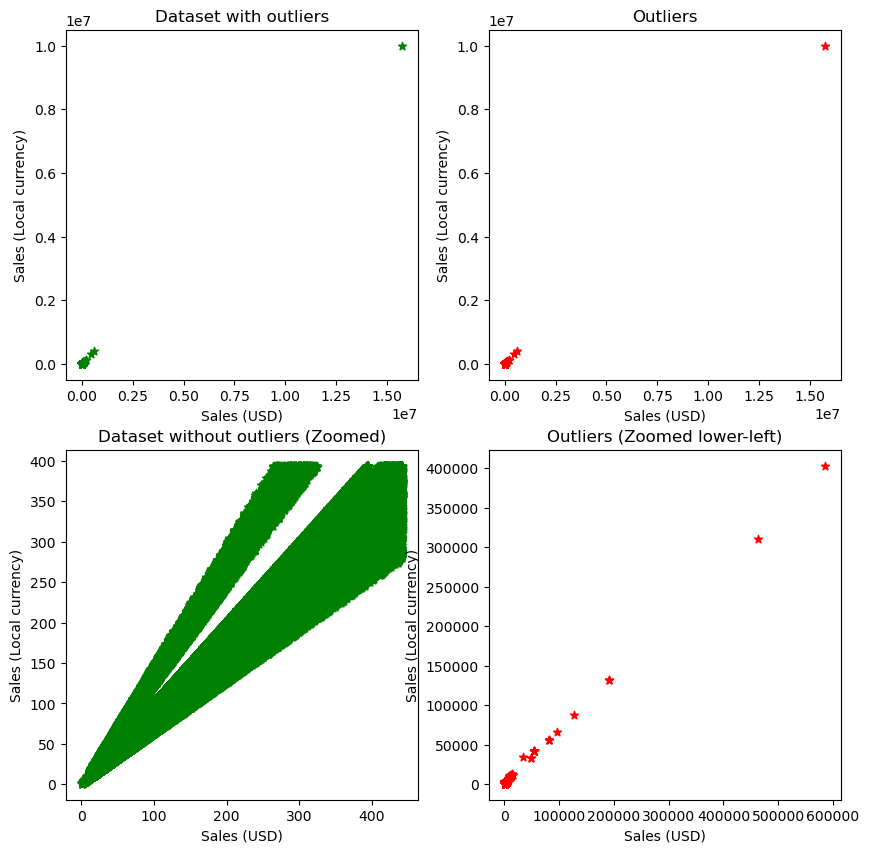

In [92]:
fig = plt.figure(figsize=(10, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Dataset with outliers")
init_axes = \
    plt.scatter(df_sales["sales_uds"], df_sales["sales_currency"], 
                color="g", marker='*', label='Standard').axes
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Outliers")
plt.scatter(outliers_iqr["sales_uds"], outliers_iqr["sales_currency"], color="r", marker='*', label='Standard')
#Keep the same axis size for all the subplots
plt.xlim(min(init_axes.viewLim.intervalx), max(init_axes.viewLim.intervalx))
plt.ylim(min(init_axes.viewLim.intervaly), max(init_axes.viewLim.intervaly))
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.subplot2grid(fig_dims, (1, 0))
plt.title("Dataset without outliers (Zoomed)")
plt.scatter(df_wo_out_iqr["sales_uds"], df_wo_out_iqr["sales_currency"], color="g", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

lower_left_outlier = outliers_iqr.loc[(outliers_iqr["sales_uds"] < 10**7) & (outliers_iqr["sales_currency"] < 10**7)]
plt.subplot2grid(fig_dims, (1, 1))
plt.title("Outliers (Zoomed lower-left)")
plt.scatter(lower_left_outlier["sales_uds"], lower_left_outlier["sales_currency"], color="r", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.show()

This kind of outlier detection doesn't seem promising since an uncomfortable amount of data points (~9%) is classified as outliers.

In [93]:
outliers_iqr.min()

sales_uds         441.799162
sales_currency    394.227000
dtype: float64

Note that this method doesn't impact the low end of extreme values (very close to 0) since the left whisker is negative.

#### Using Box-Cox transformation  
In this section we apply the Box-Cox transformation in order to work with a distribution that approximates a normal one and see if we obtain better results.

In [94]:
boxcox_t_uds = stats.boxcox(df_sales_cur["sales_uds"])
boxcox_t_currency = stats.boxcox(df_sales_cur["sales_currency"])

df_boxcox = pd.DataFrame({"sales_uds":boxcox_t_uds[0], "sales_currency":boxcox_t_currency[0]}, index=df_sales_cur.index)

In [95]:
Q1 = df_boxcox.quantile(0.25)
Q3 = df_boxcox.quantile(0.75)
IQR = Q3 - Q1
right_whisker = Q3 + 1.5*IQR
left_whisker = Q1 - 1.5*IQR

In [96]:
print(f"Sale USD 2.5-quantile: {df_boxcox['sales_uds'].quantile(0.025)}")
print(f"Sale USD 97.5-quantile: {df_boxcox['sales_uds'].quantile(0.975)}")
print(f"Sale Local 2.5-quantile: {df_boxcox['sales_currency'].quantile(0.025)}")
print(f"Sale Local 97.5-quantile: {df_boxcox['sales_currency'].quantile(0.975)}\n")

print(f"Left whisker:\n{left_whisker[['sales_uds', 'sales_currency']]}\n")
print(f"Right whisker:\n{right_whisker[['sales_uds', 'sales_currency']]}")

Sale USD 2.5-quantile: 2.5918982525276864
Sale USD 97.5-quantile: 5.626014761240964
Sale Local 2.5-quantile: 2.4812015110370957
Sale Local 97.5-quantile: 5.716736397698878

Left whisker:
sales_uds         1.813329
sales_currency    1.632826
dtype: float64

Right whisker:
sales_uds         6.324210
sales_currency    6.486441
dtype: float64


Here the left whisker has a positive value, making it usable.

In [97]:
df_wo_out_iqrcox = df_boxcox.copy()
outliers_iqrcox = df_boxcox.copy()

df_wo_out_iqrcox = df_wo_out_iqrcox.loc[(df_wo_out_iqrcox["sales_uds"] >= left_whisker["sales_uds"]) & (df_wo_out_iqrcox["sales_uds"] <= right_whisker["sales_uds"])]
df_wo_out_iqrcox = df_wo_out_iqrcox.loc[(df_wo_out_iqrcox["sales_currency"] >= left_whisker["sales_currency"]) & (df_wo_out_iqrcox["sales_currency"] <= right_whisker["sales_currency"])]

outliers_iqrcox = outliers_iqrcox.loc[(outliers_iqrcox["sales_uds"] < left_whisker["sales_uds"]) | (outliers_iqrcox["sales_uds"] > right_whisker["sales_uds"])]
outliers_iqrcox = outliers_iqrcox.loc[(outliers_iqrcox["sales_currency"] < left_whisker["sales_currency"]) | (outliers_iqrcox["sales_currency"] > right_whisker["sales_currency"])]

df_size_diff = df_sales_cur.shape[0]-df_wo_out_iqrcox.shape[0]
print(f'The number of total outliers in the dataset is: {df_size_diff}')
print(f'That is {df_size_diff*100/df_sales.shape[0]:3.2f}% of the total entries.')

The number of total outliers in the dataset is: 10733
That is 0.31% of the total entries.


These results are really promising, let's check the plot of the original (pre-transformation) values.

In [98]:
df_wo_out_iqrcox = df_sales_cur.loc[df_wo_out_iqrcox.index]
outliers_iqrcox = df_sales_cur.loc[outliers_iqrcox.index]

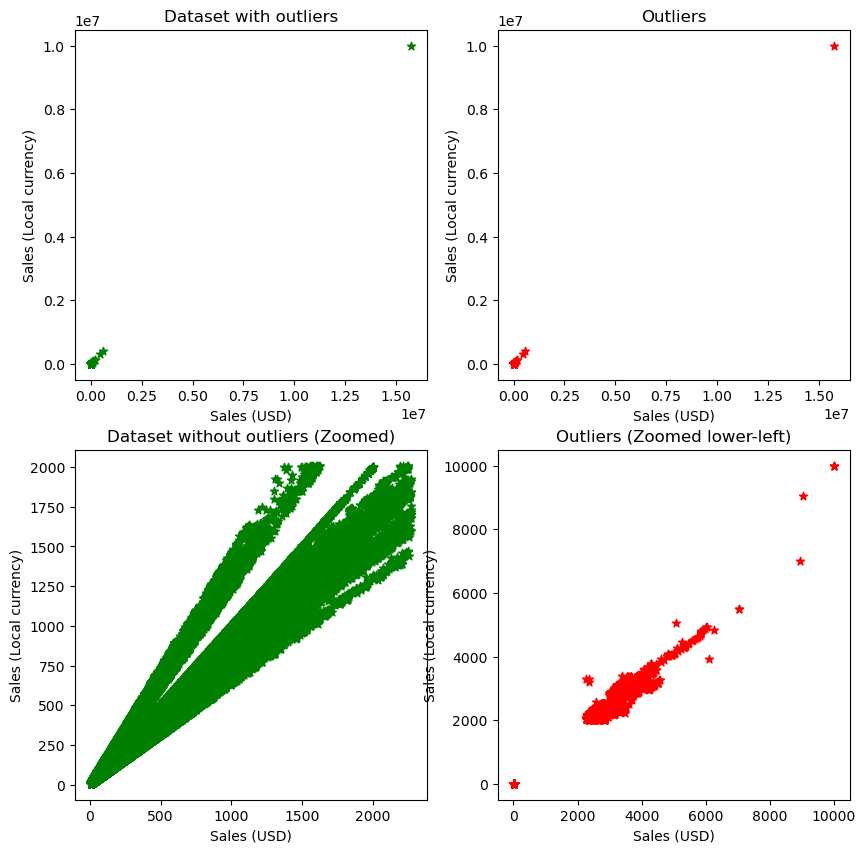

In [99]:
fig = plt.figure(figsize=(10, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Dataset with outliers")
init_axes = \
    plt.scatter(df_sales["sales_uds"], df_sales["sales_currency"], 
                color="g", marker='*', label='Standard').axes
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Outliers")
plt.scatter(outliers_iqrcox["sales_uds"], outliers_iqrcox["sales_currency"], color="r", marker='*', label='Standard')
#Keep the same axis size for all the subplots
plt.xlim(min(init_axes.viewLim.intervalx), max(init_axes.viewLim.intervalx))
plt.ylim(min(init_axes.viewLim.intervaly), max(init_axes.viewLim.intervaly))
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.subplot2grid(fig_dims, (1, 0))
plt.title("Dataset without outliers (Zoomed)")
plt.scatter(df_wo_out_iqrcox["sales_uds"], df_wo_out_iqrcox["sales_currency"], color="g", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

lower_left_outlier = outliers_iqrcox.loc[(outliers_iqrcox["sales_uds"] < 10**4) & (outliers_iqrcox["sales_currency"] < 10**4)]
plt.subplot2grid(fig_dims, (1, 1))
plt.title("Outliers (Zoomed lower-left)")
plt.scatter(lower_left_outlier["sales_uds"], lower_left_outlier["sales_currency"], color="r", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.show()

The results here are visually great, especially considering the fact that we are removing less than 1% of the data and keeping a healthy range of values greater than 500.  
However, compared to the other methods tested it seems that this approach is a bit overzealous in excluding data points.

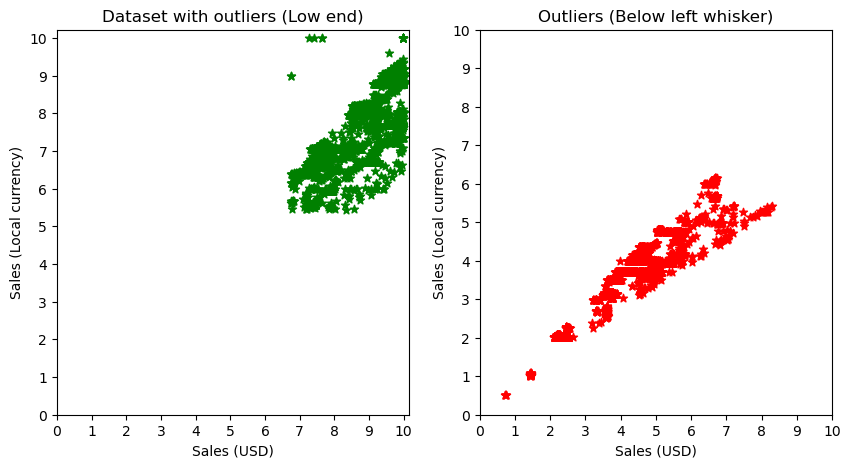

Number of outliers with value < 10: 6288


In [100]:
fig = plt.figure(figsize=(10, 5)) 
fig_dims = (1, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Dataset with outliers (Low end)")
df_lowend_iqrcox = df_wo_out_iqrcox.loc[(df_wo_out_iqrcox["sales_uds"] < 10) & (df_wo_out_iqrcox["sales_currency"] < 10)]
plt.scatter(df_lowend_iqrcox["sales_uds"], df_lowend_iqrcox["sales_currency"], color="g", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")
plt.xticks(np.arange(11))
plt.yticks(np.arange(11))

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Outliers (Below left whisker)")
lowend_outliers_cox = df_boxcox.loc[(df_boxcox["sales_uds"] < left_whisker["sales_uds"]) | \
                                (df_boxcox["sales_currency"] < left_whisker["sales_currency"])]
lowend_outliers = df_sales_cur.loc[lowend_outliers_cox.index]
plt.scatter(lowend_outliers["sales_uds"], lowend_outliers["sales_currency"], color="r", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")
plt.xticks(np.arange(11))
plt.yticks(np.arange(11))

plt.show()

print(f"Number of outliers with value < 10: {lowend_outliers_cox.shape[0]}")

All entries with a value in USD smaller than 8 dollars have been removed, this might not be reasonable for older/smaller capacity ram however the mins are too low (<1$) to be kept.

### Local Outlier Factor  
TODO: explain

In [101]:
#The value of 20 is the recommended one when dealing with datasets with a low percentage of outliers
clf = LocalOutlierFactor(n_neighbors=20)
#Note that we are using the zscore transformation of the values in order to find the outliers
pred_array = clf.fit_predict(df_sales_zscore)

outliers_index = []
for i in range(len(pred_array)):
    if pred_array[i] == -1:
        outliers_index.append(i)

In [102]:
lof_out_df = df_sales.iloc[outliers_index]
df_wo_out_lof = df_sales.loc[~df_sales.index.isin(lof_out_df.index)]

In [103]:
print(f'The number of total outliers in the dataset is: {len(outliers_index)}')
print(f'That is {len(outliers_index)*100/df_sales.shape[0]:3.2f}% of the total entries.')

The number of total outliers in the dataset is: 69631
That is 2.04% of the total entries.


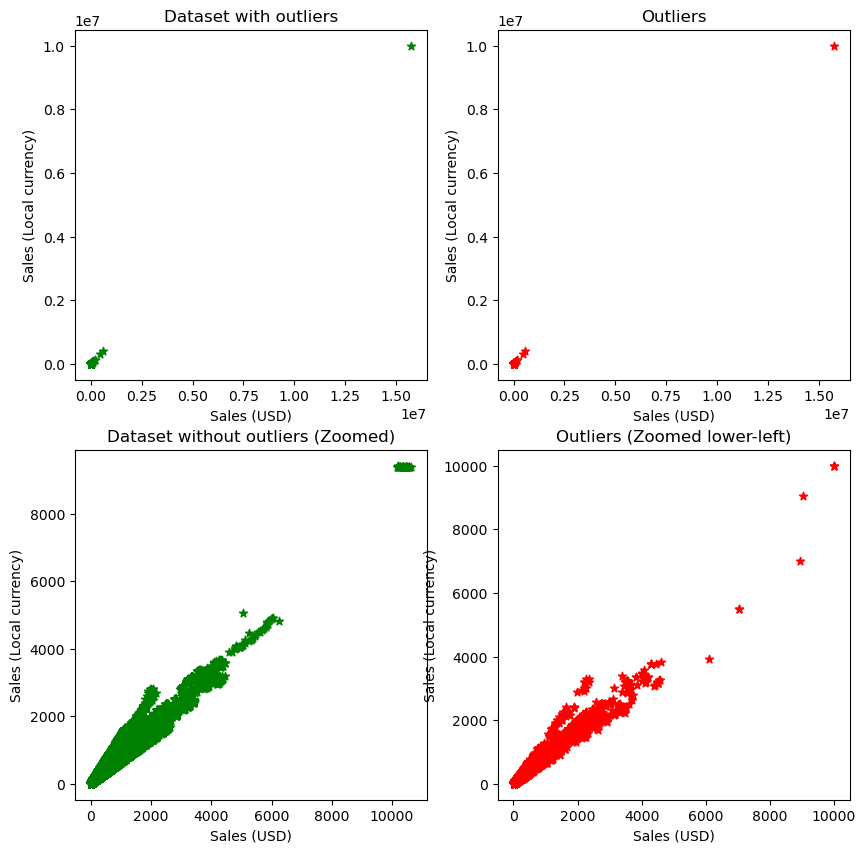

In [104]:
fig = plt.figure(figsize=(10, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Dataset with outliers")
init_axes = \
    plt.scatter(df_sales["sales_uds"], df_sales["sales_currency"], 
                color="g", marker='*', label='Standard').axes
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Outliers")
plt.scatter(lof_out_df["sales_uds"], lof_out_df["sales_currency"], color="r", marker='*', label='Standard')
#Keep the same axis size for all the subplots
plt.xlim(min(init_axes.viewLim.intervalx), max(init_axes.viewLim.intervalx))
plt.ylim(min(init_axes.viewLim.intervaly), max(init_axes.viewLim.intervaly))
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.subplot2grid(fig_dims, (1, 0))
plt.title("Dataset without outliers (Zoomed)")
plt.scatter(df_wo_out_lof["sales_uds"], df_wo_out_lof["sales_currency"], color="g", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

lower_left_outlier = lof_out_df.loc[(lof_out_df["sales_uds"] < 10**4) & (lof_out_df["sales_currency"] < 10**4)]
plt.subplot2grid(fig_dims, (1, 1))
plt.title("Outliers (Zoomed lower-left)")
plt.scatter(lower_left_outlier["sales_uds"], lower_left_outlier["sales_currency"], color="r", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.show()

The method performs reasonably well, it doesn't reduce the range of values available as aggresively as IQR and it's not as computationally expensive as BIRCH.  
Interestingly it doesn't consider all values greater than 8000 as outliers unlike the other methods, we choose to keep these datapoints because their distance to the main cluster of points is relatively small compared to the distance to the outliers removed. 

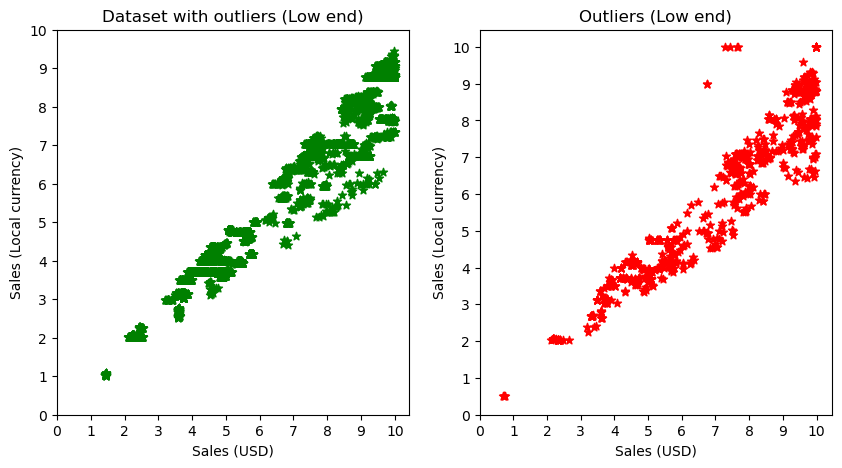

Number of outliers with value < 10: 937


In [105]:
fig = plt.figure(figsize=(10, 5)) 
fig_dims = (1, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Dataset with outliers (Low end)")
df_lowend_lof = df_wo_out_lof.loc[(df_wo_out_lof["sales_uds"] < 10) & (df_wo_out_lof["sales_currency"] < 10)]
plt.scatter(df_lowend_lof["sales_uds"], df_lowend_lof["sales_currency"], color="g", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")
plt.xticks(np.arange(11))
plt.yticks(np.arange(11))

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Outliers (Low end)")
lowend_outliers_lof = lof_out_df.loc[(lof_out_df["sales_uds"] < 10) & (lof_out_df["sales_currency"] < 10)]
plt.scatter(lowend_outliers_lof["sales_uds"], lowend_outliers_lof["sales_currency"], color="r", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")
plt.xticks(np.arange(11))
plt.yticks(np.arange(11))

plt.show()

print(f"Number of outliers with value < 10: {lowend_outliers_lof.shape[0]}")

This method also tooks care of some smaller values, however it removed just a fraction of the lower-end outliers.  
Note that it left some values < 2 while removing the ones < 1.

## Clustering approach

TODO: explain

There are too many entries to be able to simply run something like DBSCAN on all of them to detect the noise.  
We will therefore use BIRCH to perform a data reduction and then apply DBSCAN in order to approximate the result.

In [106]:
#Remove duplicates to speed up clustering/training
cluster_out_sample = df_sales.drop_duplicates(subset=["sales_uds", "sales_currency"])[["sales_uds", "sales_currency"]]

scaler = StandardScaler()
scaler.fit(cluster_out_sample)
norm_out_sample = scaler.transform(cluster_out_sample)

In [107]:
#This step can take a while to complete!
from sklearn.cluster import Birch
brc = Birch(n_clusters=None, threshold=0.003)
brc.fit(norm_out_sample)

Birch(n_clusters=None, threshold=0.003)

In [108]:
centers_brc_df = pd.DataFrame(brc.subcluster_centers_)
print(f"Number of CF nodes as a result of Birch: {len(brc.subcluster_labels_)}")

Number of CF nodes as a result of Birch: 1174


In [109]:
df_sales_brc = df_sales.copy() #Used to identify all outliers (even duplicates)

df_sales_brc["BIRCH"] = brc.predict(df_sales_zscore)

Let's apply DBSCAN on the BIRCH-produced representative centroids.

In [110]:
dbscan = DBSCAN(min_samples = 100, eps = 0.3)
dbscan.fit(brc.subcluster_centers_)

cluster_series = pd.Series(data=dbscan.labels_, index=centers_brc_df.index)
cluster_outliers = cluster_series.transform(lambda x: 1 if x == -1 else 0)
centers_brc_df["Outlier"] = cluster_outliers

outlier_brc_df = centers_brc_df.loc[centers_brc_df["Outlier"] == 1]
centers_brc_df_wo_out = centers_brc_df.loc[centers_brc_df["Outlier"] == 0]

outlier_count = list(dbscan.labels_).count(-1)
print(f"Number of outliers (CF-nodes): {outlier_count}")
print(f"Percentage of outliers among the data points: {outlier_count/centers_brc_df.shape[0]*100:3.2f}%")
print(f"Silhouette score: {silhouette_score(centers_brc_df, dbscan.labels_)}")

Number of outliers (CF-nodes): 32
Percentage of outliers among the data points: 2.73%
Silhouette score: 0.9462345590685409


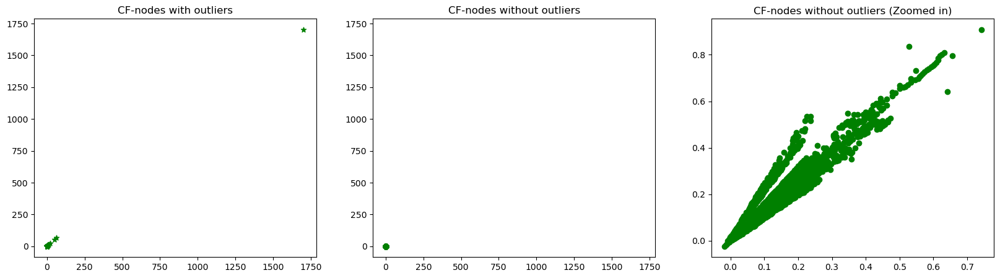

In [111]:
fig = plt.figure(figsize=(20, 5)) 
fig_dims = (1, 3)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("CF-nodes with outliers")
init_axes = \
    plt.scatter(centers_brc_df[0], centers_brc_df[1], 
                color="g", marker='*', label='Standard').axes

plt.subplot2grid(fig_dims, (0, 1))
plt.title("CF-nodes without outliers")
plt.scatter(centers_brc_df_wo_out[0], centers_brc_df_wo_out[1], color="g")
#Keep the same axis size for all the subplots
plt.xlim(min(init_axes.viewLim.intervalx), max(init_axes.viewLim.intervalx))
plt.ylim(min(init_axes.viewLim.intervaly), max(init_axes.viewLim.intervaly))

plt.subplot2grid(fig_dims, (0, 2))
plt.title("CF-nodes without outliers (Zoomed in)")
init_axes2 = plt.scatter(centers_brc_df_wo_out[0], centers_brc_df_wo_out[1], color="g").axes

plt.show()

In [112]:
#Retrieve original data points represented inside the non-outlier CF-nodes
df_wo_out_clustering = df_sales_brc.loc[~df_sales_brc["BIRCH"].isin(outlier_brc_df.index)].drop(["BIRCH"], axis=1)
#Outlier datapoints
clustering_outlier_df = df_sales_brc.loc[df_sales_brc["BIRCH"].isin(outlier_brc_df.index)].drop(["BIRCH"], axis=1)

In [113]:
print(f"Number of outliers in the dataset: {clustering_outlier_df.shape[0]}")
print(f"Percentage of outliers among the data points: {clustering_outlier_df.shape[0]/df_sales.shape[0]*100:3.3f}%")

Number of outliers in the dataset: 81
Percentage of outliers among the data points: 0.002%


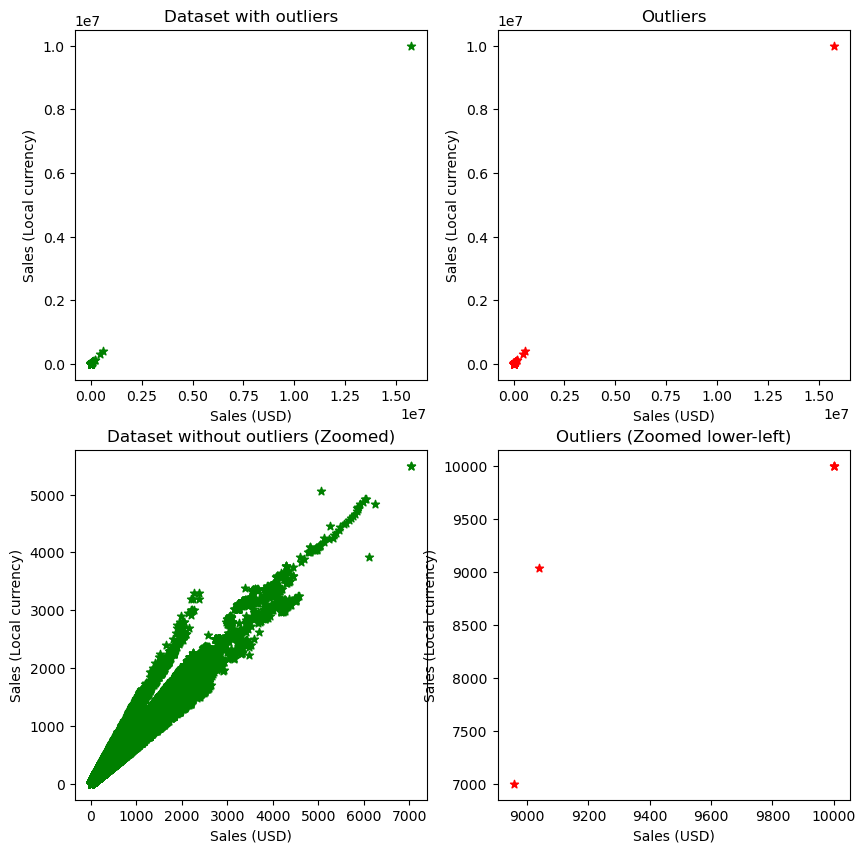

In [114]:
fig = plt.figure(figsize=(10, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Dataset with outliers")
init_axes = \
    plt.scatter(df_sales["sales_uds"], df_sales["sales_currency"], 
                color="g", marker='*', label='Standard').axes
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Outliers")
plt.scatter(clustering_outlier_df["sales_uds"], clustering_outlier_df["sales_currency"], color="r", marker='*', label='Standard')
#Keep the same axis size for all the subplots
plt.xlim(min(init_axes.viewLim.intervalx), max(init_axes.viewLim.intervalx))
plt.ylim(min(init_axes.viewLim.intervaly), max(init_axes.viewLim.intervaly))
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.subplot2grid(fig_dims, (1, 0))
plt.title("Dataset without outliers (Zoomed)")
plt.scatter(df_wo_out_clustering["sales_uds"], df_wo_out_clustering["sales_currency"], color="g", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

lower_left_outlier = clustering_outlier_df.loc[(clustering_outlier_df["sales_uds"] < 10**4) & \
                                               (clustering_outlier_df["sales_currency"] < 10**4)]
plt.subplot2grid(fig_dims, (1, 1))
plt.title("Outliers (Zoomed lower-left)")
plt.scatter(lower_left_outlier["sales_uds"], lower_left_outlier["sales_currency"], color="r", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")

plt.show()

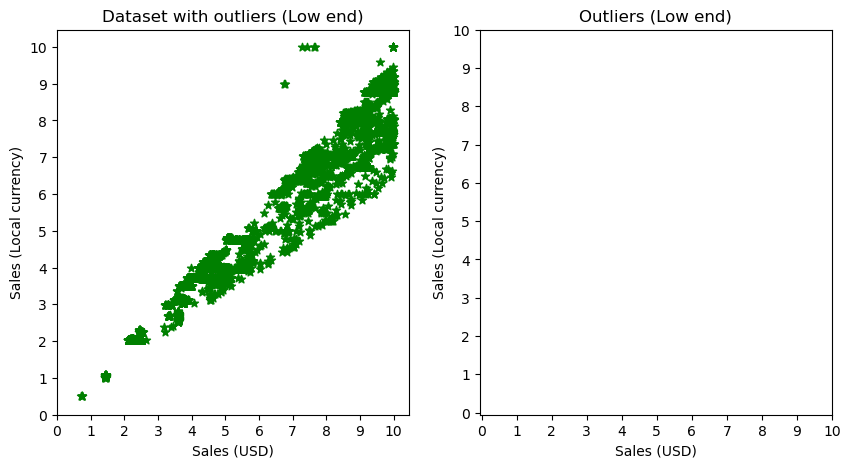

Number of outliers with value < 10: 0


In [115]:
fig = plt.figure(figsize=(10, 5)) 
fig_dims = (1, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Dataset with outliers (Low end)")
df_lowend_clustering = df_wo_out_clustering.loc[(df_wo_out_clustering["sales_uds"] < 10) & (df_wo_out_clustering["sales_currency"] < 10)]
plt.scatter(df_lowend_clustering["sales_uds"], df_lowend_clustering["sales_currency"], color="g", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")
plt.xticks(np.arange(11))
plt.yticks(np.arange(11))

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Outliers (Low end)")
lowend_outliers_clustering = clustering_outlier_df.loc[(clustering_outlier_df["sales_uds"] < 10) & \
                                                       (clustering_outlier_df["sales_currency"] < 10)]
plt.scatter(lowend_outliers_clustering["sales_uds"], lowend_outliers_clustering["sales_currency"], color="r", marker='*', label='Standard')
plt.xlabel("Sales (USD)")
plt.ylabel("Sales (Local currency)")
plt.xticks(np.arange(11))
plt.yticks(np.arange(11))

plt.show()

print(f"Number of outliers with value < 10: {lowend_outliers_clustering.shape[0]}")

These results are quite good, the higher end of the values values is within reasonable range and the number of data points removed is insignificant, however executing BIRCH with such a low threshold is quite time consuming.  
Another sore point is that it ignores completely the outliers at the lower end of the dataset.

### Conclusion

In [116]:
df_sales_wo_out_iqrcox = df_sales_merged.loc[df_wo_out_iqrcox.index]
df_sales_wo_out_lof = df_sales_merged.loc[df_wo_out_lof.index]
df_sales_wo_out_clustering = df_sales_merged.loc[df_wo_out_clustering.index]

We are interested in taking a look at the behaviour of the vendor features when switching between the techniques explored in this section.  
The final decision will be taken after the following check on the consistency of prices and the analysis of the vendor features.

## Revisiting interesting plots from feature analysis  
In this section we are interested in revisiting all the noteworthy plots that displayed strange behaviours relative to sales.

### Correlation between price and ram characteristics

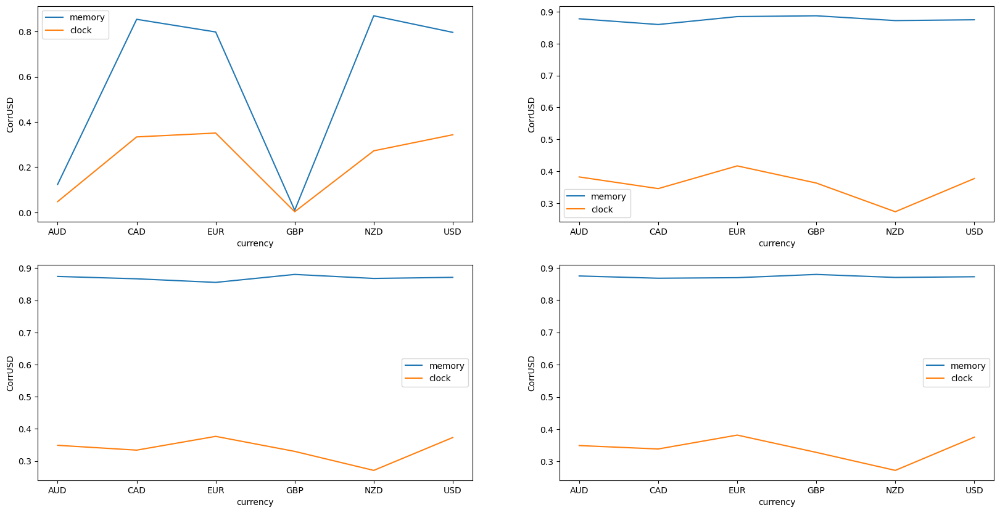

In [117]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df_sales_merged.groupby(["currency"])[["memory", "clock"]].corrwith(df_sales_merged["sales_uds"])\
        .plot(ylabel="CorrUSD", ax=axes[0,0])
df_sales_wo_out_iqrcox.groupby(["currency"])[["memory", "clock"]].corrwith(df_sales_wo_out_iqrcox["sales_uds"])\
        .plot(ylabel="CorrUSD", ax=axes[0,1])
df_sales_wo_out_lof.groupby(["currency"])[["memory", "clock"]].corrwith(df_sales_wo_out_lof["sales_uds"])\
        .plot(ylabel="CorrUSD", ax=axes[1,0])
df_sales_wo_out_clustering.groupby(["currency"])[["memory", "clock"]].corrwith(df_sales_wo_out_clustering["sales_uds"])\
        .plot(ylabel="CorrUSD", ax=axes[1,1])

plt.show()

The clustering approach has a slightly straighter line compared to the others, apart from that the results are excellent accross the board.

### Std and mean plots
Note that the scales change drastically after the outlier removal.

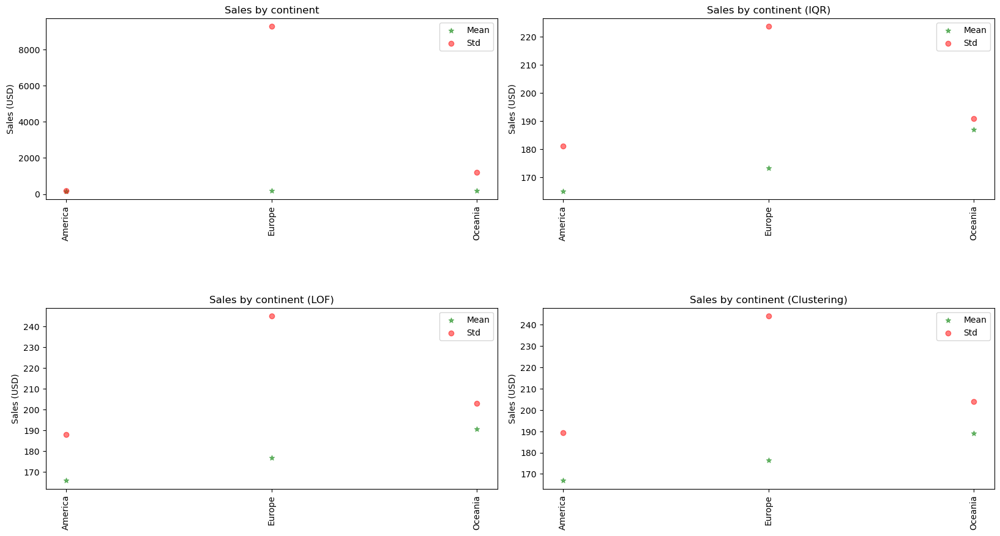

In [118]:
fig = plt.figure(figsize=(20, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.6, wspace=0.1)

feature_str = "continent"

plt.subplot2grid(fig_dims, (0, 0))
plt_generate_sales_scatter(df_sales_merged, feature_str, "Sales by continent")

plt.subplot2grid(fig_dims, (0, 1))
plt_generate_sales_scatter(df_sales_wo_out_iqrcox, feature_str, "Sales by continent (IQR)")

plt.subplot2grid(fig_dims, (1, 0))
plt_generate_sales_scatter(df_sales_wo_out_lof, feature_str, "Sales by continent (LOF)")

plt.subplot2grid(fig_dims, (1, 1))
plt_generate_sales_scatter(df_sales_wo_out_clustering, feature_str, "Sales by continent (Clustering)")

plt.show()

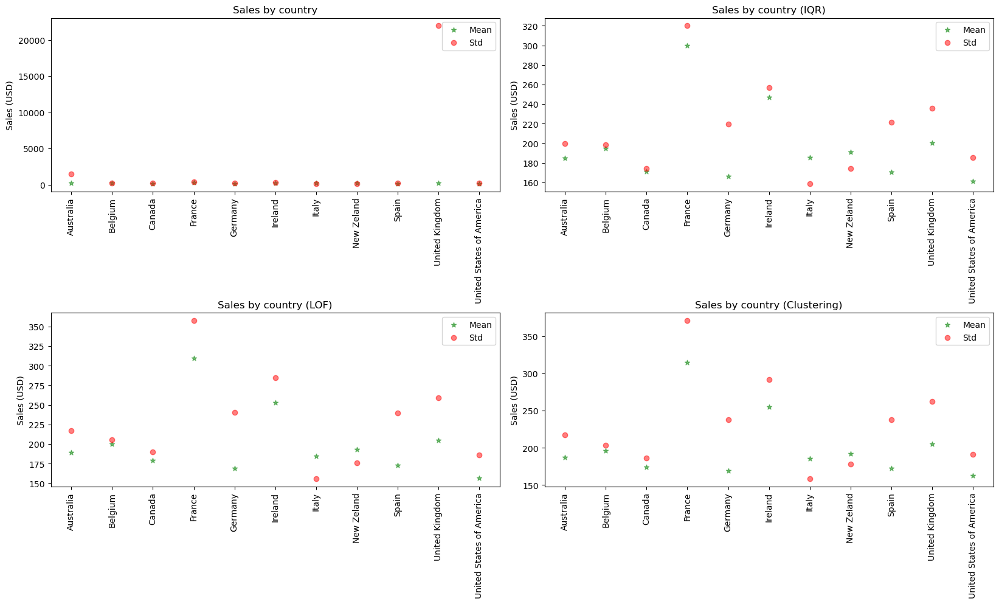

In [119]:
fig = plt.figure(figsize=(20, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.7, wspace=0.1)

feature_str = "country"

plt.subplot2grid(fig_dims, (0, 0))
plt_generate_sales_scatter(df_sales_merged, feature_str, "Sales by country")

plt.subplot2grid(fig_dims, (0, 1))
plt_generate_sales_scatter(df_sales_wo_out_iqrcox, feature_str, "Sales by country (IQR)")

plt.subplot2grid(fig_dims, (1, 0))
plt_generate_sales_scatter(df_sales_wo_out_lof, feature_str, "Sales by country (LOF)")

plt.subplot2grid(fig_dims, (1, 1))
plt_generate_sales_scatter(df_sales_wo_out_clustering, feature_str, "Sales by country (Clustering)")

plt.show()

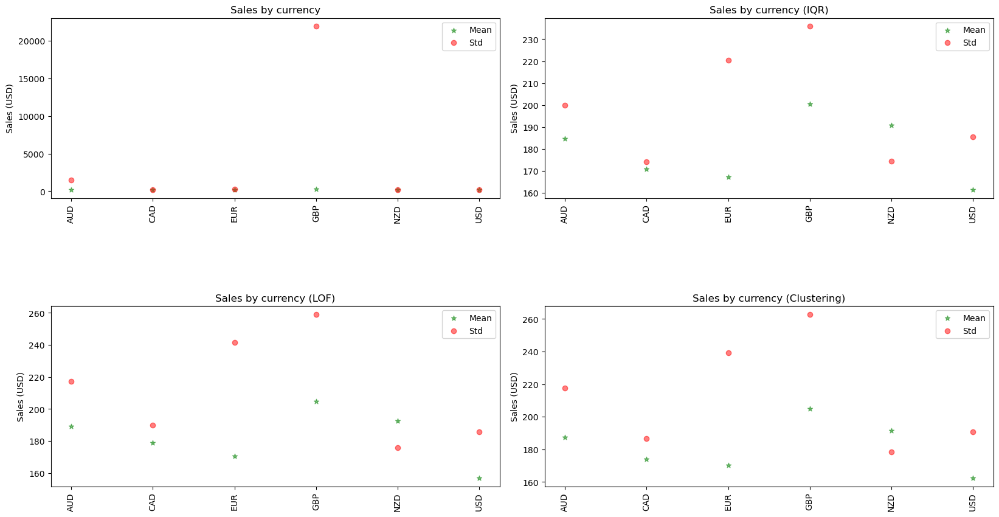

In [120]:
fig = plt.figure(figsize=(20, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.6, wspace=0.1)

feature_str = "currency"

plt.subplot2grid(fig_dims, (0, 0))
plt_generate_sales_scatter(df_sales_merged, feature_str, "Sales by currency")

plt.subplot2grid(fig_dims, (0, 1))
plt_generate_sales_scatter(df_sales_wo_out_iqrcox, feature_str, "Sales by currency (IQR)")

plt.subplot2grid(fig_dims, (1, 0))
plt_generate_sales_scatter(df_sales_wo_out_lof, feature_str, "Sales by currency (LOF)")

plt.subplot2grid(fig_dims, (1, 1))
plt_generate_sales_scatter(df_sales_wo_out_clustering, feature_str, "Sales by currency (Clustering)")

plt.show()

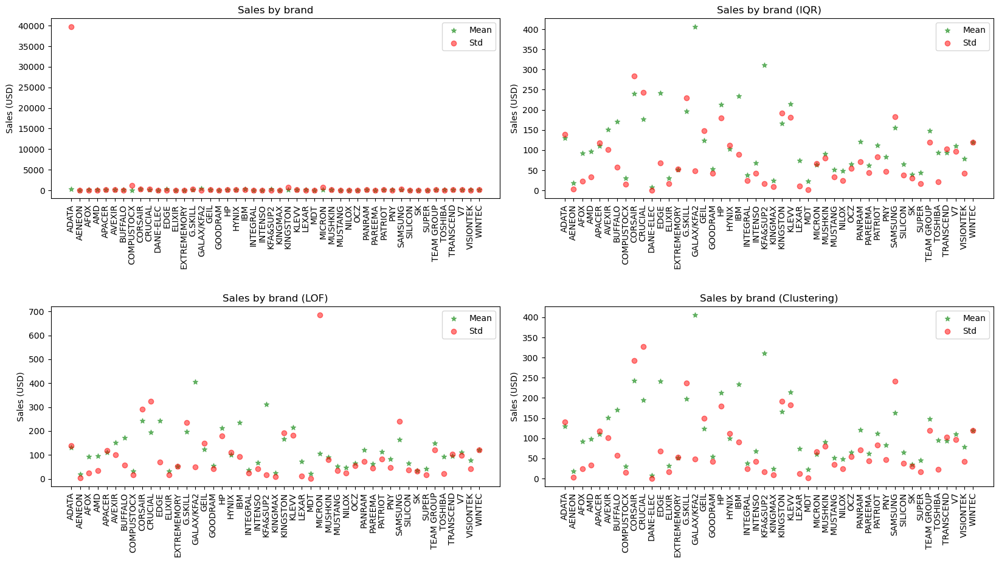

In [121]:
fig = plt.figure(figsize=(20, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.6, wspace=0.1)

feature_str = "brand"

plt.subplot2grid(fig_dims, (0, 0))
plt_generate_sales_scatter(df_sales_merged, feature_str, "Sales by brand")

plt.subplot2grid(fig_dims, (0, 1))
plt_generate_sales_scatter(df_sales_wo_out_iqrcox, feature_str, "Sales by brand (IQR)")

plt.subplot2grid(fig_dims, (1, 0))
plt_generate_sales_scatter(df_sales_wo_out_lof, feature_str, "Sales by brand (LOF)")

plt.subplot2grid(fig_dims, (1, 1))
plt_generate_sales_scatter(df_sales_wo_out_clustering, feature_str, "Sales by brand (Clustering)")

plt.show()

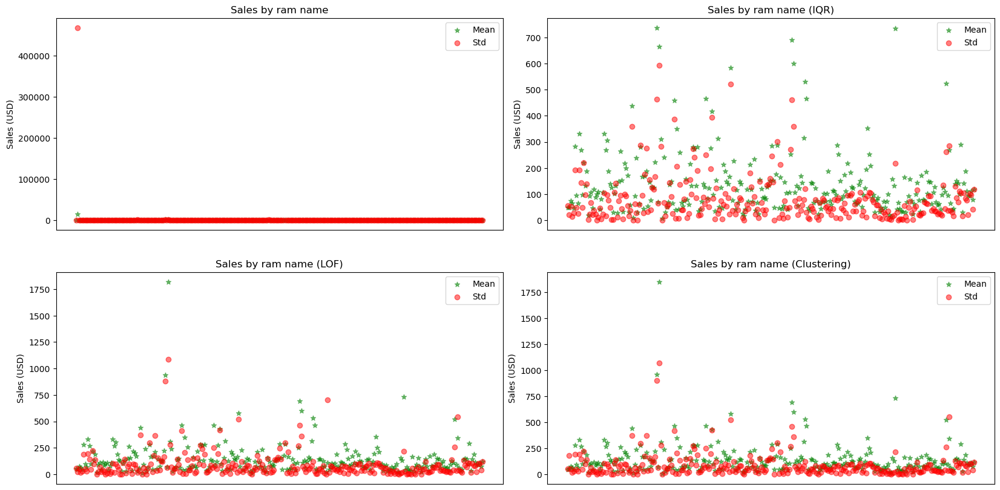

In [122]:
fig = plt.figure(figsize=(20, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.1)

feature_str = "name"

plt.subplot2grid(fig_dims, (0, 0))
plt_generate_sales_scatter(df_sales_merged, feature_str, "Sales by ram name")
plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False) #Remove xticks to avoid clutter

plt.subplot2grid(fig_dims, (0, 1))
plt_generate_sales_scatter(df_sales_wo_out_iqrcox, feature_str, "Sales by ram name (IQR)")
plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False) #Remove xticks to avoid clutter

plt.subplot2grid(fig_dims, (1, 0))
plt_generate_sales_scatter(df_sales_wo_out_lof, feature_str, "Sales by ram name (LOF)")
plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False) #Remove xticks to avoid clutter

plt.subplot2grid(fig_dims, (1, 1))
plt_generate_sales_scatter(df_sales_wo_out_clustering, feature_str, "Sales by ram name (Clustering)")
plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False) #Remove xticks to avoid clutter

plt.show()

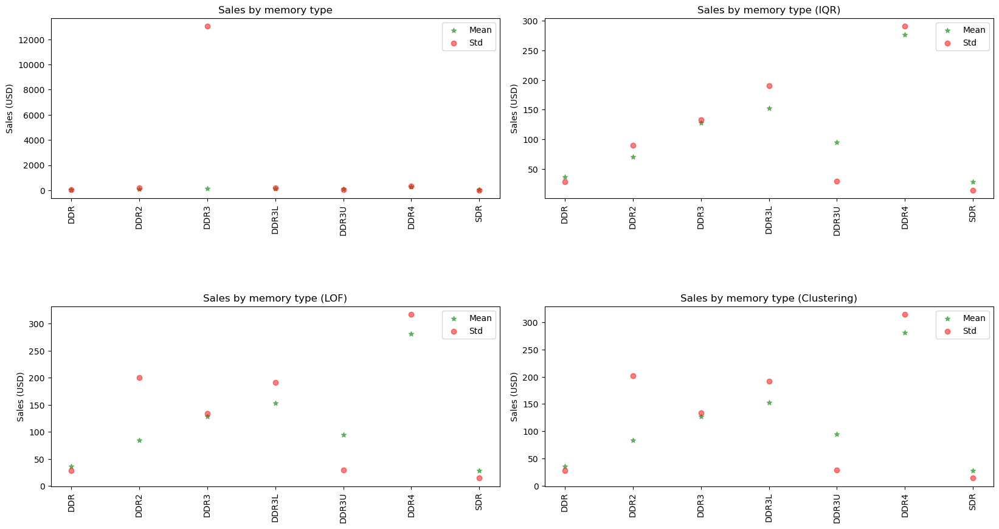

In [123]:
fig = plt.figure(figsize=(20, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.6, wspace=0.1)

feature_str = "memory_type"

plt.subplot2grid(fig_dims, (0, 0))
plt_generate_sales_scatter(df_sales_merged, feature_str, "Sales by memory type")

plt.subplot2grid(fig_dims, (0, 1))
plt_generate_sales_scatter(df_sales_wo_out_iqrcox, feature_str, "Sales by memory type (IQR)")

plt.subplot2grid(fig_dims, (1, 0))
plt_generate_sales_scatter(df_sales_wo_out_lof, feature_str, "Sales by memory type (LOF)")

plt.subplot2grid(fig_dims, (1, 1))
plt_generate_sales_scatter(df_sales_wo_out_clustering, feature_str, "Sales by memory type (Clustering)")

plt.show()

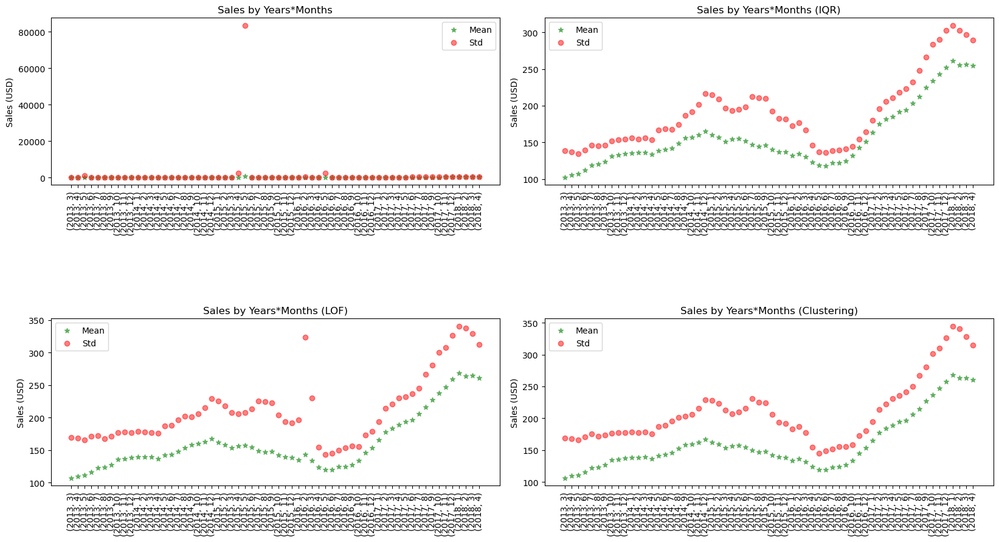

In [124]:
fig = plt.figure(figsize=(20, 10)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.8, wspace=0.1)

feature_str = ["year", "month"]

plt.subplot2grid(fig_dims, (0, 0))
plt_generate_sales_scatter(df_sales_merged, feature_str, "Sales by Years*Months")

plt.subplot2grid(fig_dims, (0, 1))
plt_generate_sales_scatter(df_sales_wo_out_iqrcox, feature_str, "Sales by Years*Months (IQR)")

plt.subplot2grid(fig_dims, (1, 0))
plt_generate_sales_scatter(df_sales_wo_out_lof, feature_str, "Sales by Years*Months (LOF)")

plt.subplot2grid(fig_dims, (1, 1))
plt_generate_sales_scatter(df_sales_wo_out_clustering, feature_str, "Sales by Years*Months (Clustering)")

plt.show()

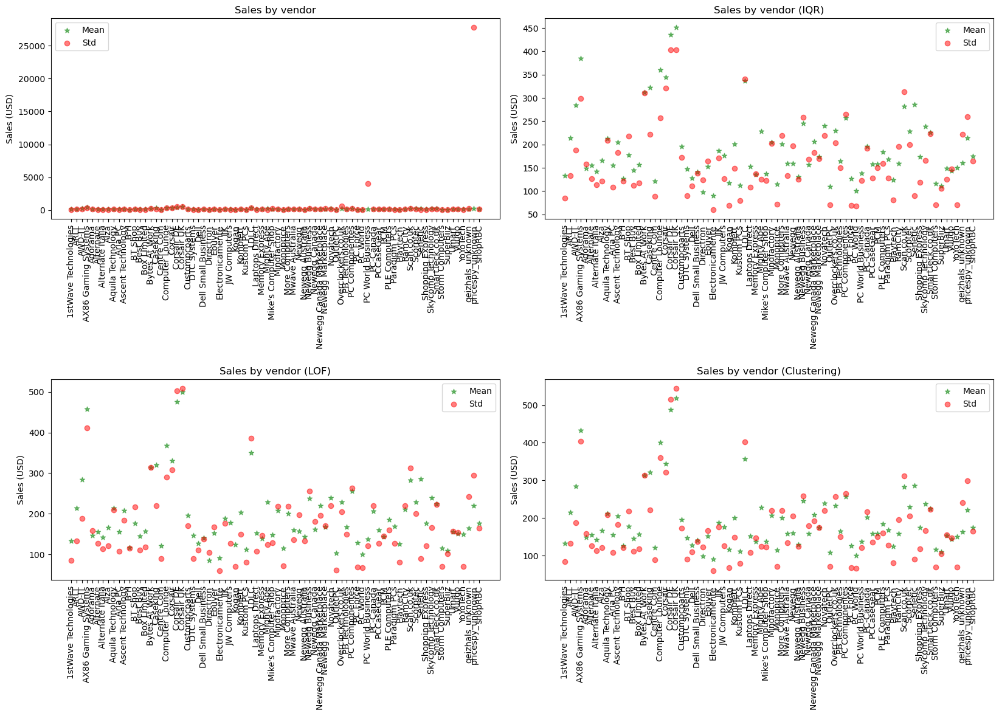

In [125]:
fig = plt.figure(figsize=(20, 12)) 
fig_dims = (2, 2)
fig.subplots_adjust(hspace=0.8, wspace=0.1)

feature_str = "name_vendor"

plt.subplot2grid(fig_dims, (0, 0))
plt_generate_sales_scatter(df_sales_merged, feature_str, "Sales by vendor")

plt.subplot2grid(fig_dims, (0, 1))
plt_generate_sales_scatter(df_sales_wo_out_iqrcox, feature_str, "Sales by vendor (IQR)")

plt.subplot2grid(fig_dims, (1, 0))
plt_generate_sales_scatter(df_sales_wo_out_lof, feature_str, "Sales by vendor (LOF)")

plt.subplot2grid(fig_dims, (1, 1))
plt_generate_sales_scatter(df_sales_wo_out_clustering, feature_str, "Sales by vendor (Clustering)")

plt.show()

All the problems in this plots are solved by all methods used, from a global standpoint there are no major differences.

## Re: Consistency of prices throughout vendors  
Now that we have some datasets without outliers we can try to extract some interesting data concerning the stability of prices for the same product.  
Here we can have a closer look at the micro level (month by month, product by product) behaviour compared with the macro (global) behaviour of the previous section.

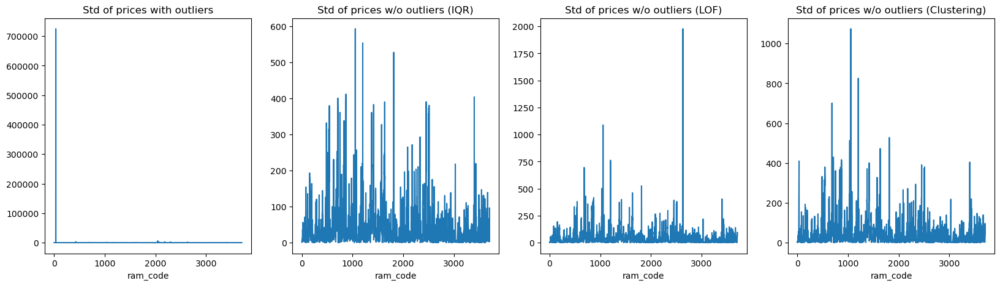

In [126]:
fig = plt.figure(figsize=(20, 5)) 
fig_dims = (1, 4)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Std of prices with outliers")
df_sales_merged.groupby("ram_code")["sales_uds"].std().plot()

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Std of prices w/o outliers (IQR)")
df_sales_wo_out_iqrcox.groupby("ram_code")["sales_uds"].std().plot()

plt.subplot2grid(fig_dims, (0, 2))
plt.title("Std of prices w/o outliers (LOF)")
df_sales_wo_out_lof.groupby("ram_code")["sales_uds"].std().plot()

plt.subplot2grid(fig_dims, (0, 3))
plt.title("Std of prices w/o outliers (Clustering)")
df_sales_wo_out_clustering.groupby("ram_code")["sales_uds"].std().plot()

plt.show()

We already noted that the IQR approach results in the removal of many "extreme" values and this is noticeable in the plot, the distribution of the std is balanced.  
LOF and clustering are very similar, the only difference is the one extreme peak (ram_code 2631) in LOF that distorts the plot.  

Let's check the behaviour of the variances through time, month by month, we will focus on the worst offenders: those with an std >= 1000 and we will take into account the changes to the prices in order to determine if the spikes are a fluke or systematic.

In [127]:
#Auxiliary function
def transform_dataset_ind_col_monthly(source_df):
    
    #Function takes a dataset as input:
        #adds each "year"*"month" combination as a column
        #makes "ram_code" the index
        #returns a new dataset with the cells containing the std of the ram_code in a particular month
    
    dest_df = source_df.copy()
    
    #In order to fit more data in a plot we will abbreviate the year leaving only the last two digits
    
    dest_df["year"] = dest_df["year"].transform(lambda x: x%2000)

    groupby_std_usd = dest_df.groupby(["ram_code", "year", "month"])["sales_uds"].std()

    reset_df = groupby_std_usd.reset_index(level=["year", "month"])
    pivoted_std_df = reset_df.pivot(columns=['year', "month"])
    pivoted_std_df.columns = pivoted_std_df.columns.droplevel(0).to_flat_index() #flat index needed for performance warning
    pivoted_std_df = pivoted_std_df.reset_index(level=["ram_code"])
    
    return pivoted_std_df

def transform_dataset_ind_col_yearly(source_df):
    
    #Function takes a dataset as input:
        #adds each "year" as a column
        #makes "ram_code" the index
        #returns a new dataset with the cells containing the std of the ram_code in a particular year
    
    dest_df = source_df.copy()
    
    groupby_std_usd = dest_df.groupby(["ram_code", "year"])["sales_uds"].std()

    reset_df = groupby_std_usd.reset_index(level=["year"])
    pivoted_std_df = reset_df.pivot(columns=['year'])
    pivoted_std_df.columns = pivoted_std_df.columns.droplevel(0)
    pivoted_std_df = pivoted_std_df.reset_index(level=["ram_code"])
    
    return pivoted_std_df

#### IQR

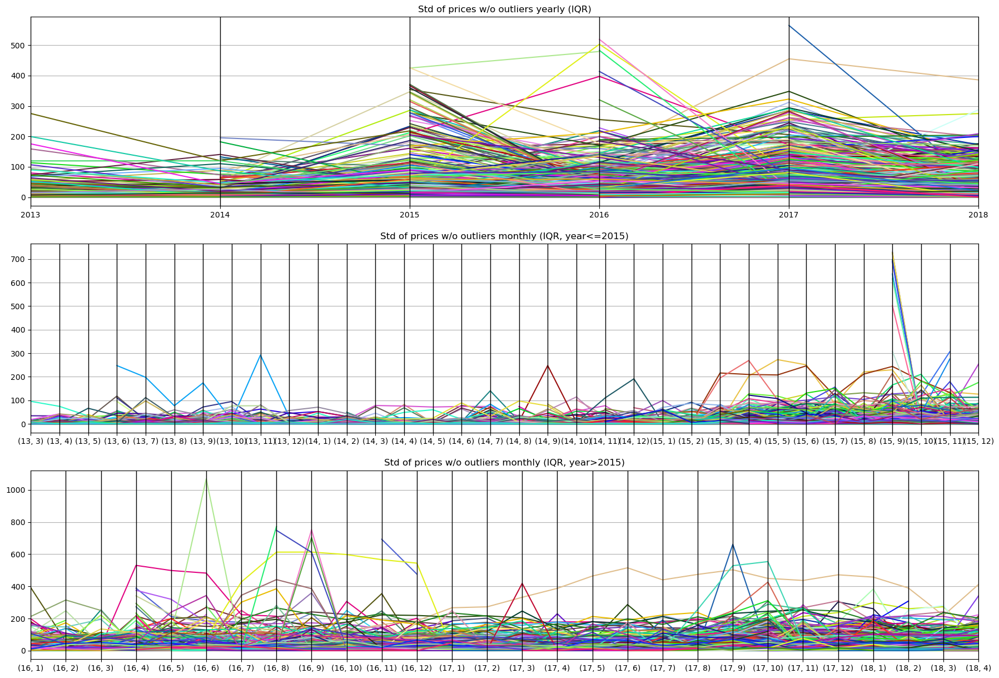

In [128]:
fig = plt.figure(figsize=(22, 15))
fig_dims = (3, 1)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Std of prices w/o outliers yearly (IQR)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_yearly(df_sales_wo_out_iqrcox), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.subplot2grid(fig_dims, (1, 0))
plt.title("Std of prices w/o outliers monthly (IQR, year<=2015)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_monthly(df_sales_wo_out_iqrcox.loc[df_sales_wo_out_iqrcox["year"]<=2015]), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.subplot2grid(fig_dims, (2, 0))
plt.title("Std of prices w/o outliers monthly (IQR, year>2015)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_monthly(df_sales_wo_out_iqrcox.loc[df_sales_wo_out_iqrcox["year"]>2015]), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.show()

**Peaks (15, 9)**

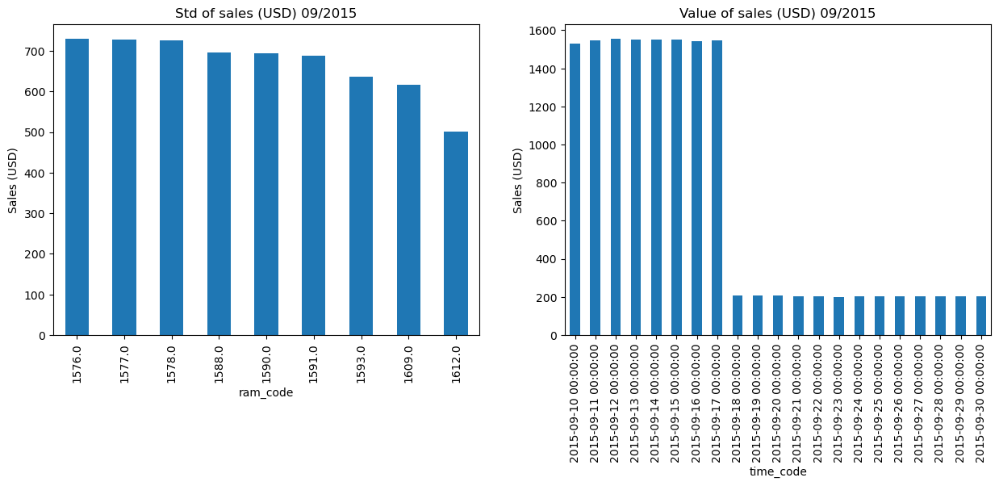

In [129]:
#df containing the entries of the ram_codes that caused the std spike
df_std_peak15_9_iqr = df_sales_wo_out_iqrcox.loc[(df_sales_wo_out_iqrcox["year"] == 2015) & (df_sales_wo_out_iqrcox["month"] == 9)]\
            .groupby("ram_code")["sales_uds"].std().sort_values(ascending=False).head(9)

df_usd_15_9 = df_sales_wo_out_iqrcox.loc[(df_sales_wo_out_iqrcox["year"] == 2015) & (df_sales_wo_out_iqrcox["month"].isin([8,9])) & \
                           (df_sales_wo_out_iqrcox["ram_code"].isin(df_std_peak15_9_iqr.index))].sort_values("time_code")


fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df_std_peak15_9_iqr.plot(kind="bar", ax=axes[0], title="Std of sales (USD) 09/2015", ylabel="Sales (USD)")
df_usd_15_9.groupby("time_code")["sales_uds"].mean().plot(kind="bar", ax=axes[1], title="Value of sales (USD) 09/2015", ylabel="Sales (USD)")
plt.show()

Note that none of these products was sold the months prior, it seems that they were introduced in the market at a high cost and after a week the price dropped significantly.

**Peak (16, 6)**

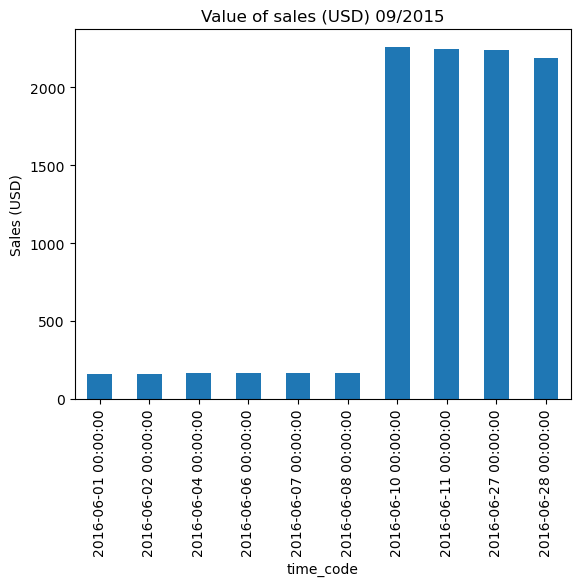

In [130]:
df_usd_16_6 = df_sales_wo_out_iqrcox.loc[(df_sales_wo_out_iqrcox["year"] == 2016) & (df_sales_wo_out_iqrcox["month"] == 6) & \
                           (df_sales_wo_out_iqrcox["ram_code"] == 1055)].sort_values("time_code")

plt.title("Value of sales (USD) 09/2015")
df_usd_16_6.groupby("time_code")["sales_uds"].min().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.show()

In [131]:
std_tmp_var = df_sales_wo_out_iqrcox.loc[(df_sales_wo_out_iqrcox['year'] == 2016) & (df_sales_wo_out_iqrcox['month'] > 6) & \
(df_sales_wo_out_iqrcox['ram_code'] == 1055), 'sales_uds'].std()

print(f"Std of price throughout the year: {std_tmp_var}")

Std of price throughout the year: 10.265319224201319


Again no explanation, the price skyrocketed during the month 06/2016 and stayed stable for the rest of the year.

#### LOF

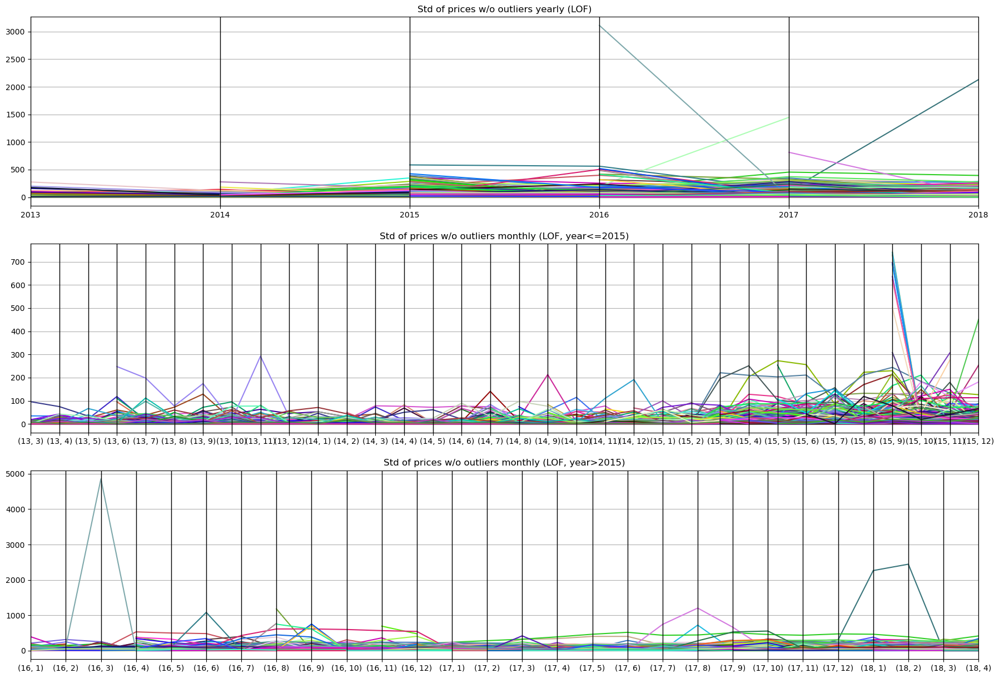

In [132]:
fig = plt.figure(figsize=(22, 15))
fig_dims = (3, 1)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Std of prices w/o outliers yearly (LOF)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_yearly(df_sales_wo_out_lof), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.subplot2grid(fig_dims, (1, 0))
plt.title("Std of prices w/o outliers monthly (LOF, year<=2015)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_monthly(df_sales_wo_out_lof.loc[df_sales_wo_out_lof["year"]<=2015]), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.subplot2grid(fig_dims, (2, 0))
plt.title("Std of prices w/o outliers monthly (LOF, year>2015)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_monthly(df_sales_wo_out_lof.loc[df_sales_wo_out_lof["year"]>2015]), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.show()

**Peaks (15, 9)**

In [133]:
df_tmp_peak15_9_lof = df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2015) & (df_sales_wo_out_lof["month"] == 9)].groupby("ram_code")["sales_uds"].std().sort_values(ascending=False).head(9)
df_tmp_peak15_9_lof.index.isin(df_std_peak15_9_iqr.index).all()

True

The cause of the high std are the same products as the ones discussed above.

**Peak (16, 3)**

In [134]:
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2016) & (df_sales_wo_out_lof["month"].isin([1,2])) & \
                        (df_sales_wo_out_lof["ram_code"] == 2631)].groupby("vendor_code")["sales_uds"].describe()

,count,mean,std,min,25%,50%,75%,max
vendor_code,,,,,,,,
32,30.0,10411.385645,125.330862,10180.120658,10297.081039,10459.441511,10487.380331,10630.741494


Vendor 32 was the only seller for this particular model of ram for 2 months, we assume that the high prices are due to a low supply and high demand for the product.

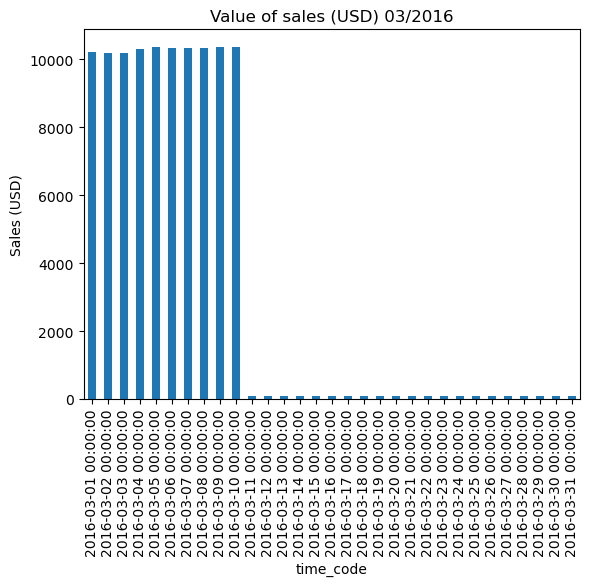

In [135]:
plt.title("Value of sales (USD) 03/2016")
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2016) & (df_sales_wo_out_lof["month"] == 3) & \
                        (df_sales_wo_out_lof["ram_code"] == 2631)].groupby("time_code")["sales_uds"].min().plot(kind="bar")
plt.ylabel("Sales (USD)")
plt.show()

From 11/03/2016 onwards the prices drop drastically.

In [136]:
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2016) & (df_sales_wo_out_lof["month"] == 9) & \
                        (df_sales_wo_out_lof["ram_code"] == 2631)].groupby("vendor_code")["sales_uds"].describe()

,count,mean,std,min,25%,50%,75%,max
vendor_code,,,,,,,,
32,30.0,42.747585,1.126728,41.427947,42.337428,42.381882,42.699222,46.357318
68,10.0,91.293081,16.786887,80.031100,83.685212,83.894661,84.270226,123.253664


From 09/2016 a new vendor starts selling this product, the prices are not altered by much.

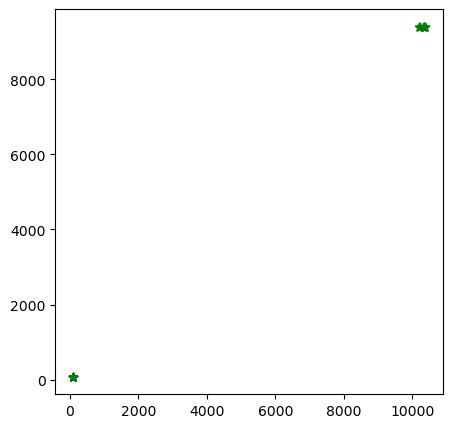

In [137]:
tmp_plt_df = df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2016) & (df_sales_wo_out_lof["month"] == 3) & \
                                     (df_sales_wo_out_lof["ram_code"] == 2631)]

plt.figure(figsize=(5,5))
plt.scatter(tmp_plt_df["sales_uds"], tmp_plt_df["sales_currency"], c="g", marker="*")
plt.show()

The cause of this anomaly is the separate cluster (upper right) that we noticed earlier during the analysis of the different outlier detection approaches.

**Peak (16, 6)**

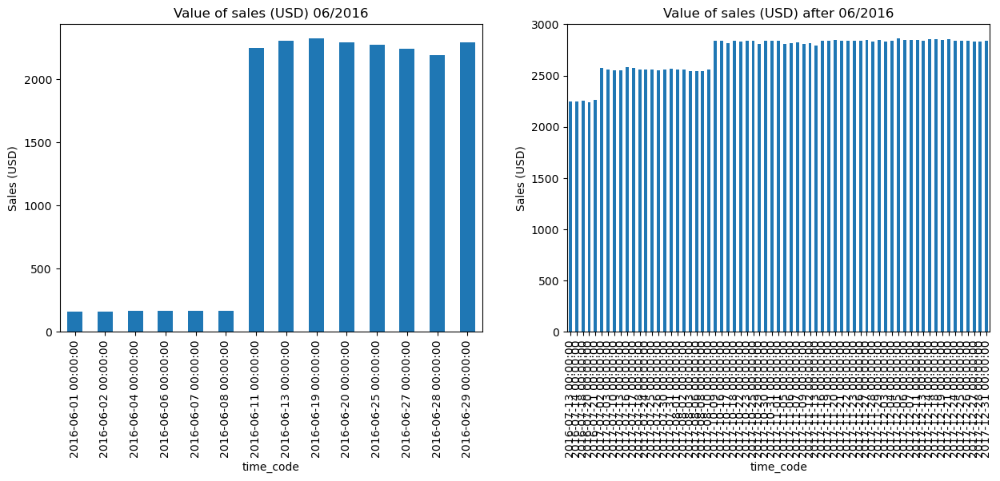

In [138]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2016) & (df_sales_wo_out_lof["month"] == 6) & \
                        (df_sales_wo_out_lof["ram_code"] == 1055)].groupby("time_code").min()["sales_uds"]\
                        .plot(kind="bar", title=("Value of sales (USD) 06/2016"), ax=axes[0], ylabel="Sales (USD)")

df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] >= 2016) & (df_sales_wo_out_lof["month"] > 6) & \
                        (df_sales_wo_out_lof["ram_code"] == 1055)].groupby("time_code").min()["sales_uds"]\
                        .plot(kind="bar", title=("Value of sales (USD) after 06/2016"), ax=axes[1], ylabel="Sales (USD)")

plt.show()

We have a different product in this spot compared to the LOF dataset, the behaviour is still a sudden increase in price.  
All subsequent prices stayed high.

**Peak (16, 8)**

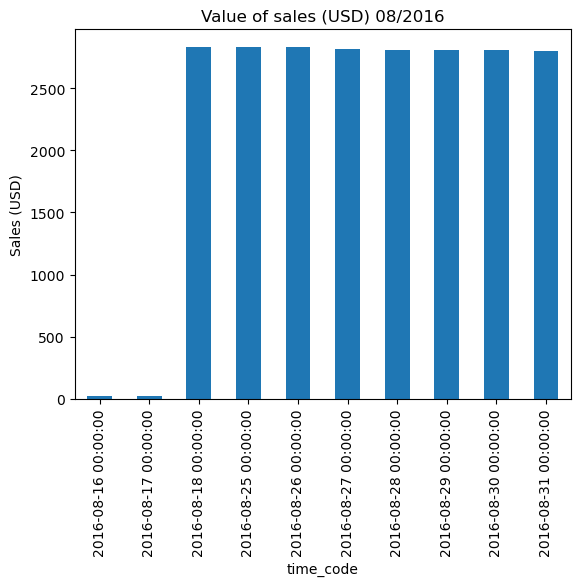

In [139]:
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2016) & (df_sales_wo_out_lof["month"] == 8) & \
                        (df_sales_wo_out_lof["ram_code"] == 1034)].groupby("time_code")["sales_uds"].min()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) 08/2016")
plt.show()

Usual pattern, the vendor spiked the prices for some reason.

**Peak (17, 8)**

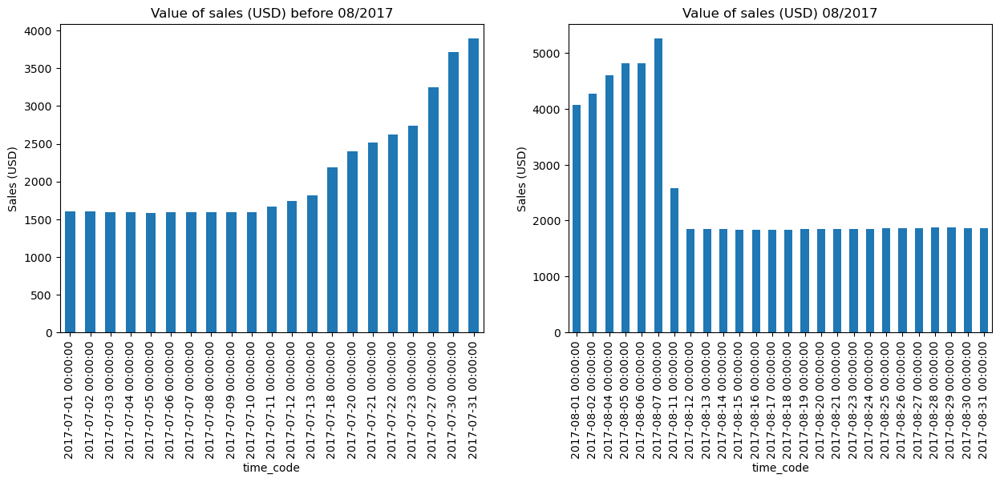

In [140]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2017) & (df_sales_wo_out_lof["month"] == 8) & \
                        (df_sales_wo_out_lof["ram_code"] == 1202)].groupby("time_code")["sales_uds"].min()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) 08/2017", ax=axes[1])

df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2017) & (df_sales_wo_out_lof["month"].isin([7])) & \
                        (df_sales_wo_out_lof["ram_code"] == 1202)].groupby("time_code")["sales_uds"].min()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) before 08/2017", ax=axes[0])

plt.show()

The prices decreased (for once).  
We can see from the values of the months prior that the spike is localised to the end of July/beginning of August.

**Peak (18, 1)-(18, 2)**

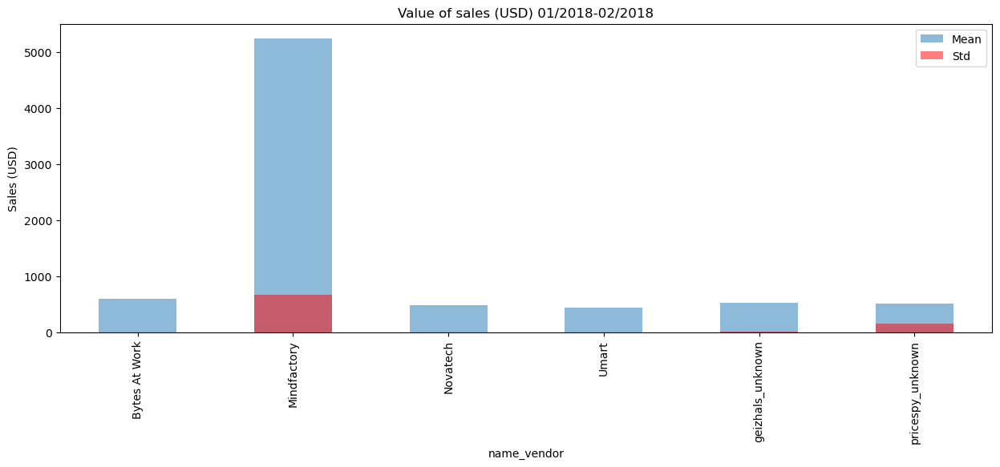

In [141]:
plt.figure(figsize=(15,5))
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2018) & (df_sales_wo_out_lof["month"].isin([1,2])) & \
                        (df_sales_wo_out_lof["ram_code"] == 683)].groupby("name_vendor")["sales_uds"].mean()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) 01/2018-02/2018", alpha=0.50, label="Mean")
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2018) & (df_sales_wo_out_lof["month"].isin([1,2])) & \
                        (df_sales_wo_out_lof["ram_code"] == 683)].groupby("name_vendor")["sales_uds"].std()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) 01/2018-02/2018", alpha=0.50, label="Std", 
                              color="r")
plt.legend()
plt.show()

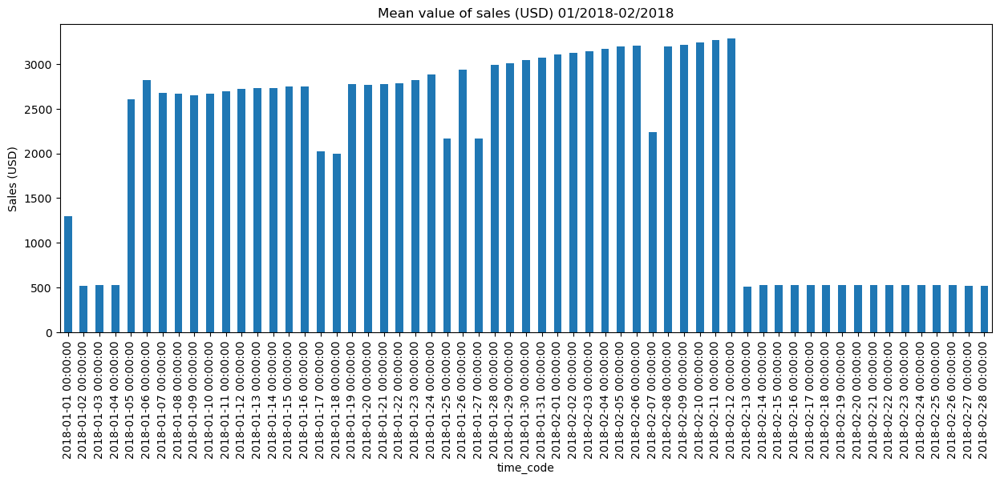

In [142]:
plt.figure(figsize=(15,5))
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2018) & (df_sales_wo_out_lof["month"].isin([1,2])) & \
                        (df_sales_wo_out_lof["ram_code"] == 683)].groupby("time_code")["sales_uds"].mean()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Mean value of sales (USD) 01/2018-02/2018")
plt.show()

It seems that Mindfactory (vendor 43) is practising some atypical price strategy on this ram model, again we suspect that the cause of this phenomenon is a lack of supply otherwise the cheaper competition should force Mindfactory to lower the price.

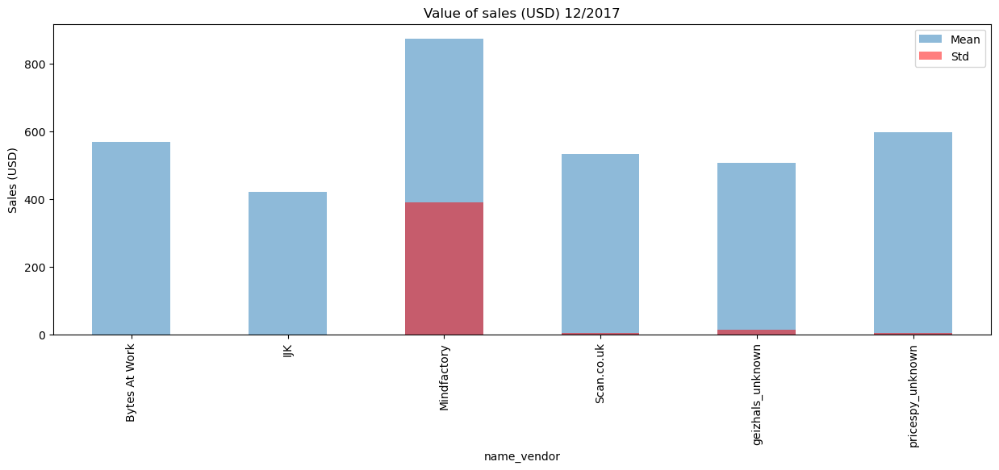

In [143]:
plt.figure(figsize=(15,5))
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2017) & (df_sales_wo_out_lof["month"] == 12) & \
                        (df_sales_wo_out_lof["ram_code"] == 683)].groupby("name_vendor")["sales_uds"].mean()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) 12/2017", alpha=0.50, label="Mean")
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] == 2017) & (df_sales_wo_out_lof["month"] == 12) & \
                        (df_sales_wo_out_lof["ram_code"] == 683)].groupby("name_vendor")["sales_uds"].std()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) 12/2017", alpha=0.50, label="Std", 
                              color="r")
plt.legend()
plt.show()

The prices at the end of 2017 were still reasonable, even though Mindfactory is still the most expensive one.

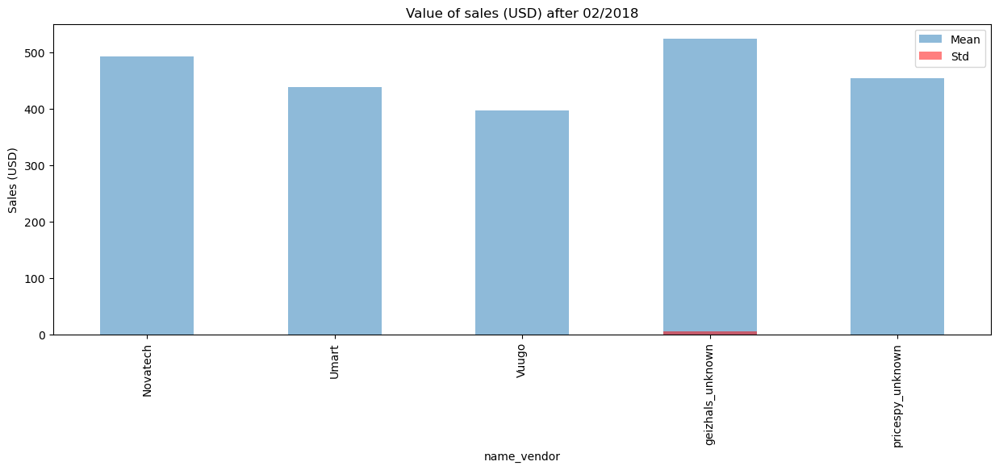

In [144]:
plt.figure(figsize=(15,5))
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] >= 2018) & (df_sales_wo_out_lof["month"] >= 3) & \
                        (df_sales_wo_out_lof["ram_code"] == 683)].groupby("name_vendor")["sales_uds"].mean()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) after 02/2018", alpha=0.50, label="Mean")
df_sales_wo_out_lof.loc[(df_sales_wo_out_lof["year"] >= 2018) & (df_sales_wo_out_lof["month"] >= 3) & \
                        (df_sales_wo_out_lof["ram_code"] == 683)].groupby("name_vendor")["sales_uds"].std()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) after 02/2018", alpha=0.50, label="Std", 
                              color="r")
plt.legend()
plt.show()

From march onwards Mindfactory stopped selling the product altogether.

#### Clustering

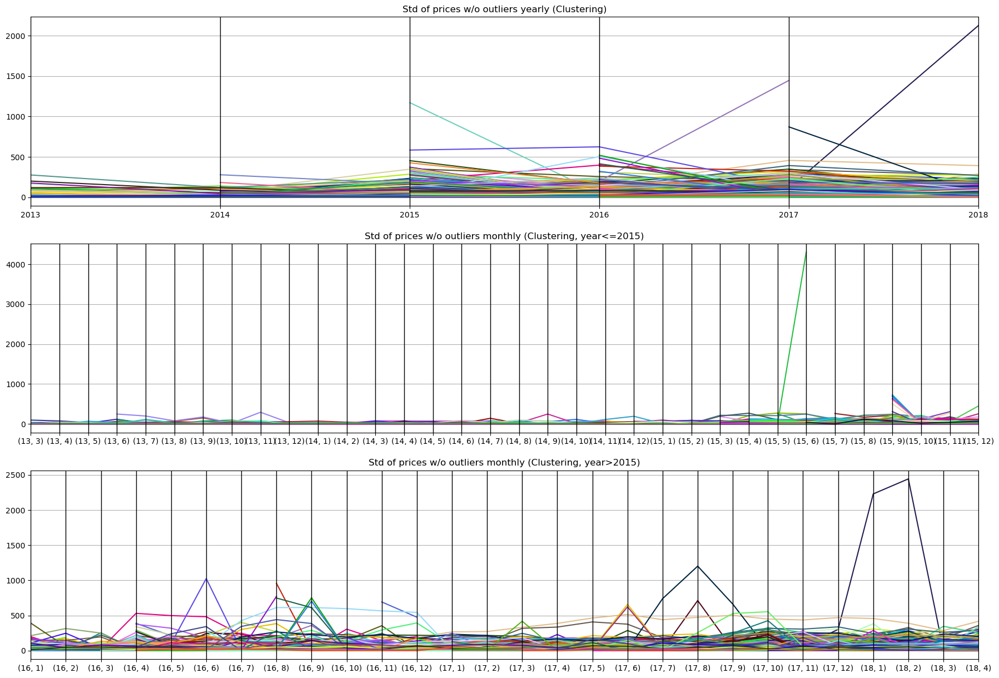

In [145]:
fig = plt.figure(figsize=(22, 15))
fig_dims = (3, 1)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Std of prices w/o outliers yearly (Clustering)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_yearly(df_sales_wo_out_clustering), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.subplot2grid(fig_dims, (1, 0))
plt.title("Std of prices w/o outliers monthly (Clustering, year<=2015)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_monthly(df_sales_wo_out_clustering.loc[df_sales_wo_out_clustering["year"]<=2015]), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.subplot2grid(fig_dims, (2, 0))
plt.title("Std of prices w/o outliers monthly (Clustering, year>2015)")
pd.plotting.parallel_coordinates(transform_dataset_ind_col_monthly(df_sales_wo_out_clustering.loc[df_sales_wo_out_clustering["year"]>2015]), "ram_code")
plt.gca().get_legend().remove() #Remove legend

plt.show()

**Peak (15, 6)**

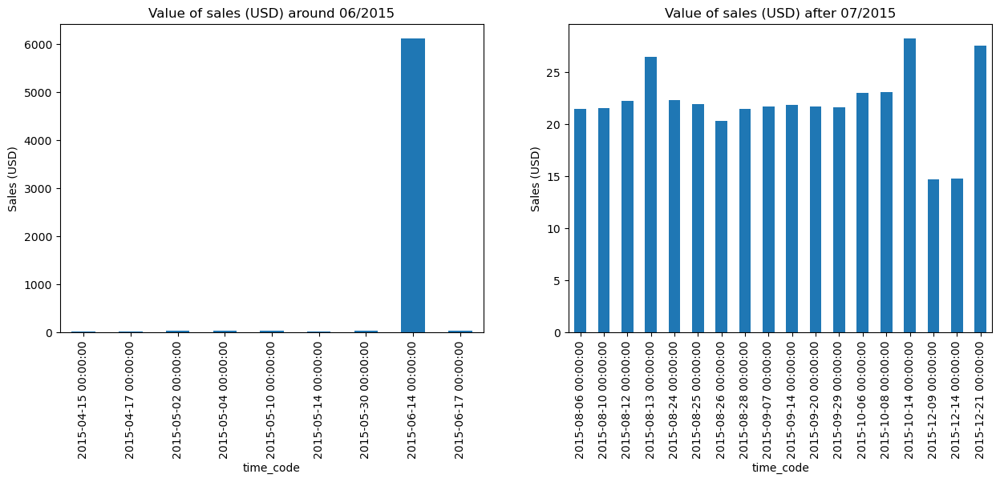

In [146]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

df_sales_wo_out_clustering.loc[(df_sales_wo_out_clustering["year"] == 2015) & (df_sales_wo_out_clustering["month"] <= 7) & \
                               (df_sales_wo_out_clustering["ram_code"] == 34)].groupby("time_code")["sales_uds"].min()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) around 06/2015", ax=axes[0])

df_sales_wo_out_clustering.loc[(df_sales_wo_out_clustering["year"] == 2015) & (df_sales_wo_out_clustering["month"] > 7) & \
                               (df_sales_wo_out_clustering["ram_code"] == 34)].groupby("time_code")["sales_uds"].min()\
                        .plot(kind="bar", ylabel="Sales (USD)", title="Value of sales (USD) after 07/2015", ax=axes[1])

plt.show()

Same old story, the price increased by a lot, this time however the spike is limited to a single day.  
Note that this outlier was already handled by both LOF and IQR.  
The abrupt end on the std plot is due to the product not being sold during 07/2015.

**Peak (16, 6)**

Same as above, the culprit is ram_code 1055.

**Peak (17, 8)**

Same as above, the culprit is ram_code 1202.

**Peak (18, 1)-(18, 2)**

Same as above, the culprit is ram_code 683.

### Conclusions

While many of the situations encountered in this analysis seem to be the fault of outliers we don't feel comfortable in removing the datapoints since these behaviours can be the result of the underlying market forces and not just a product of human errors.  
We therefore think it best to keep them and see how their inclusion affects our future analyses.  

Furthermore, as we pointed out during the previous section, the macro behaviour does not display any apparent red flags so there shouldn't be any problem in leaving some extreme values in the dataset.

## Vendor features

In [147]:
df_sales_merged.columns

Index(['Id', 'ram_code', 'brand', 'name', 'memory', 'memory_type', 'clock',
       'time_code', 'year', 'month', 'day', 'week', 'geo_code', 'continent',
       'country', 'region', 'currency', 'vendor_code', 'name_vendor',
       'sales_uds', 'sales_currency'],
      dtype='object')

In [148]:
(df_sales_merged["time_code"].max() - df_sales_merged["time_code"].min()).days

1847

### Definitions

In [149]:
def add_features_num(dest_df, source_df):

    #Modify the data frame locally (possibly not needed)
    dest_df = dest_df.copy()
    
    
    #Global
    
    #Total number of items sold by vendor
    IFeature = source_df.groupby(["vendor_code"]).size().rename("I")
    dest_df = dest_df.join(IFeature, on="vendor_code")
    
    #Total number of unique items sold by vendor
    IuFeature = source_df.groupby(["vendor_code"]).ram_code.nunique().rename("Iu")
    dest_df = dest_df.join(IuFeature, on="vendor_code")
    
    #Total revenue
    TotRevFeature = source_df.groupby(["vendor_code"])["sales_uds"].sum().rename("TotRev")
    dest_df = dest_df.join(TotRevFeature, on="vendor_code")
    
    #Max value of item sold (USD)
    MaxValFeature = source_df.groupby(["vendor_code"])["sales_uds"].max().rename("MaxValuePerOrder")
    dest_df = dest_df.join(MaxValFeature, on="vendor_code")
    
    #Avg value per item sold (USD)
    AvgValFeature = source_df.groupby(["vendor_code"])["sales_uds"].mean().rename("AvgValuePerOrder")
    dest_df = dest_df.join(AvgValFeature, on="vendor_code")
    
    #Avg amount of memory space per item sold (USD)
    AvgValFeature = source_df.groupby(["vendor_code"])["memory"].mean().rename("AvgMemoryPerOrder")
    dest_df = dest_df.join(AvgValFeature, on="vendor_code")
    
    
    #Time related
    
    #Max value items sold in any month (USD)
    vendorRamCount = source_df.groupby(["vendor_code", "year", "month"])["sales_uds"].sum()
    IMaxValMonthFeature = vendorRamCount.groupby(["vendor_code"]).max().rename("IMaxMonthSales")
    dest_df = dest_df.join(IMaxValMonthFeature, on="vendor_code")
    
    #Avg value items sold in a month (USD)
    vendorRamCount = source_df.groupby(["vendor_code", "year", "month"])["sales_uds"].sum()
    IAvgValMonthFeature = vendorRamCount.groupby(["vendor_code"]).mean().rename("IAvgMonthSales")
    dest_df = dest_df.join(IAvgValMonthFeature, on="vendor_code")
    
    #Max number items sold in any month
    vendorRamCount = source_df.groupby(["vendor_code", "year", "month"]).size()
    IMaxMonthFeature = vendorRamCount.groupby(["vendor_code"]).max().rename("IMaxMonthItems")
    dest_df = dest_df.join(IMaxMonthFeature, on="vendor_code")
    
    #Avg number items sold in a month
    vendorRamCount = source_df.groupby(["vendor_code", "year", "month"]).size()
    IAvgMonthFeature = vendorRamCount.groupby(["vendor_code"]).mean().rename("IAvgMonthItems")
    dest_df = dest_df.join(IAvgMonthFeature, on="vendor_code")
    
    #Number of months in business
    vendorMonthCount = source_df.groupby(["vendor_code", "year"])["month"].nunique()
    TotMonthFeature = vendorMonthCount.groupby(["vendor_code"]).sum().rename("TotMonthBusiness")
    dest_df = dest_df.join(TotMonthFeature, on="vendor_code")
    
    #Average product availability across items
    #It's an under-approximation since we know only when the product is sold for the first and for the last time
    #Ie if a vendor sells a product on 01/01/2015 and sells it for the last time on 01/01/2016 the product has an availability of 365 days
    vendorItemAvail = source_df.groupby(["vendor_code", "ram_code"]).apply(lambda x: (x["time_code"].max() - x["time_code"].min()).days)
    AvgMonthFeature = vendorItemAvail.groupby(["vendor_code"]).mean().rename("AvgItemAvail")
    dest_df = dest_df.join(AvgMonthFeature, on="vendor_code")
    
    
    #Entropy-related
    
    #The Shannon entropy on the selling behaviour of the vendor: different "ram_codes" sold
    probSeriesGrouped = source_df.groupby(["vendor_code", "ram_code"]).size()/\
        source_df.groupby("vendor_code")["ram_code"].size()
    logSeriesGrouped = np.log2(probSeriesGrouped)
    ProdProbLogSeriesGrouped = -1 * probSeriesGrouped * logSeriesGrouped
    EFeature = ProdProbLogSeriesGrouped.groupby(["vendor_code"]).sum()
    EFeature.name = "Eram"
    dest_df = dest_df.join(EFeature, on="vendor_code")
    
    #The Shannon entropy on the selling behaviour of the vendor: countries of operation
    #"geo_code" is tied to a single region, therefore we use "country" directly
    probSeriesGrouped = source_df.groupby(["vendor_code", "country"]).size()/\
        source_df.groupby("vendor_code")["country"].size()
    logSeriesGrouped = np.log2(probSeriesGrouped)
    ProdProbLogSeriesGrouped = -1 * probSeriesGrouped * logSeriesGrouped
    EFeature = ProdProbLogSeriesGrouped.groupby(["vendor_code"]).sum()
    EFeature.name = "Egeo"
    dest_df = dest_df.join(EFeature, on="vendor_code")
    
    #The Shannon entropy on the selling behaviour of the vendor: currencies used
    probSeriesGrouped = source_df.groupby(["vendor_code", "currency"]).size()/\
        source_df.groupby("vendor_code")["currency"].size()
    logSeriesGrouped = np.log2(probSeriesGrouped)
    ProdProbLogSeriesGrouped = -1 * probSeriesGrouped * logSeriesGrouped
    EFeature = ProdProbLogSeriesGrouped.groupby(["vendor_code"]).sum()
    EFeature.name = "Ecur"
    dest_df = dest_df.join(EFeature, on="vendor_code")
    

    return dest_df


def add_features_cat(dest_df, source_df):
    
    #Modify the data frame locally (possibly not needed)
    dest_df = dest_df.copy()
    
    
    #Top grossing brand
    vendorBrandRevenue = source_df.groupby(["vendor_code", "brand"])["sales_uds"].sum()
    #Somehow the vendor_code index is duplicated [, 0] removes one
    brandFeature = vendorBrandRevenue.groupby("vendor_code").nlargest(1).reset_index(["brand", 0])["brand"].rename("TopBrand")
    dest_df = dest_df.join(brandFeature, on="vendor_code")
    
    #Top grossing country
    vendorCountryRevenue = source_df.groupby(["vendor_code", "country"])["sales_uds"].sum()
    #Somehow the vendor_code index is duplicated [, 0] removes one
    countryFeature = vendorCountryRevenue.groupby("vendor_code").nlargest(1).reset_index(["country", 0])["country"].rename("TopCountry")
    dest_df = dest_df.join(countryFeature, on="vendor_code")
    
    #Most used currency
    vendorCountryRevenue = source_df.groupby(["vendor_code", "currency"])["sales_uds"].sum()
    #Somehow the vendor_code index is duplicated [, 0] removes one
    currencyFeature = vendorCountryRevenue.groupby("vendor_code").nlargest(1).reset_index(["currency", 0])["currency"].rename("TopCurrency")
    dest_df = dest_df.join(currencyFeature, on="vendor_code")
    
    #Month of the year with highest revenue across the years
    vendorCountryRevenue = source_df.groupby(["vendor_code", "month"])["sales_uds"].sum()
    #Somehow the vendor_code index is duplicated [, 0] removes one
    monthFeature = vendorCountryRevenue.groupby("vendor_code").nlargest(1).reset_index(["month", 0])["month"].rename("TopSalesMonth")
    dest_df = dest_df.join(monthFeature, on="vendor_code")
    
    return dest_df

Let's apply the features to the datasets with and without outliers.

In [150]:
#Add the features to an empty dataframe
unq_vendor_id = df_vendor[["vendor_code", "name"]].sort_values("vendor_code")
vend_df = pd.DataFrame(data=unq_vendor_id, columns=["vendor_code", "name"]).set_index(["vendor_code", "name"])

#Numerical features
vend_df_w_out_num = add_features_num(vend_df, df_sales_merged) #Dataframe containing customer features with outliers
vend_df_wo_out_iqrcox_num = add_features_num(vend_df, df_sales_wo_out_iqrcox) #Dataframe containing customer features without outliers (iqrcox)
vend_df_wo_out_lof_num = add_features_num(vend_df, df_sales_wo_out_lof) #Dataframe containing customer features without outliers (iqrcox)
vend_df_wo_out_clustering_num = add_features_num(vend_df, df_sales_wo_out_clustering) #Dataframe containing customer features without outliers (clustering)

#Categorical features
vend_df_w_out_cat = add_features_cat(vend_df, df_sales_merged) #Dataframe containing customer features with outliers
vend_df_wo_out_iqrcox_cat = add_features_cat(vend_df, df_sales_wo_out_iqrcox) #Dataframe containing customer features without outliers (iqrcox)
vend_df_wo_out_lof_cat = add_features_cat(vend_df, df_sales_wo_out_lof) #Dataframe containing customer features without outliers (iqrcox)
vend_df_wo_out_clustering_cat = add_features_cat(vend_df, df_sales_wo_out_clustering) #Dataframe containing customer features without outliers (clustering)

## Numerical features analysis  
In this section we compare results between feature datasets obtained from the sales dataset including and excluding the outliers (with each technique used).

In [151]:
def plot_vendor_comparison_num(df_w_out, df_wo_out_list, feature, name_list=None, comp=True):
    
    if len(df_wo_out_list) != len(name_list):
        raise RuntimeError
    
    fig = plt.figure(figsize=(25, 10)) 
    fig_dims = (len(df_wo_out_list)//2 + 1, 2)
    fig.subplots_adjust(hspace=0.9, wspace=0.2)

    plt.subplot2grid(fig_dims, (0, 0))
    plt.title("Dataset with outliers")
    df_w_out[feature].plot(kind="bar")
    
    for i in range(len(df_wo_out_list)):
        
        plt.subplot2grid(fig_dims, ((i+1)//2, (i+1)%2))
        plt.title(f"Dataset without outliers ({name_list[i]})")
        
        df_wo_out_list[i][feature].plot(kind="bar", alpha=0.5, label="W/o outliers")
        
        if comp:
            df_w_out[feature].plot(kind="bar", alpha=0.5, color="r", label="W outliers")
            
        plt.legend()
        plt.xticks(rotation=90)

    plt.show()

In [152]:
def plot_vendor_comparison_num_simple(feature, comp=True):
    
    plot_vendor_comparison_num(vend_df_w_out_num, \
                          [vend_df_wo_out_iqrcox_num, vend_df_wo_out_lof_num, vend_df_wo_out_clustering_num], feature, \
                          ["IQR", "LOF", "Clustering"])

### I: number of total items sold by the vendor

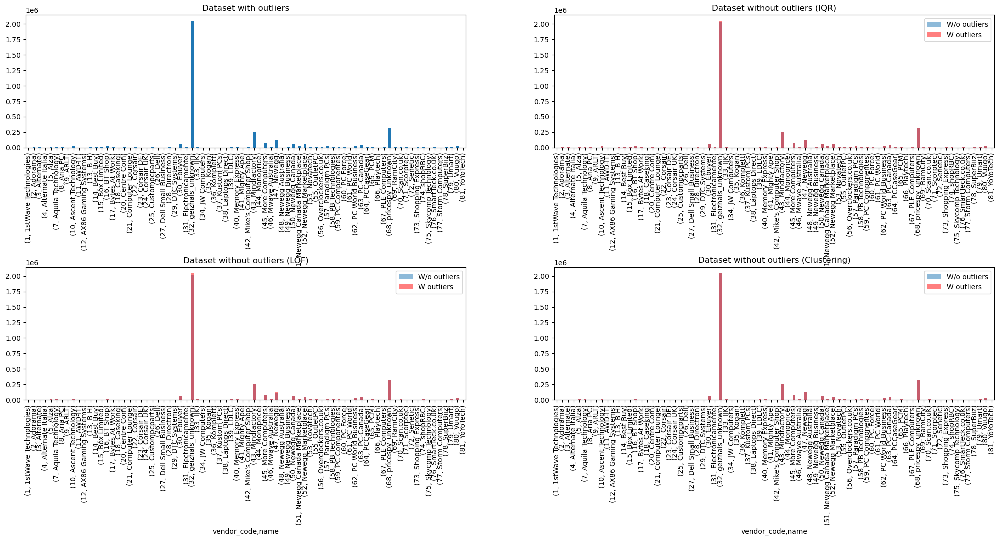

In [153]:
plot_vendor_comparison_num_simple("I")

This feature wasn't impacted since it doesn't care about the removal of extreme values in the sales_uds/sales_currency features.

### Iu: number of unique items sold by the vendor

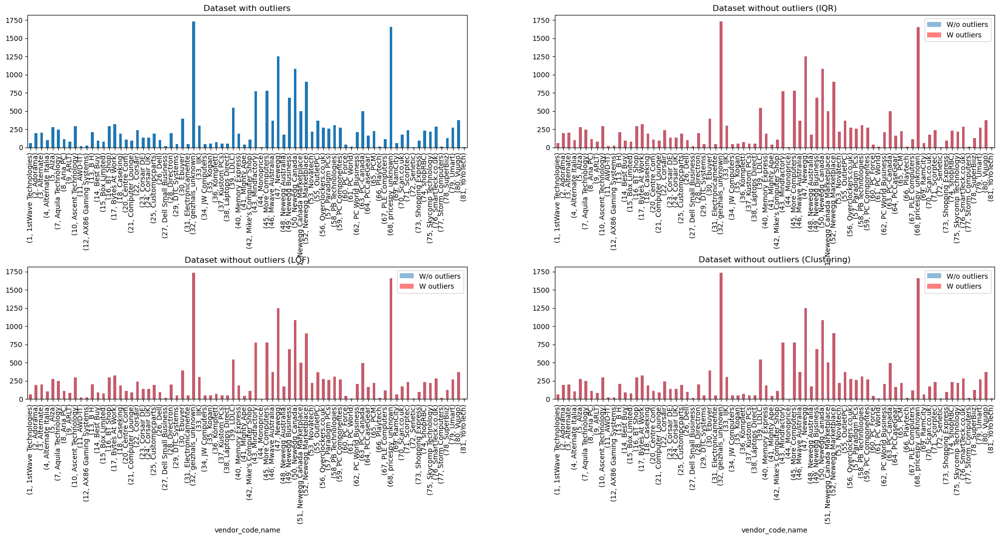

In [154]:
plot_vendor_comparison_num_simple("Iu")

Small changes for some vendors, apparently some products sales were composed entirely of outliers.

### TotRev: total revenue of the vendor

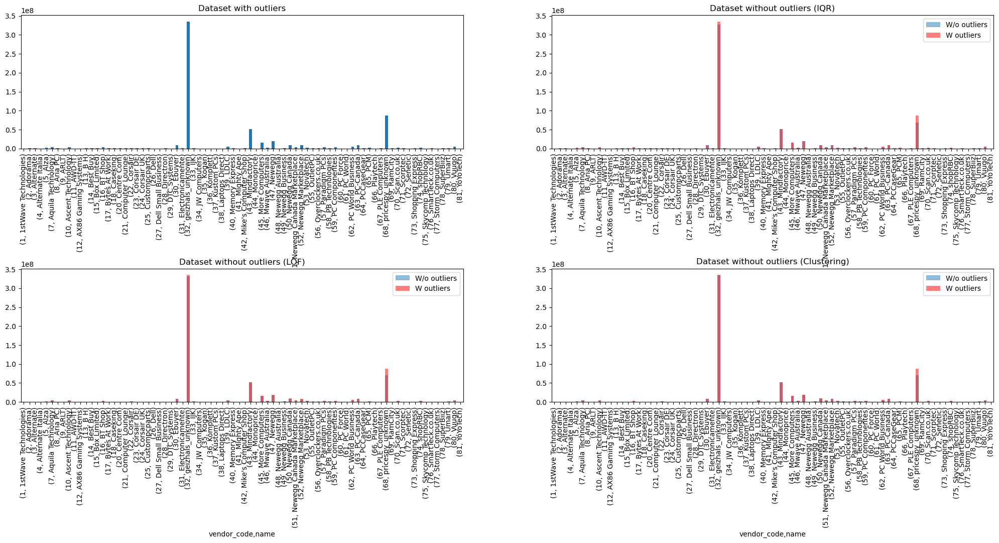

In [155]:
plot_vendor_comparison_num_simple("TotRev")

The revenue for some vendors decreased a bit, this is due to the removal of the sales outliers.

### MaxValuePerOrder: most expensive (USD) item sold by the vendor

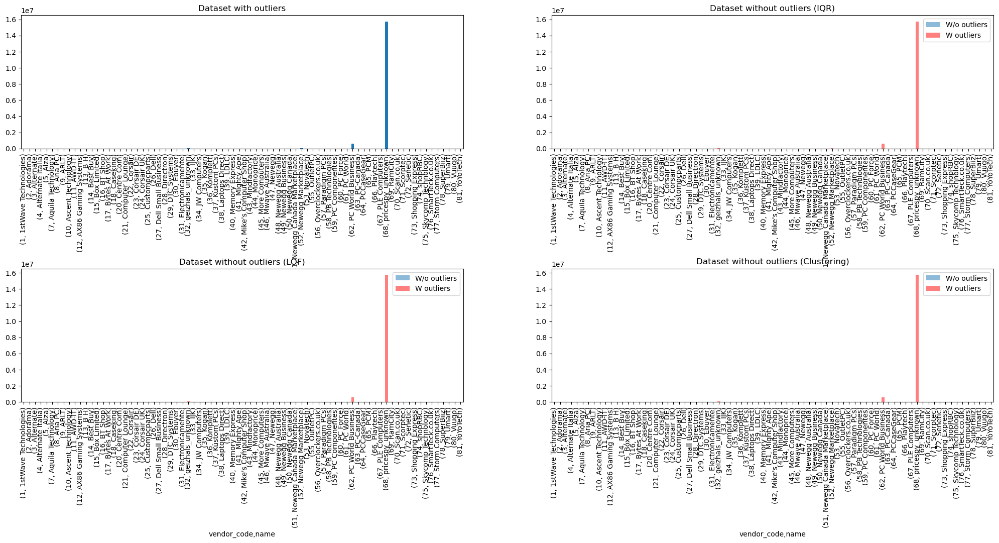

In [156]:
plot_vendor_comparison_num_simple("MaxValuePerOrder")

Considering that the outliers targeted were extreme values (in particular the peak of vendor 68) of the sales_uds/sales_currency features, this outcome was expected.  
However it is interesting to note how differently the algorithms behave, in particular the IQR approach cut a lot of big data points and LOF removed many middling values while also keeping the highest ones (vendor 32, geizhals_unknown).  
Clustering seems the more balanced approach in this case.

### AvgValuePerOrder: average of the price (USD) of the items sold by the vendor

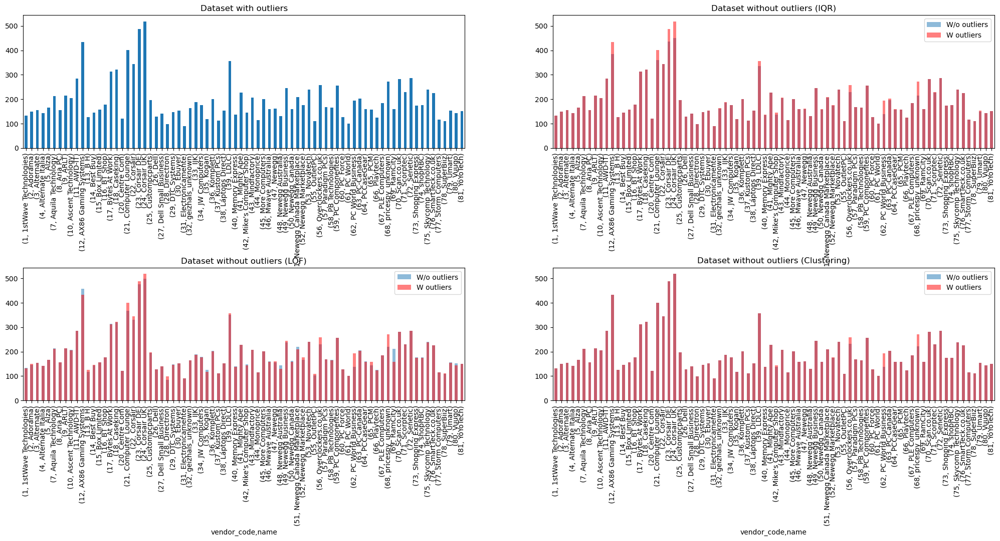

In [157]:
plot_vendor_comparison_num_simple("AvgValuePerOrder")

The removal of extreme values here had the following effects:
- IQR lowered the average value for some vendors
- LOF managed to both decrease for some vendors and increase the average for others, this is due to the removal of really small sales_usd values (~0)
- Clustering lowered the average for some vendors

### AvgMemoryPerOrder: average amount of memory of the items sold by the vendor

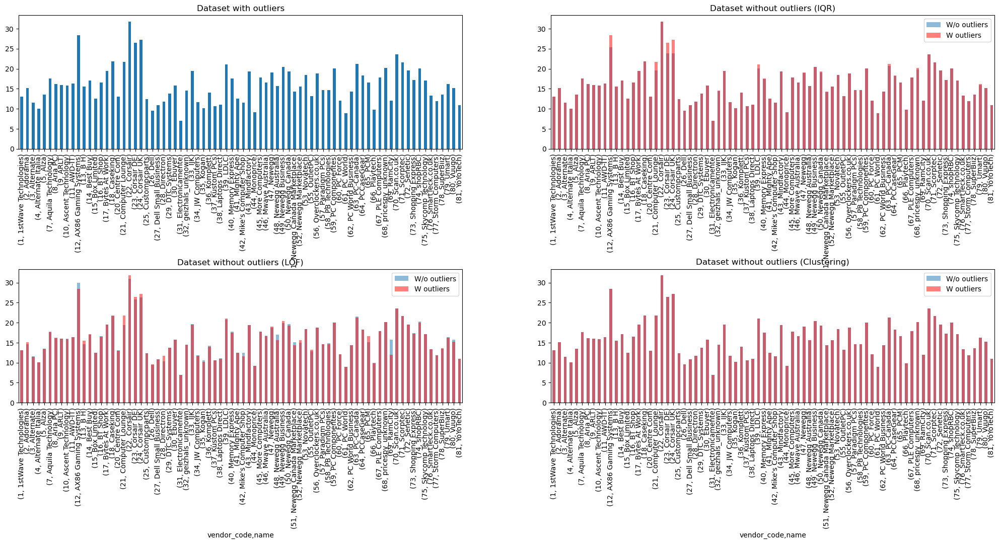

In [158]:
plot_vendor_comparison_num_simple("AvgMemoryPerOrder")

Again LOF managed to increase the average.  
Note that the entries with the small sales value have also a small memory size.

### IMaxMonthSales: maximum value (usd) of items sold in any month by the vendor

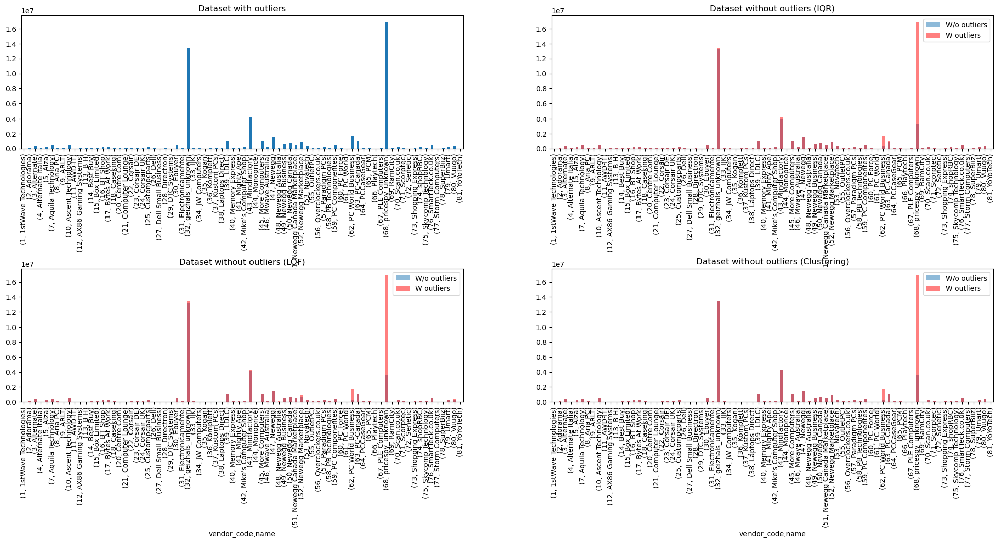

In [159]:
plot_vendor_comparison_num_simple("IMaxMonthSales")

All of the outlier detection methods had more or less the same impact, the main change is the removal of extreme entries for vendor 68/pricespy_unknown.  
The remaining spike is accounted for given the high amount of sales generated by vendor 32, as can be seen in the plots above.

### IAvgMonthSales: average value of sales in a month by the vendor

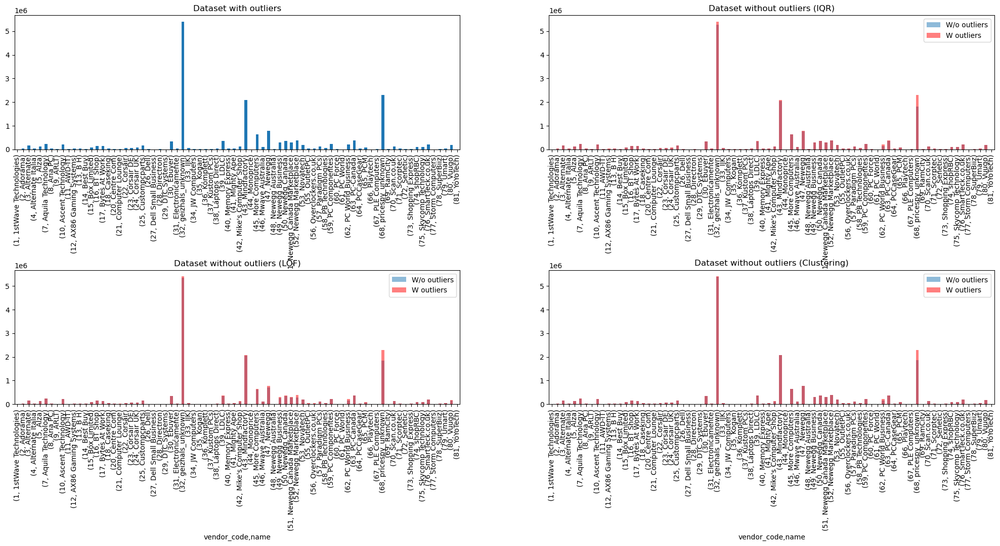

In [160]:
plot_vendor_comparison_num_simple("IAvgMonthSales")

Fairly consistent behaviour, even after outlier removal.

### IMaxMonthItems: maximum number of items sold in any month by the vendor

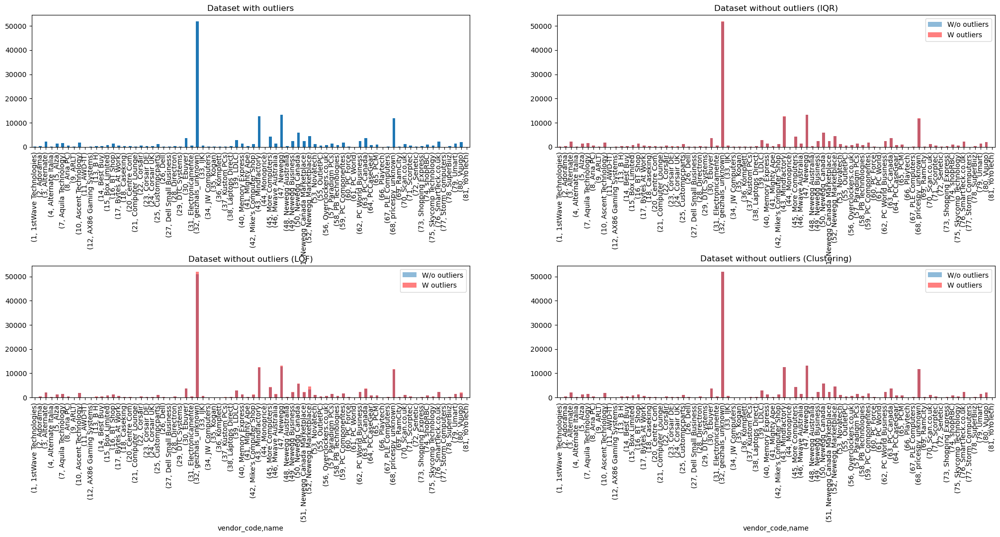

In [161]:
plot_vendor_comparison_num_simple("IMaxMonthItems")

Same as above.

### IAvgMonthItems: average number of items sold in a month by the vendor

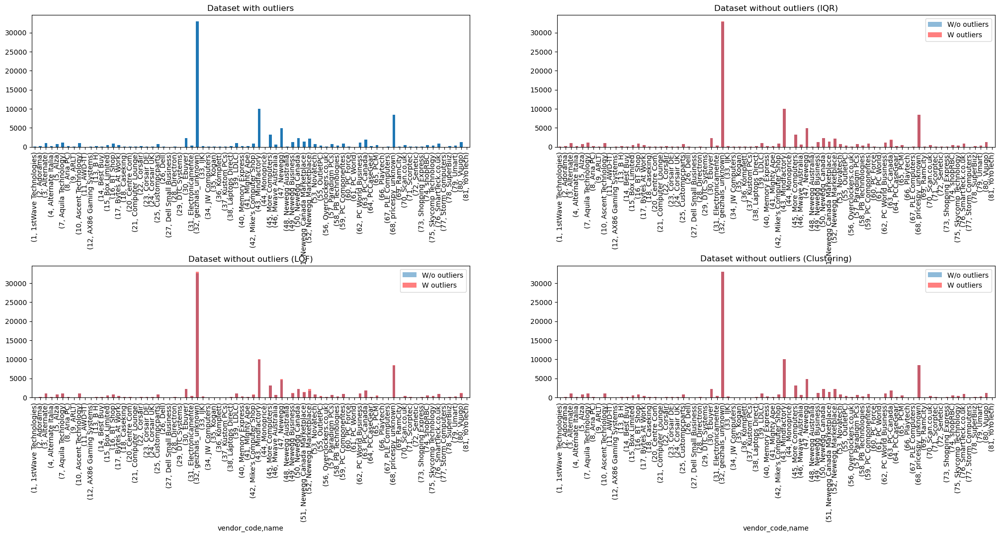

In [162]:
plot_vendor_comparison_num_simple("IAvgMonthItems")

Again, it isn't directly impacted by outliers in the original dataset.

### TotMonthBusiness: total number of months that vendor has been selling ram for

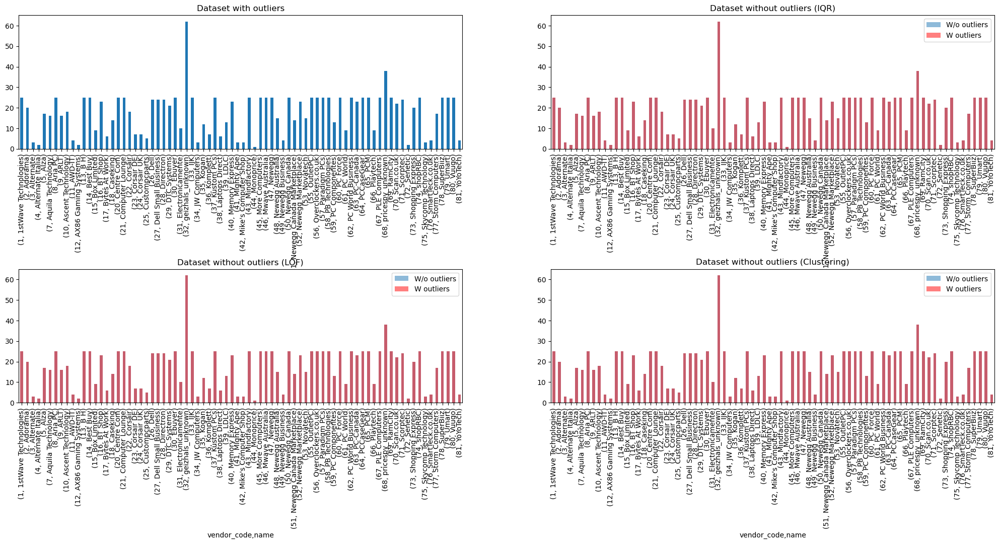

In [163]:
plot_vendor_comparison_num_simple("TotMonthBusiness")

No changes, as expected given that there shouldn't be any meaningful link between the removal of some entries and the decrease in longevity of the business.

### AvgItemAvail: average amount of days a product is available for sale for

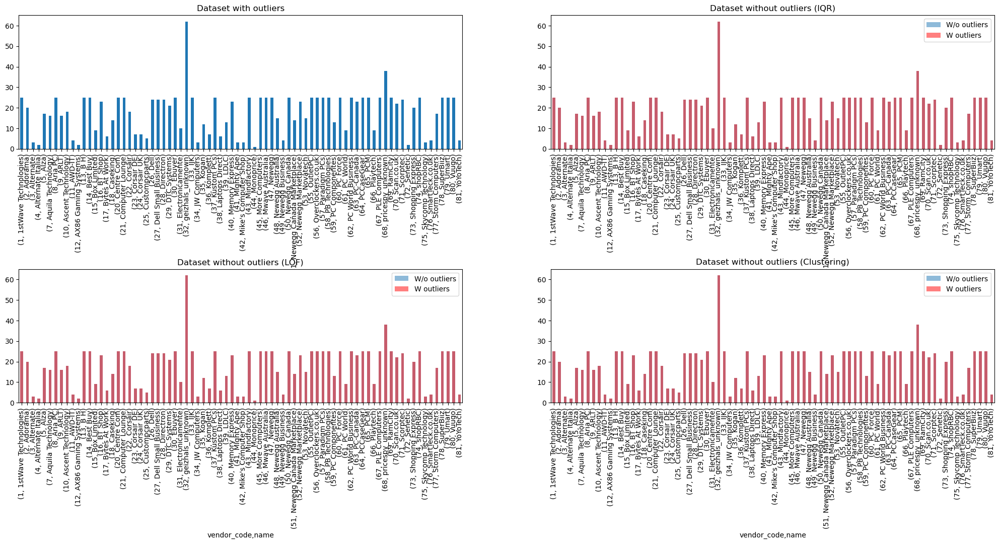

In [164]:
plot_vendor_comparison_num_simple("TotMonthBusiness")

Same as above.

### Eram: Shannon's entropy of the ram modules sold

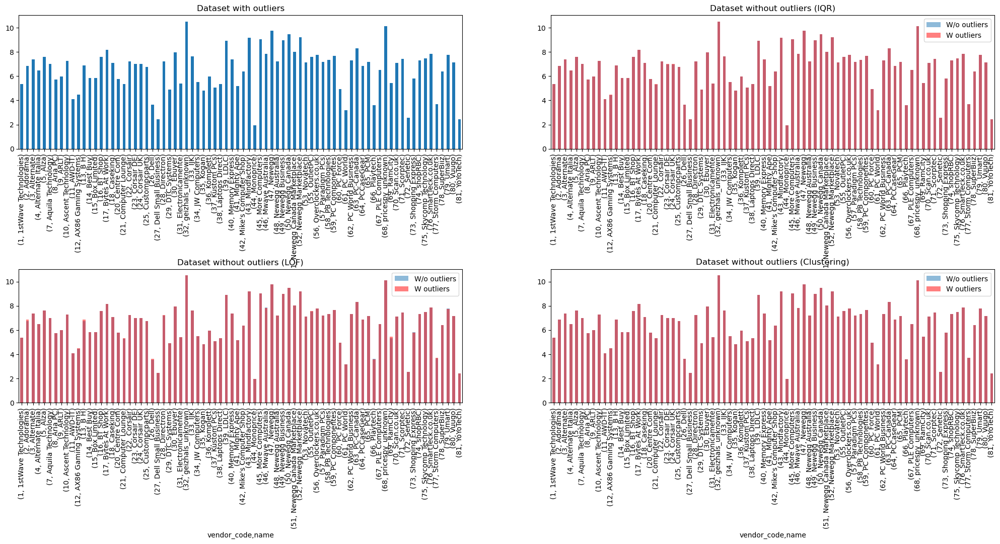

In [165]:
plot_vendor_comparison_num_simple("Eram")

Small changes only for LOF.

### Egeo: Shannon's entropy of the countries in which the sales took place

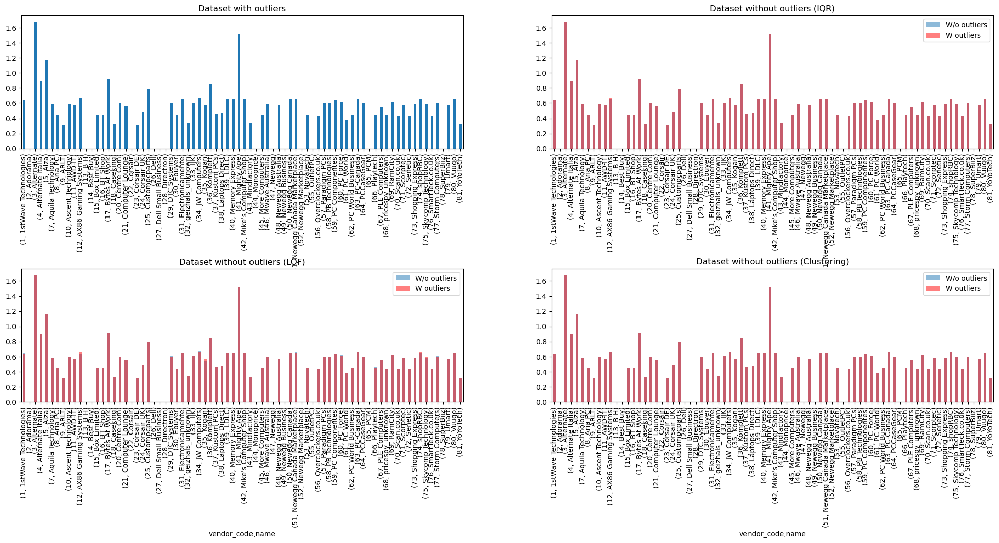

In [166]:
plot_vendor_comparison_num_simple("Egeo")

Only LOF has a visible impact.

### Ecur: Shannon's entropy of the currencies used

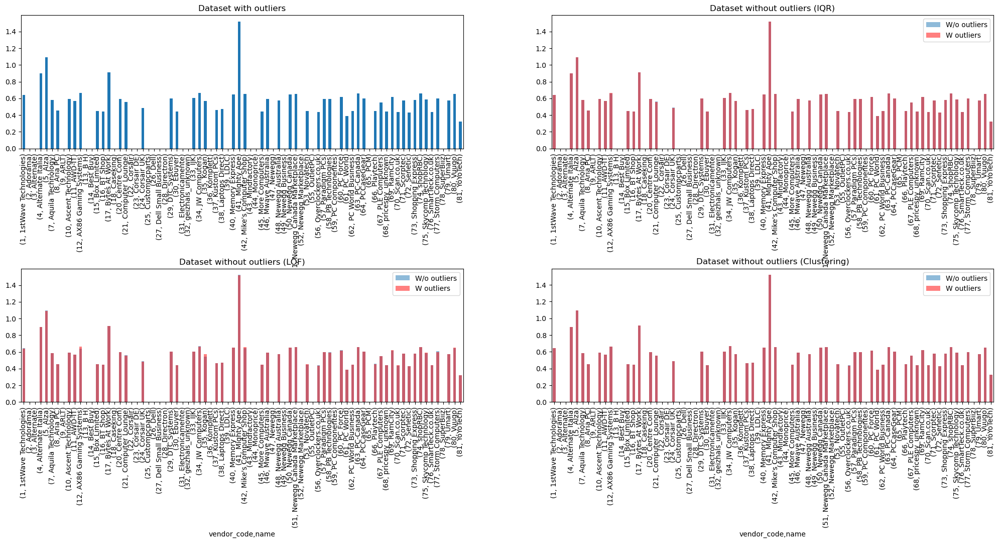

In [167]:
plot_vendor_comparison_num_simple("Ecur")

Only LOF has a visible impact.

### Correlations  
In order to simplify our analysis we will take a look at highly correlated features (>=0.90) and remove them.

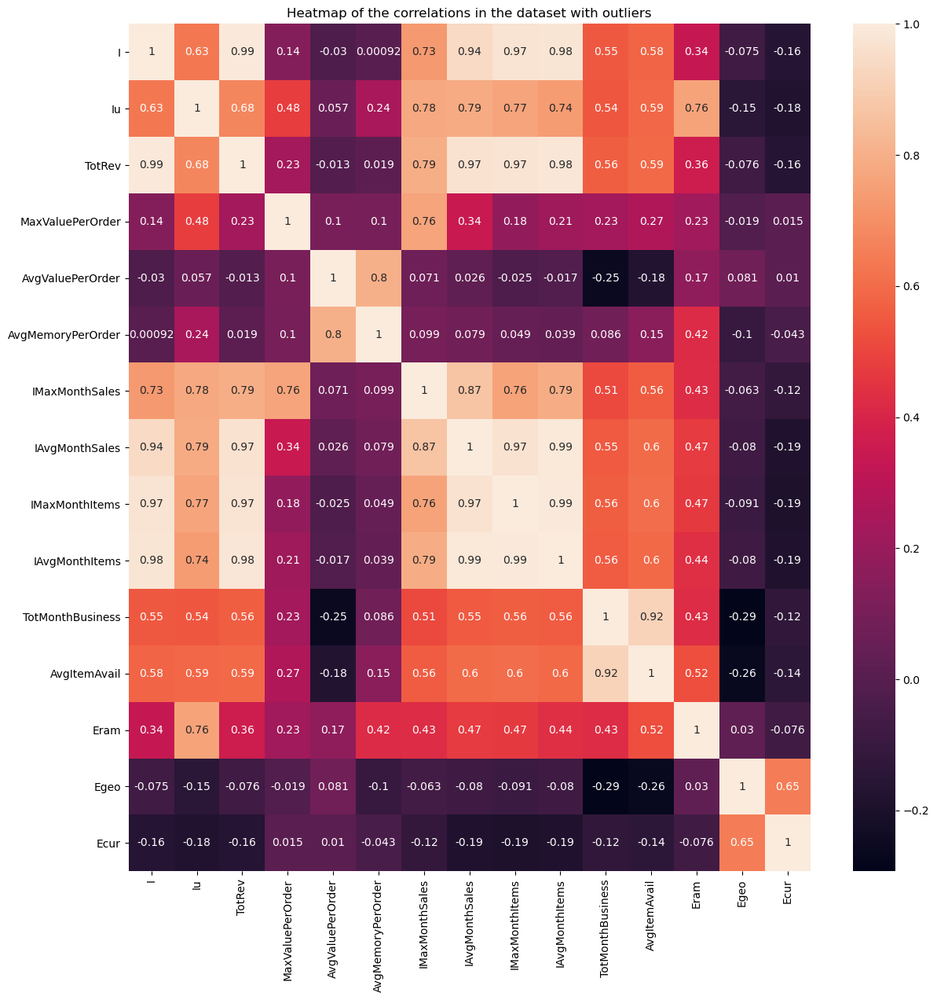

In [168]:
plt.figure(figsize=(14,14))
plt.title("Heatmap of the correlations in the dataset with outliers")
sn.heatmap(vend_df_w_out_num.corr(), annot=True)
plt.show()

There are many very strong correlations in here, let's list them:  
- (I, TotRev)
- (I, IAvgMonthSales)
- (I, IMaxMonthItems)
- (I, IAvgMonthItems)
- (TotRev, IAvgMonthSales)
- (TotRev, IMaxMonthItems)
- (TotRev, IAvgMonthItems)
- (IAvgMonthSales, IMaxMonthItems)
- (IAvgMonthSales, IAvgMonthItems)
- (IMaxMonthItems, IAvgMonthItems)
- (TotMonthBusiness, AvgItemAvail)

All of these correlations can be explained by the simple fact that the more items a vendor sells the greater the profit.

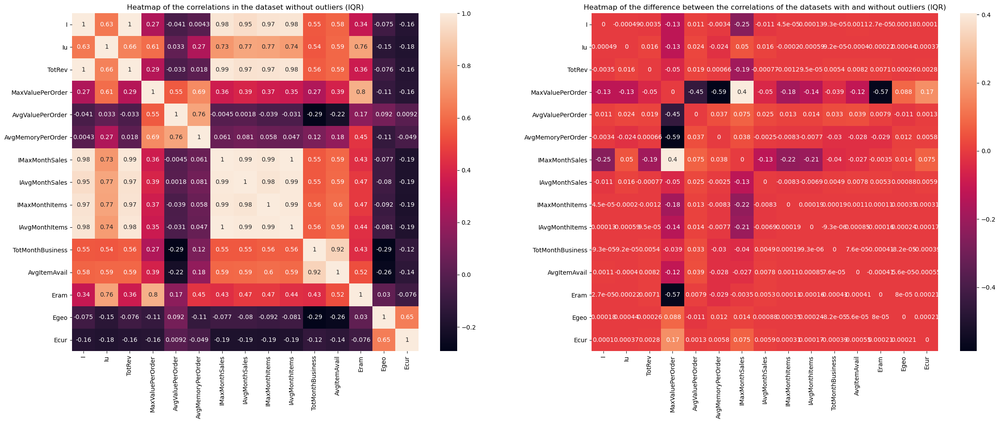

In [169]:
fig = plt.figure(figsize=(28, 10))
fig_dims = (1, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Heatmap of the correlations in the dataset without outliers (IQR)")
sn.heatmap(vend_df_wo_out_iqrcox_num.corr(), annot=True)

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Heatmap of the difference between the correlations of the datasets with and without outliers (IQR)")
sn.heatmap(vend_df_w_out_num.corr()-vend_df_wo_out_iqrcox_num.corr(), annot=True)

plt.show()

IQR had a big impact (abs(x)>0.30) on the following correlations:  
- (MaxValuePerOrder, AvgValuePerOrder): as previously observed, while MaxValuePerOrder took a dive AvgValuePerOrder remained stable.
- (MaxValuePerOrder, AvgMemoryPerOrder)
- (MaxValuePerOrder, IMaxMonthSales): single-handedly caused by the removal of exteme values of vendor 68
- (MaxValuePerOrder, Eram): same as for AvgValuePerOrder

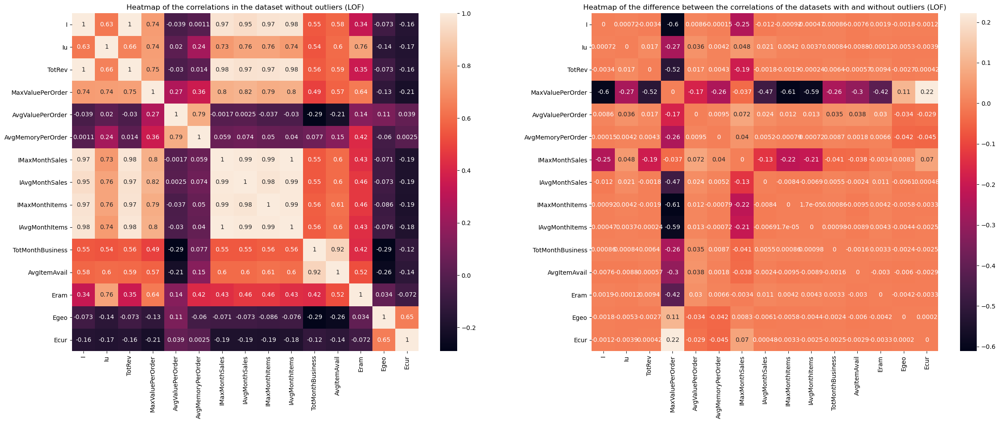

In [170]:
fig = plt.figure(figsize=(28, 10)) 
fig_dims = (1, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Heatmap of the correlations in the dataset without outliers (LOF)")
sn.heatmap(vend_df_wo_out_lof_num.corr(), annot=True)

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Heatmap of the difference between the correlations of the datasets with and without outliers (LOF)")
sn.heatmap(vend_df_w_out_num.corr()-vend_df_wo_out_lof_num.corr(), annot=True)

plt.show()

LOF had a big impact (abs(x)>0.30) on the following correlations:  
- (I, MaxValuePerOrder): coincidence, this is due to the particular distribution of MaxValuePerOrder after applying LOF. Note how the other methods didn't have such an high correlation.
- (TotRev, MaxValuePerOrder)
- (MaxValuePerOrder, IAvgMonthSales)
- (MaxValuePerOrder, IMaxMonthItems)
- (MaxValuePerOrder, IAvgMonthItems)
- (MaxValuePerOrder, AvgItemAvail)
- (MaxValuePerOrder, Eram)

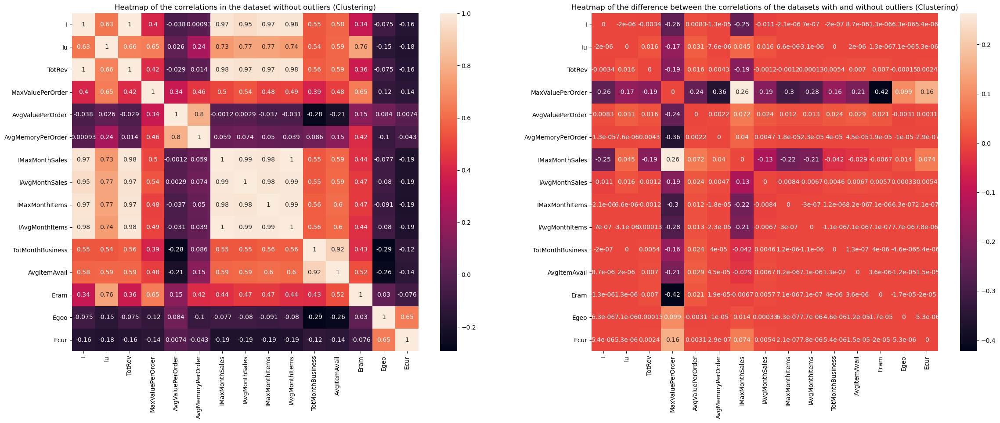

In [171]:
fig = plt.figure(figsize=(28, 10)) 
fig_dims = (1, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Heatmap of the correlations in the dataset without outliers (Clustering)")
sn.heatmap(vend_df_wo_out_clustering_num.corr(), annot=True)

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Heatmap of the difference between the correlations of the datasets with and without outliers (Clustering)")
sn.heatmap(vend_df_w_out_num.corr()-vend_df_wo_out_clustering_num.corr(), annot=True)

plt.show()

Clustering had a big impact (abs(x)>0.30) on the following correlations:  
- (MaxValuePerOrder, AvgMemoryPerOrder)
- (MaxValuePerOrder, IMaxMonthItems)
- (MaxValuePerOrder, Eram)

In this case MaxValuerPerOrder changed while the other features stayed the same.

## Categorical feature analysis

In [172]:
def plot_value_comparison_cat(df_w_out, df_wo_out_list, feature, name_list=None, comp=True):
    
    if len(df_wo_out_list) != len(name_list):
        raise RuntimeError
    
    fig = plt.figure(figsize=(25, 10)) 
    fig_dims = (len(df_wo_out_list)//2 + 1, 2)
    fig.subplots_adjust(hspace=0.5, wspace=0.2)

    plt.subplot2grid(fig_dims, (0, 0))
    plt.title("Dataset with outliers")
    labels_w_out, counts_w_out = np.unique(df_w_out[feature], return_counts=True)
    plt.bar(labels_w_out, counts_w_out, align='center', alpha=0.5, label="W outliers")
    plt.ylabel("Vendor count")
    plt.xticks(rotation=90)
    
    for i in range(len(df_wo_out_list)):
        
        plt.subplot2grid(fig_dims, ((i+1)//2, (i+1)%2))
        plt.title(f"Dataset without outliers ({name_list[i]})")
        labels, counts = np.unique(df_wo_out_list[i][feature], return_counts=True)
        plt.bar(labels, counts, align='center', alpha=0.5, label="W/o outliers")
        if comp:
            plt.bar(labels_w_out, counts_w_out, align='center', alpha=0.5, color="r", label="W outliers")
        plt.ylabel("Vendor count")
        plt.legend()
        plt.xticks(rotation=90)

    plt.show()

### TopBrand: top grossing brand for vendors

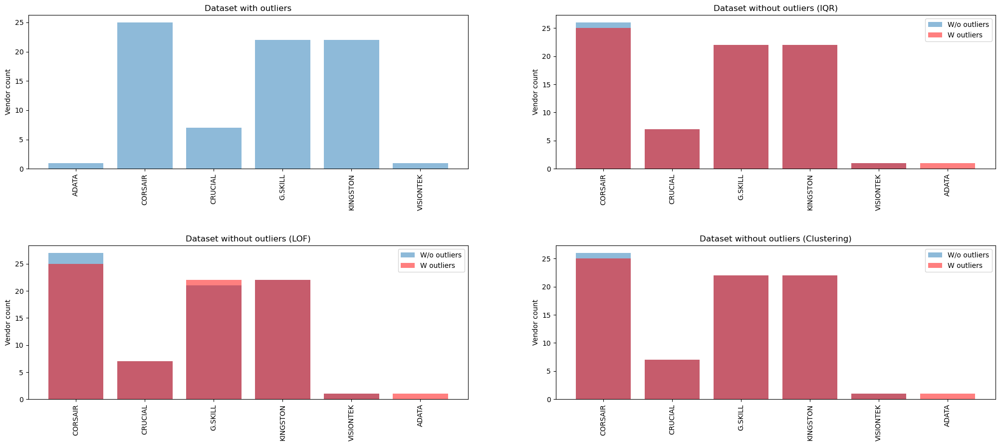

In [173]:
df_list = [vend_df_wo_out_iqrcox_cat, vend_df_wo_out_lof_cat, vend_df_wo_out_clustering_cat]
name_list = ["IQR", "LOF", "Clustering"]

plot_value_comparison_cat(vend_df_w_out_cat, df_list, "TopBrand", name_list)

Corsair, G.SKILL and KINGSTON are the clear winners in terms of profit.

The removal of the outliers has a strong impact here, ADATA is no more a top grossing brand for anyone while CORSAIR increased.

### TopCountry: top grossing country for vendors

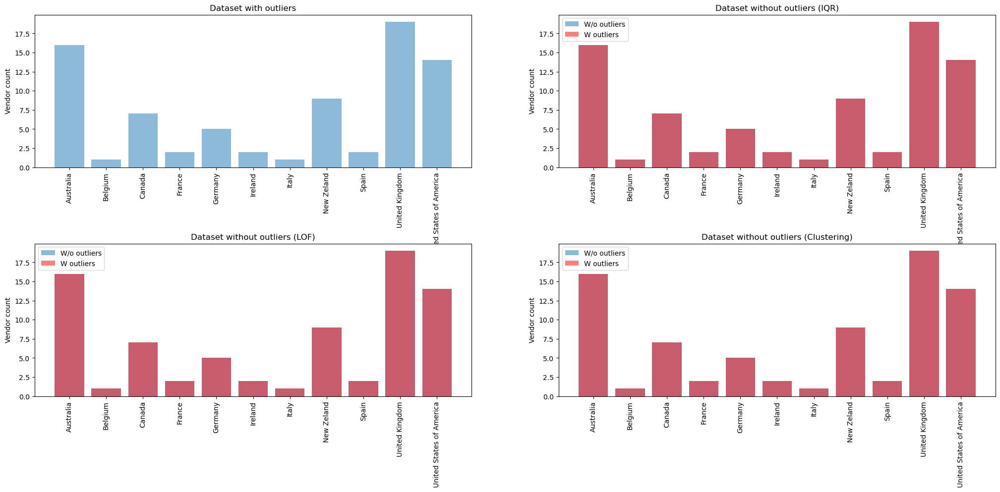

In [174]:
df_list = [vend_df_wo_out_iqrcox_cat, vend_df_wo_out_lof_cat, vend_df_wo_out_clustering_cat]
name_list = ["IQR", "LOF", "Clustering"]

plot_value_comparison_cat(vend_df_w_out_cat, df_list, "TopCountry", name_list)

TopCountry is completely unaffected by the removal of outliers.  

Interesting to note how Australia, New Zealand and the USA seem to punch far above their weight compared to the distributions of sales per continent given at the beginning.  
This however might be due to the fact that Europe is a more fragmented market.

### TopCurrency: top currency used for sales by vendors

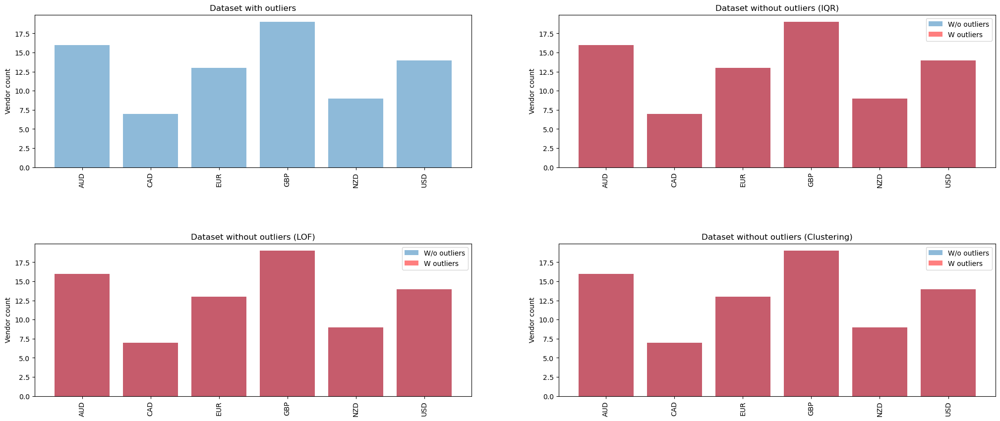

In [175]:
df_list = [vend_df_wo_out_iqrcox_cat, vend_df_wo_out_lof_cat, vend_df_wo_out_clustering_cat]
name_list = ["IQR", "LOF", "Clustering"]

plot_value_comparison_cat(vend_df_w_out_cat, df_list, "TopCurrency", name_list)

This seems to clarify our previous curiosity given that the sum of the currencies in the Europe region (EUR, GBP) is by fare the biggest, however when compared to the sales distributions the other countries' results are still impressive.

TopCurrency is unaffected by the removal of outliers.

### TopSalesMonth: top month by revenue across years

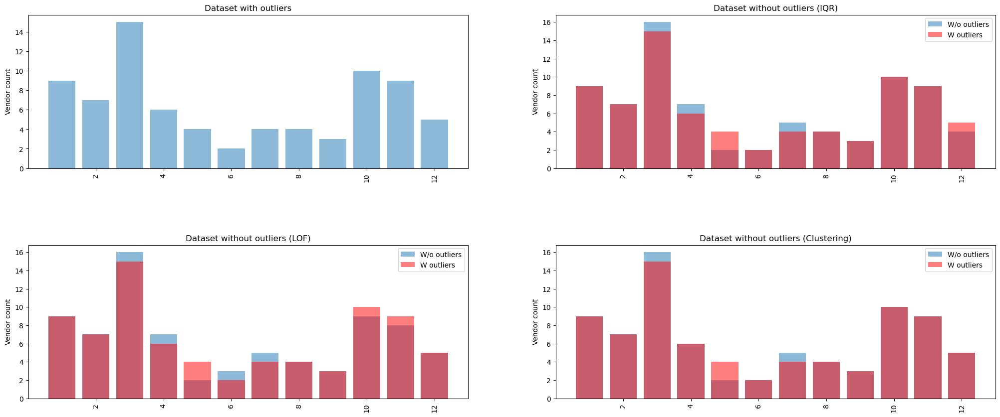

In [176]:
df_list = [vend_df_wo_out_iqrcox_cat, vend_df_wo_out_lof_cat, vend_df_wo_out_clustering_cat]
name_list = ["IQR", "LOF", "Clustering"]

plot_value_comparison_cat(vend_df_w_out_cat, df_list, "TopSalesMonth", name_list)

Interestingly the month with the highest revenue is March, we can only guess it is for some kind of spring/spring break sale.

TopSalesMonth is clearly affected by the removal of outliers, it seems that the most expensive sales in the outliers take place in the months of May, October, November and December, possibly as a consequence of the holidays in the last months of the year.  
While the least expensive ones take place in the months of March, April, June and July.

### Conclusions  
The impact on the features of the different techniques is very subtle, we think that the most interesting changes were brought by using the LOF dataset.  
LOF has the benefit of being middle of the road approach in terms of number of outliers removed and handling of the low-end of the outliers.  
Clustering ignores completely the low-end and doesn't impact the feature dataset in any meaningful way.  
Finally we feel that IQR is almost as good as LOF but tends to remove an umcomfortable amount of data points and is too aggressive in reducing the range of values.

For these reasons, from now on, we will use the dataset without outliers constructed using LOF.

In [177]:
vend_df_num = vend_df_wo_out_lof_num
vend_df_cat = vend_df_wo_out_lof_cat

## Feature outliers 

In [178]:
vend_df_num.loc[32]

,I,Iu,TotRev,MaxValuePerOrder,AvgValuePerOrder,AvgMemoryPerOrder,IMaxMonthSales,IAvgMonthSales,IMaxMonthItems,IAvgMonthItems,TotMonthBusiness,AvgItemAvail,Eram,Egeo,Ecur
name,,,,,,,,,,,,,,,
geizhals_unknown,2020083,1733,3.313065e+08,10630.741494,164.006403,14.541547,1.323581e+07,5.343654e+06,50985,32581.983871,62,1188.010387,10.512789,0.337642,0.0


In [179]:
#Plot a grid of boxplots, each cell can optionally contain also a boxplot of the outliers
def boxplot_grid(df, n_rows, n_cols, outliers=None):
        
        #Make local copy of df
        df = df.copy()
        
        orig_columns = df.columns
        no_outlier_suffix = "_wo_out"
        outlier_suffix = "_out"
        outliers_condition = type(outliers).__name__ == "DataFrame"
        
        f, axs = plt.subplots(nrows = n_rows, ncols = n_cols, figsize=(20,4*n_rows))
        f.subplots_adjust(hspace=0.5, wspace=0.2)
        
        if(outliers_condition):
            
            outliers = outliers.copy()
            
            df = df.add_suffix(no_outlier_suffix)
            outliers = outliers.add_suffix(outlier_suffix)
            df.loc[df.index.isin(outliers.index)] = np.NaN
            df = df.join(outliers, how="left")
        
        for i in range(len(orig_columns)):
            
            cur_col = orig_columns[i]
            
            if(outliers_condition):
                #Plot both normal and outlier column
                cur_col = [cur_col + no_outlier_suffix, cur_col + outlier_suffix]
            
            df.boxplot(column=cur_col, ax=axs[int(i/n_cols)][i%n_cols])
            axs[int(i/n_cols)][i%n_cols].set_title(orig_columns[i])
            
        plt.show()

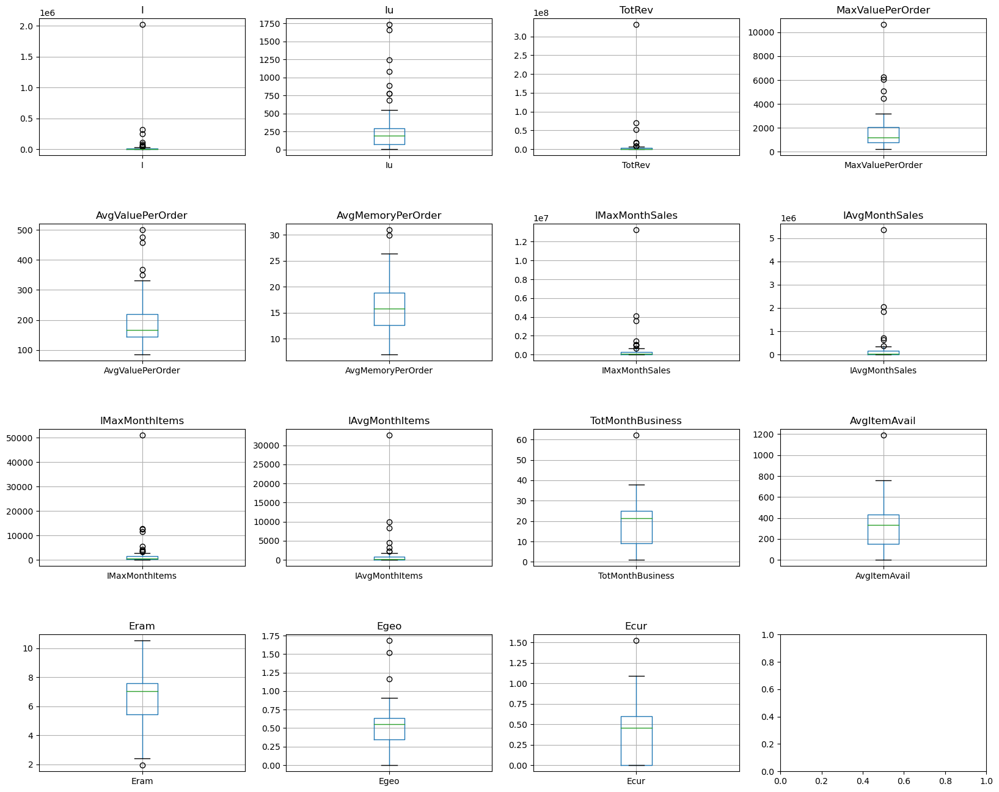

In [180]:
boxplot_grid(vend_df_num, 4, 4)

Some features have a bigger problems with outliers than others, in particular I, TotRev, MaxValuePerOrder, IMaxMonthSales, IAvgMonthSales, IMaxMonthItems and IAvgMonthItems seem worrying.

In [181]:
for col in vend_df_num.columns:
    print(f"The vendor with the max value in {col} is: {vend_df_num[col].idxmax(axis=1)}")

The vendor with the max value in I is: (32, 'geizhals_unknown')
The vendor with the max value in Iu is: (32, 'geizhals_unknown')
The vendor with the max value in TotRev is: (32, 'geizhals_unknown')
The vendor with the max value in MaxValuePerOrder is: (32, 'geizhals_unknown')
The vendor with the max value in AvgValuePerOrder is: (24, 'Corsair UK')
The vendor with the max value in AvgMemoryPerOrder is: (22, 'Corsair')
The vendor with the max value in IMaxMonthSales is: (32, 'geizhals_unknown')
The vendor with the max value in IAvgMonthSales is: (32, 'geizhals_unknown')
The vendor with the max value in IMaxMonthItems is: (32, 'geizhals_unknown')
The vendor with the max value in IAvgMonthItems is: (32, 'geizhals_unknown')
The vendor with the max value in TotMonthBusiness is: (32, 'geizhals_unknown')
The vendor with the max value in AvgItemAvail is: (32, 'geizhals_unknown')
The vendor with the max value in Eram is: (32, 'geizhals_unknown')
The vendor with the max value in Egeo is: (3, 'Alt

It seems that all the more evident outliers can be attributed to geizhals_unknown, which as we noted earlier is an online price comparison engine and not a retail vendor.  
Let's see if there are any other outliers by using the same techniques used in the original dataset.

### Normalisation

In [182]:
scaler = StandardScaler()
scaler.fit(vend_df_num.values)
vend_norm = scaler.transform(vend_df_num.values)
vend_df_norm = pd.DataFrame(vend_norm, columns=vend_df_num.columns, index=vend_df_num.index)

### IQR

In [183]:
boxcox_dict = {}

#Boxcox cannot be applied on features with value 0
for col in vend_df_num.columns[:-2]:
    boxcox_dict[col] = stats.boxcox(vend_df_num[col])[0]

vend_df_num_boxcox = pd.DataFrame(boxcox_dict, index=vend_df_num.index)
#Re-add the features previously ignored
vend_df_num_boxcox = vend_df_num_boxcox.join(vend_df_num[vend_df_num.columns[-2:]])

In [184]:
Q1 = vend_df_num_boxcox.quantile(0.25)
Q3 = vend_df_num_boxcox.quantile(0.75)
IQR = Q3 - Q1
right_whisker = Q3 + 1.5*IQR
left_whisker = Q1 - 1.5*IQR

In [185]:
vend_df_num_wo_out_iqr = vend_df_num_boxcox.copy()

for col in vend_df_num_wo_out_iqr.columns:
    vend_df_num_wo_out_iqr = vend_df_num_wo_out_iqr.loc[(vend_df_num_wo_out_iqr[col] >= left_whisker[col]) & \
                                                        (vend_df_num_wo_out_iqr[col] <= right_whisker[col])]
    
vend_outlier_df_iqr = \
    vend_df_num.loc[~vend_df_num.index.isin(vend_df_num_wo_out_iqr.index)]

In [186]:
print(f"Total number of outliers: {vend_outlier_df_iqr.shape[0]}")
print(f"Percentage of outliers among the data points: {vend_outlier_df_iqr.shape[0]/vend_df_num.shape[0]*100:3.2f}%")

Total number of outliers: 7
Percentage of outliers among the data points: 8.97%


In [187]:
vend_outlier_df_iqr.head(10)

,,I,Iu,TotRev,MaxValuePerOrder,AvgValuePerOrder,AvgMemoryPerOrder,IMaxMonthSales,IAvgMonthSales,IMaxMonthItems,IAvgMonthItems,TotMonthBusiness,AvgItemAvail,Eram,Egeo,Ecur
vendor_code,name,,,,,,,,,,,,,,,
3,Alternate,3047,203,4.726939e+05,860.154236,155.134195,11.530030,3.256996e+05,1.575646e+05,2118,1015.666667,3,38.438424,7.373634,1.679995,0.000000
5,Alza,12959,276,2.151670e+06,1188.115658,166.036705,13.514777,2.394492e+05,1.265688e+05,1296,762.294118,17,299.789855,7.612859,1.165894,1.094659
28,Directron,2887,192,2.456865e+05,1588.980000,85.100982,10.323519,3.601166e+04,1.023694e+04,385,120.291667,24,603.354167,7.219970,0.000000,0.000000
32,geizhals_unknown,2020083,1733,3.313065e+08,10630.741494,164.006403,14.541547,1.323581e+07,5.343654e+06,50985,32581.983871,62,1188.010387,10.512789,0.337642,0.000000
41,Mighty Ape,480,41,1.095600e+05,624.480568,228.249903,12.516667,6.212257e+04,3.651998e+04,268,160.000000,3,36.853659,5.165624,1.522173,1.522173
44,Monoprice,7,4,8.049300e+02,209.990000,114.990000,9.142857,8.049300e+02,8.049300e+02,7,7.000000,1,0.750000,1.950212,0.000000,0.000000
68,pricespy_unknown,318591,1659,7.027305e+07,4465.589602,220.574502,20.171635,3.597214e+06,1.849291e+06,11557,8383.973684,38,761.778782,10.118133,0.441207,0.441207


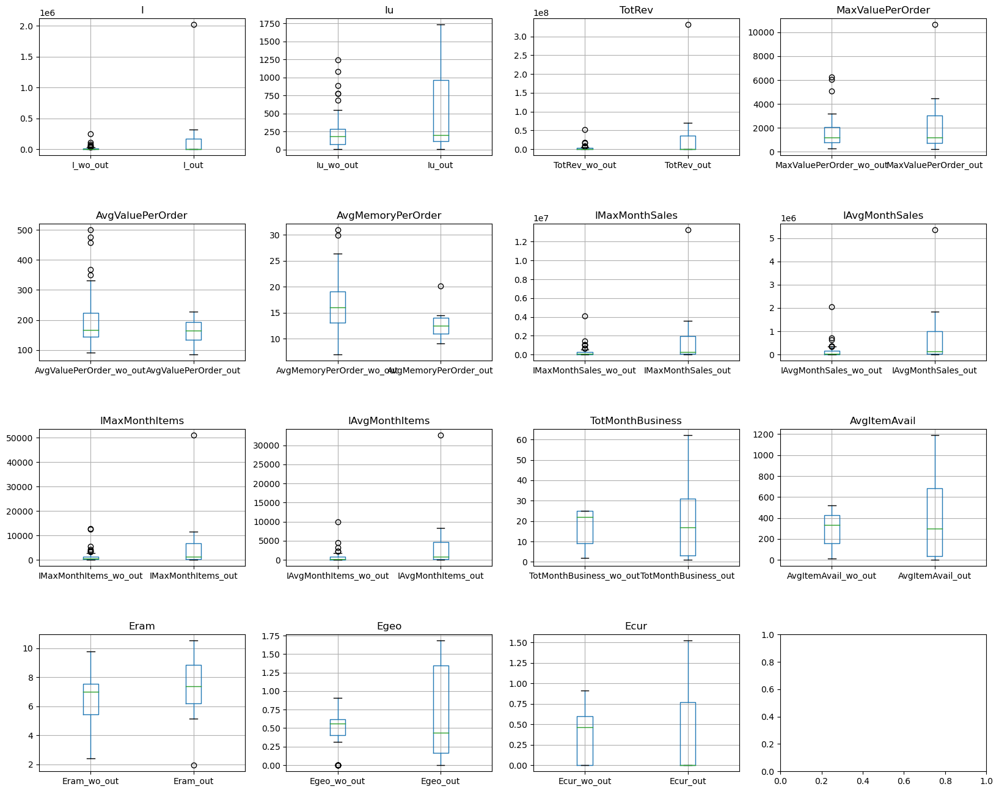

In [188]:
boxplot_grid(vend_df_num, 4, 4, vend_outlier_df_iqr)

Here the outliers are plenty, also due to the fact that the boxcox transformation cannot easily handle features with values equal to 0 such as Egeo and Ecur.  
Ignoring them the number of outliers goes down to 4.

## LOF

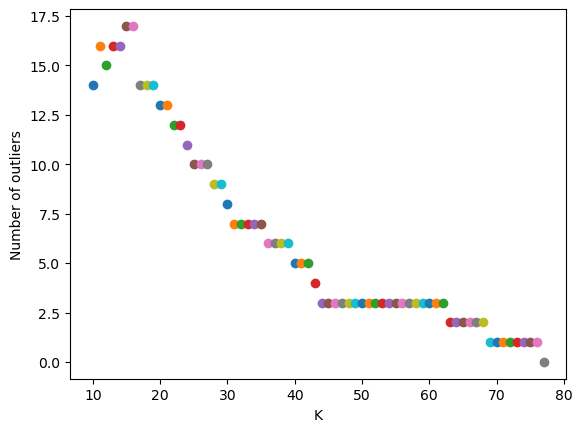

In [189]:
for k in range(10, len(vend_df_norm)):
    clf = LocalOutlierFactor(n_neighbors=k)
    #Note that we are using the zscore transformation of the values in order to find the outliers
    pred_array = clf.fit_predict(vend_norm)

    outliers_index = []
    for i in range(len(pred_array)):
        if pred_array[i] == -1:
            outliers_index.append(i)
            
    plt.scatter(k, len(outliers_index))

plt.ylabel("Number of outliers")
plt.xlabel("K")
plt.show()

We need to first choose an appropriate value to calculate the k-distance for LOF, the authors suggest to use a value of at least 10 for the minimum value and a maximum value such that it would be ok to consider any local cluster, distant from the main set, with a size greater than that a group of outliers.  
Given this guideline and the scarcity of data points it seems that the maximum should be in the range [10, 20], however the results are very poor in this case, probably due to the low number of data points to work with.

In [190]:
clf = LocalOutlierFactor(n_neighbors=20)
#Note that we are using the zscore transformation of the values in order to find the outliers
pred_array = clf.fit_predict(vend_norm)

outliers_index = []
for i in range(len(pred_array)):
    if pred_array[i] == -1:
        outliers_index.append(i)

lof_out_df = vend_df_num.iloc[outliers_index]
vend_df_num_wo_out_lof = vend_df_num.loc[~vend_df_num.index.isin(lof_out_df.index)]

print(f"Total number of outliers: {lof_out_df.shape[0]}")
print(f"Percentage of outliers among the data points: {lof_out_df.shape[0]/vend_df_num.shape[0]*100:3.2f}%")

Total number of outliers: 13
Percentage of outliers among the data points: 16.67%


In [191]:
lof_out_df.head()

,,I,Iu,TotRev,MaxValuePerOrder,AvgValuePerOrder,AvgMemoryPerOrder,IMaxMonthSales,IAvgMonthSales,IMaxMonthItems,IAvgMonthItems,TotMonthBusiness,AvgItemAvail,Eram,Egeo,Ecur
vendor_code,name,,,,,,,,,,,,,,,
3,Alternate,3047,203,472693.893451,860.154236,155.134195,11.530030,325699.590604,157564.631150,2118,1015.666667,3,38.438424,7.373634,1.679995,0.000000
12,AX86 Gaming Systems,123,24,56261.757467,2047.564694,457.412662,29.902439,41394.481565,28130.878733,88,61.500000,2,30.041667,4.437445,0.640497,0.640497
22,Corsair,2859,231,946149.943999,1864.990000,330.937371,30.890521,107009.141142,52563.885778,454,158.833333,18,357.346320,7.236990,0.000000,0.000000
23,Corsair DE,943,137,448758.313918,3121.908663,475.883684,25.834571,133233.622588,64108.330560,249,134.714286,7,151.569343,7.002753,0.316487,0.000000
24,Corsair UK,959,137,478980.633683,3180.842233,499.458429,26.329510,133742.888166,68425.804812,250,137.000000,7,152.627737,7.002291,0.488840,0.488840


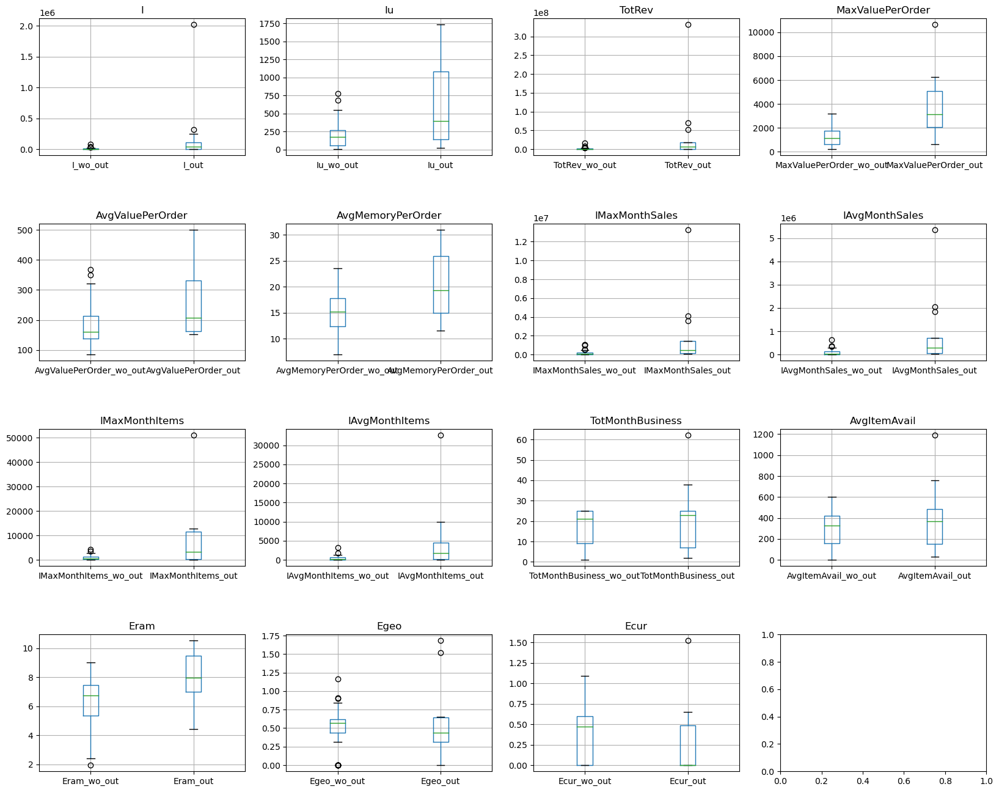

In [192]:
boxplot_grid(vend_df_num, 4, 4, lof_out_df)

### DBSCAN

In [193]:
def plot_knn_dist(nearest_n_list, datapoints_list, ytop=None):

    if(len(datapoints_list) != len(nearest_n_list)):
        raise RuntimeException
        
    list_len = len(nearest_n_list)
    nearest_dist_list = list()
    
    for i in range(list_len):
        
        nbrs = NearestNeighbors(n_neighbors=nearest_n_list[i], algorithm='ball_tree').fit(datapoints_list[i])
        distances, indices = nbrs.kneighbors(datapoints_list[i])

        nearest_dist_list.append(
            pd.DataFrame(distances)[nearest_n_list[i]-1].sort_values().reset_index()\
            .rename({"index":"orig_point", nearest_n_list[i]-1:"distance"}, axis=1)
        )

    # Knndistplot
    fig = plt.figure(figsize=(20, 5)) 
    fig_dims = (1, list_len)
    fig.subplots_adjust(hspace=0.2, wspace=0.2)
        
    for i in range(list_len):

        plt.subplot2grid(fig_dims, (0, i))
        plt.title("Knn-distplot")
        nearest_dist_list[i]["distance"].plot()
        plt.xlabel("Points sorted by distance")
        plt.ylabel(f"Distance to the {nearest_n_list[i]}-nth neighbour")
        
        if(ytop != None):
            plt.ylim(0, ytop)

    plt.show()

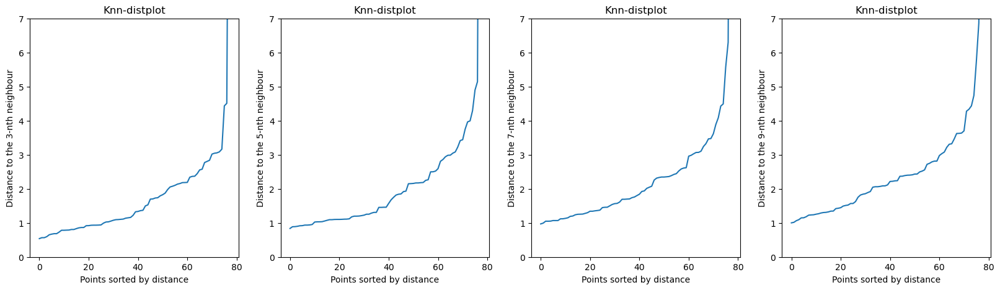

In [194]:
from sklearn.neighbors import NearestNeighbors
n_neigh = [3, 5, 7, 9]
plot_knn_dist(n_neigh, [vend_norm]*len(n_neigh), 7)

As usual we use the knee method to determine a good value for the parameters of DBSCAN.

In [195]:
vend_df_num_dbscan = vend_df_norm.copy()
dbscan = DBSCAN(min_samples = 5, eps = 3.7)
dbscan.fit(vend_df_num_dbscan.values)

cluster_series = pd.Series(data=dbscan.labels_, index=vend_df_num_dbscan.index)
cluster_outliers = cluster_series.transform(lambda x: 1 if x == -1 else 0)
vend_df_num_dbscan["Outlier"] = cluster_outliers

outlier_df_dbscan = vend_df_num.loc[vend_df_num_dbscan["Outlier"] == 1]
vend_df_num_wo_out_dbscan = vend_df_num.loc[vend_df_num_dbscan["Outlier"] == 0]

outlier_count = list(dbscan.labels_).count(-1)
print(f"Number of outliers: {outlier_count}")
print(f"Percentage of outliers among the data points: {outlier_count/vend_df_num_dbscan.shape[0]*100:3.2f}%")
print(f"Silhouette score: {silhouette_score(vend_df_num_dbscan, dbscan.labels_)}")

Number of outliers: 3
Percentage of outliers among the data points: 3.85%
Silhouette score: 0.6855364593679188


In [196]:
outlier_df_dbscan.head()

,,I,Iu,TotRev,MaxValuePerOrder,AvgValuePerOrder,AvgMemoryPerOrder,IMaxMonthSales,IAvgMonthSales,IMaxMonthItems,IAvgMonthItems,TotMonthBusiness,AvgItemAvail,Eram,Egeo,Ecur
vendor_code,name,,,,,,,,,,,,,,,
32,geizhals_unknown,2020083,1733,3.313065e+08,10630.741494,164.006403,14.541547,1.323581e+07,5.343654e+06,50985,32581.983871,62,1188.010387,10.512789,0.337642,0.000000
43,Mindfactory,248228,774,5.146890e+07,6044.234544,207.345263,19.361700,4.130746e+06,2.058756e+06,12455,9929.120000,25,486.188630,9.189418,0.334336,0.000000
68,pricespy_unknown,318591,1659,7.027305e+07,4465.589602,220.574502,20.171635,3.597214e+06,1.849291e+06,11557,8383.973684,38,761.778782,10.118133,0.441207,0.441207


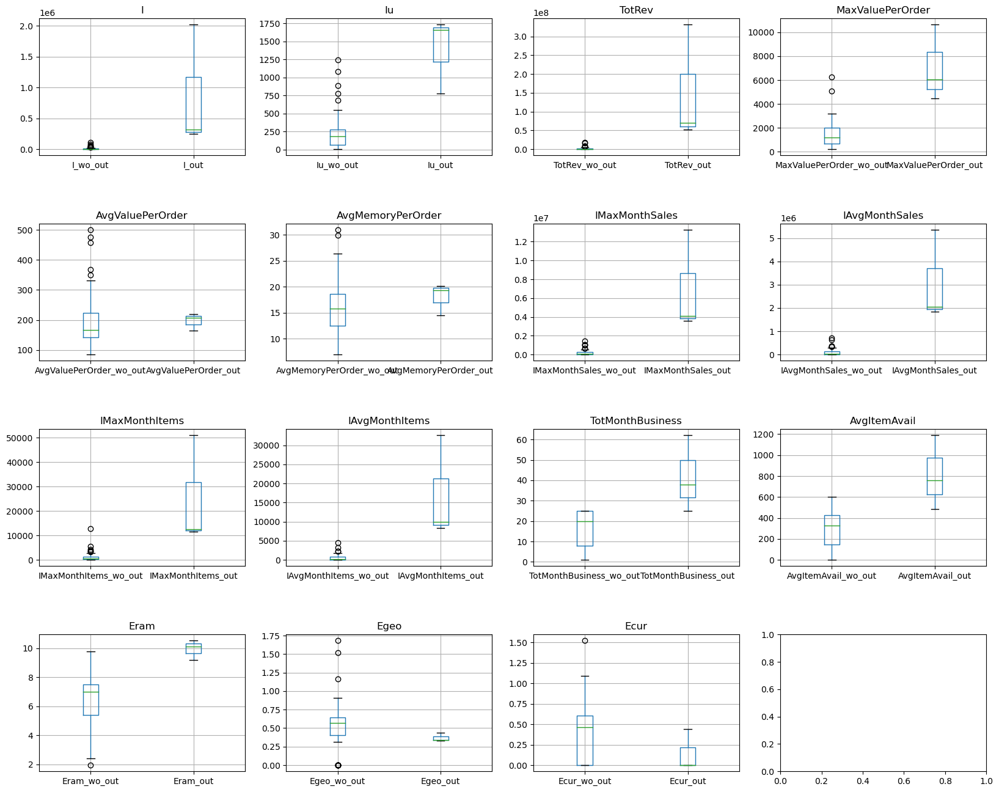

In [197]:
boxplot_grid(vend_df_num, 4, 4, outlier_df_dbscan)

The outliers found by DBSCAN are interesting, two of them are price comparison engines while the other (Mindfactory) is the vendor that we noticed during the data exploration phase due to it selling ram at an above market rate.  

### Conclusions
Given the low amount of data points available in the vendor dataset and given that the implications of removing more data will be detected only in the following tasks, we opt for removing the least amount of outliers possible, we therefore use the results of DBSCAN to continue our analysis.

In [198]:
feature_num_df_wo_out = vend_df_num.drop(outlier_df_dbscan.index)
feature_cat_df_wo_out = vend_df_cat.drop(outlier_df_dbscan.index)

## Correlations without outliers

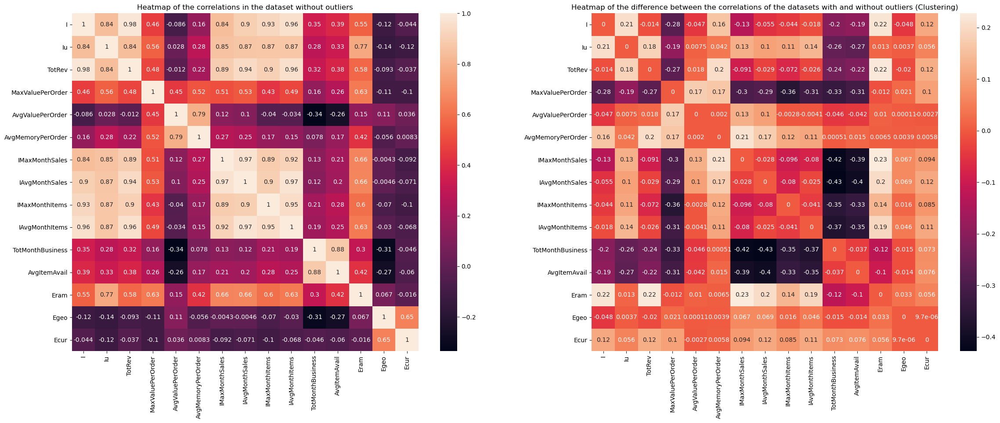

In [199]:
fig = plt.figure(figsize=(28, 10)) 
fig_dims = (1, 2)
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plt.subplot2grid(fig_dims, (0, 0))
plt.title("Heatmap of the correlations in the dataset without outliers")
sn.heatmap(feature_num_df_wo_out.corr(), annot=True)

plt.subplot2grid(fig_dims, (0, 1))
plt.title("Heatmap of the difference between the correlations of the datasets with and without outliers (Clustering)")
sn.heatmap(feature_num_df_wo_out.corr()-vend_df_num.corr(), annot=True)

plt.show()

The main changes happened mostly to the features that had the most prominent outliers (I, Iu, IMaxMonthSales, etc).

## Numerical analysis without outliers  
In this section we are interested in finding out the distribution of the new outlier-free features.

In [200]:
def plot_hist_dataset(df, feature):
    
    #We use Sturge's rule to determine the number of buckets given that this is a small dataset
    bin_num = int(np.ceil(np.log2(df.shape[0]+1)))
    bins_list = np.linspace(0, df[feature].max(), bin_num)
    
    plt.figure(figsize=(10, 5))

    plt.title(feature, fontsize=15)
    df[feature].plot(kind="hist", bins=bins_list)
    plt.ylabel("Vendor count")

    plt.show()

### I: number of total items sold by the vendor

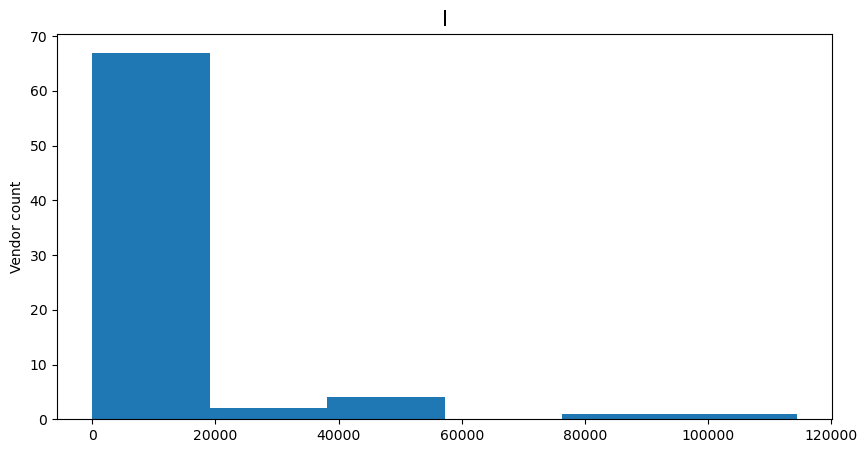

In [201]:
plot_hist_dataset(feature_num_df_wo_out, "I")

### Iu: number of unique items sold by the vendor

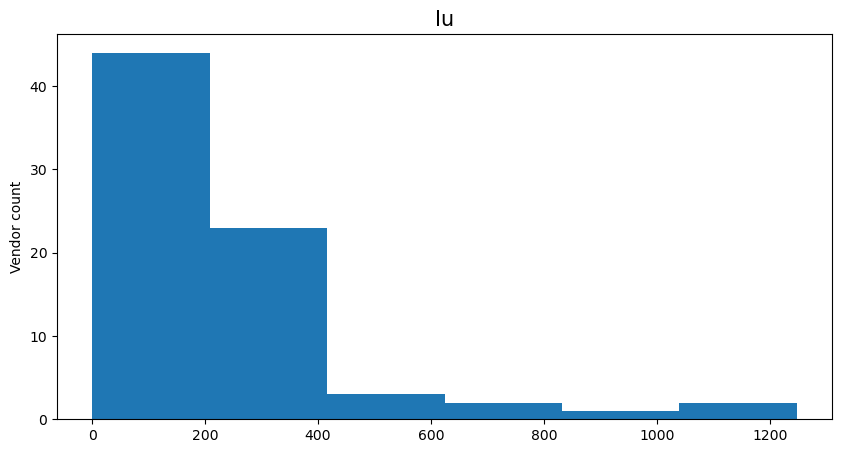

In [202]:
plot_hist_dataset(feature_num_df_wo_out, "Iu")

### TotRev: total revenue of the vendor

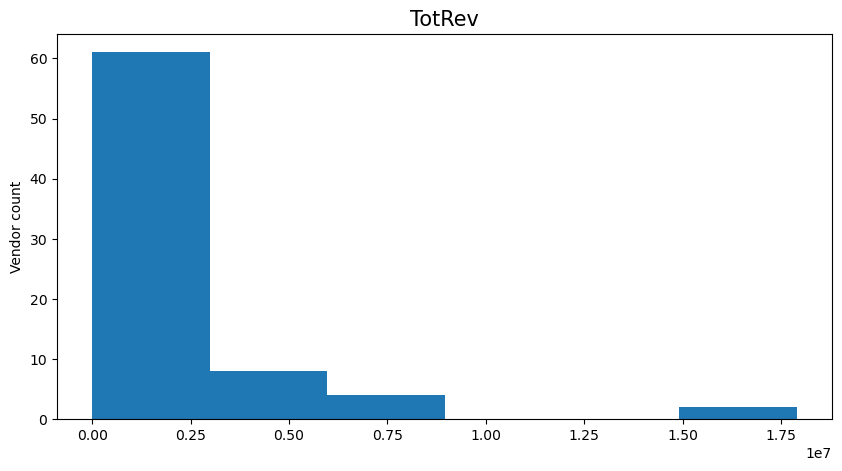

In [203]:
plot_hist_dataset(feature_num_df_wo_out, "TotRev")

### MaxValuePerOrder: most expensive (USD) item sold by the vendor

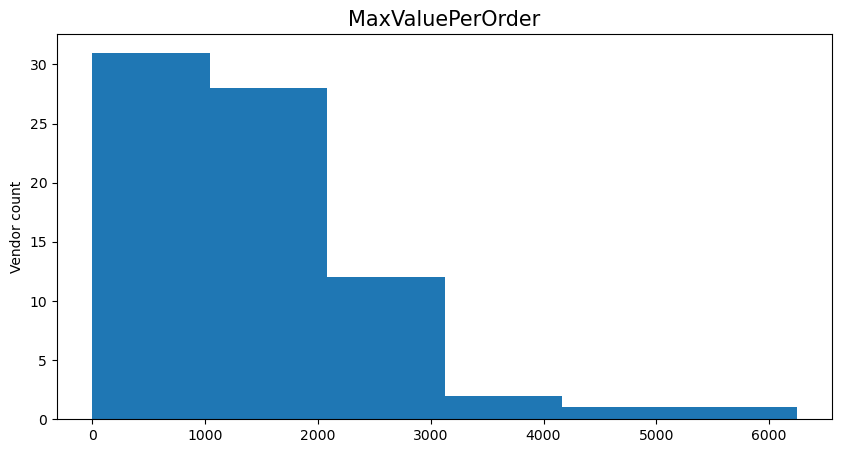

In [204]:
plot_hist_dataset(feature_num_df_wo_out, "MaxValuePerOrder")

### AvgValuePerOrder: average of the price (USD) of the items sold by the vendor

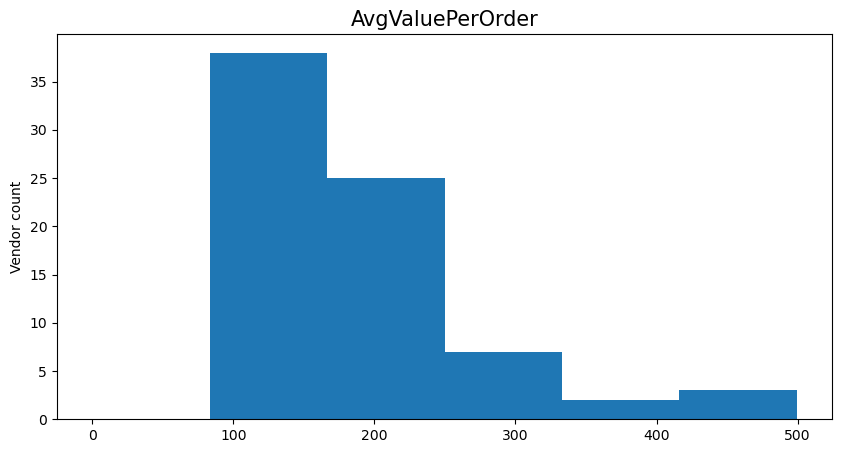

In [205]:
plot_hist_dataset(feature_num_df_wo_out, "AvgValuePerOrder")

### AvgMemoryPerOrder: average amount of memory of the items sold by the vendor

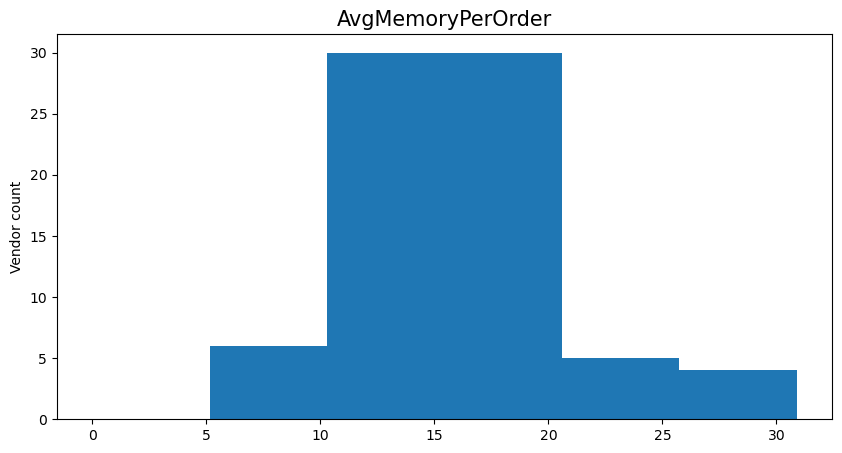

In [206]:
plot_hist_dataset(feature_num_df_wo_out, "AvgMemoryPerOrder")

### IMaxMonthSales: maximum value (usd) of items sold in any month by the vendor

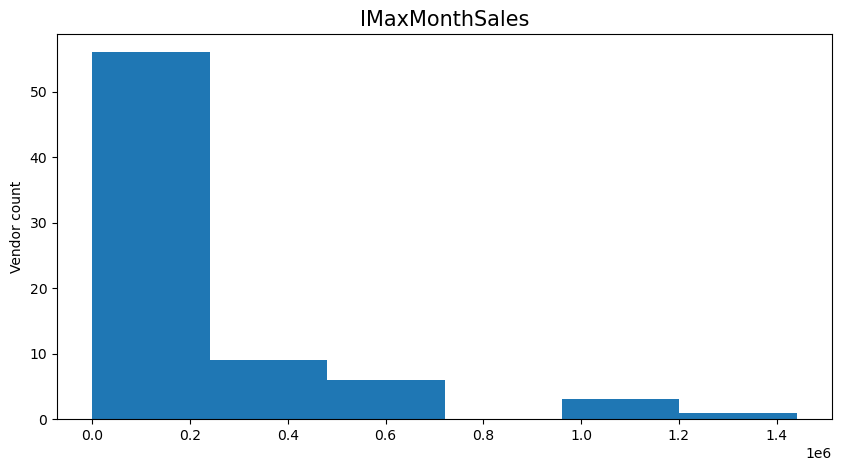

In [207]:
plot_hist_dataset(feature_num_df_wo_out, "IMaxMonthSales")

### IAvgMonthSales: average value of sales in a month by the vendor

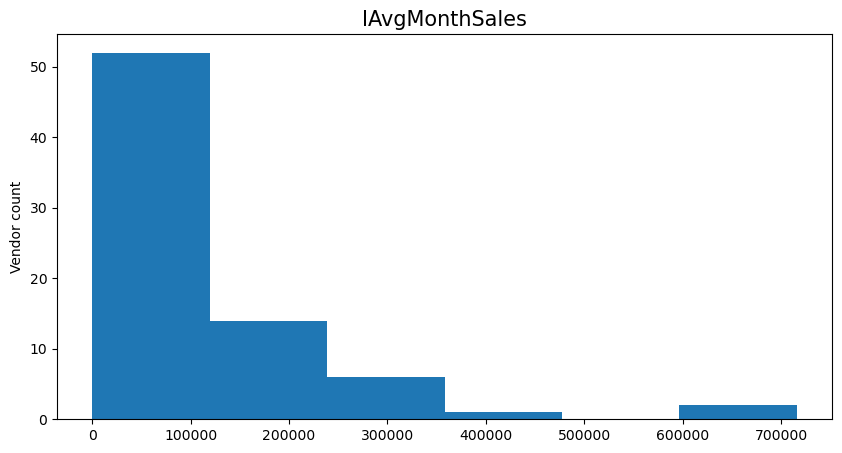

In [208]:
plot_hist_dataset(feature_num_df_wo_out, "IAvgMonthSales")

### IMaxMonthItems: maximum number of items sold in any month by the vendor

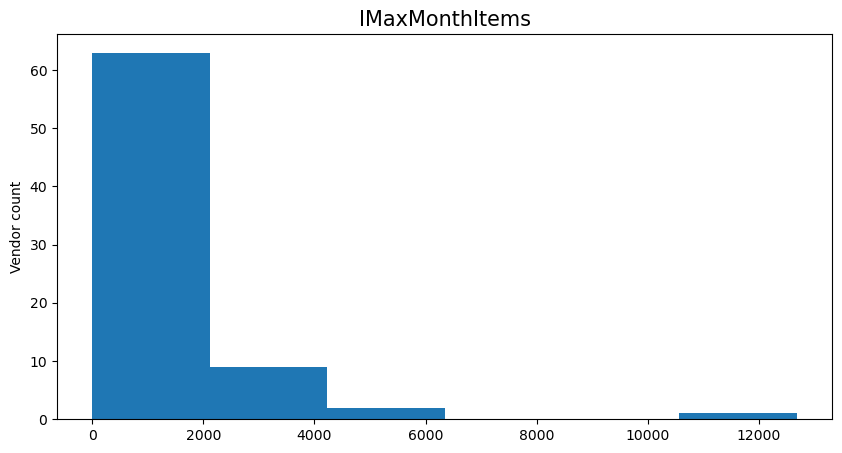

In [209]:
plot_hist_dataset(feature_num_df_wo_out, "IMaxMonthItems")

### IAvgMonthItems: average number of items sold in a month by the vendor

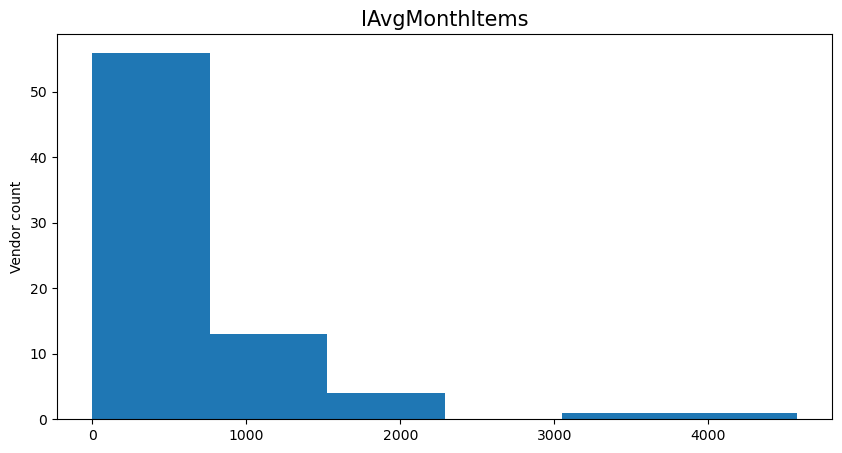

In [210]:
plot_hist_dataset(feature_num_df_wo_out, "IAvgMonthItems")

The majority of the vendors sells less than 1000 items per month on average.

### TotMonthBusiness: total number of months that vendor has been selling ram for

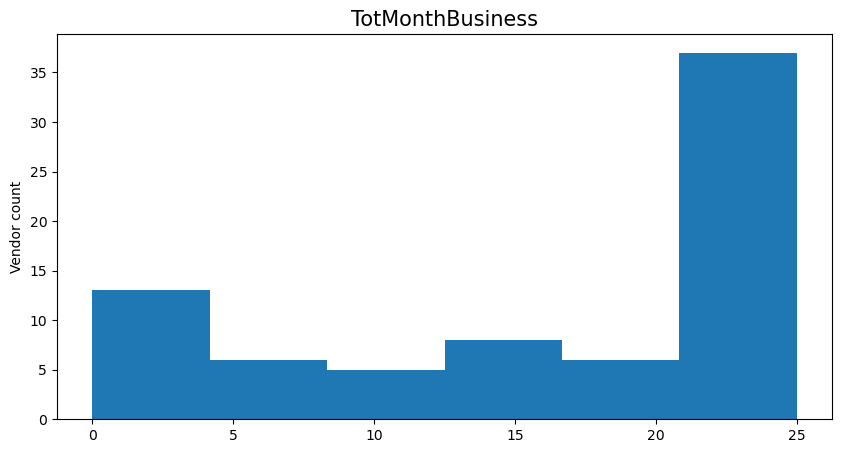

In [211]:
plot_hist_dataset(feature_num_df_wo_out, "TotMonthBusiness")

A plurality of the vendors has been in business for more than 20 months.

### AvgItemAvail: average amount of days a product is available for sale for

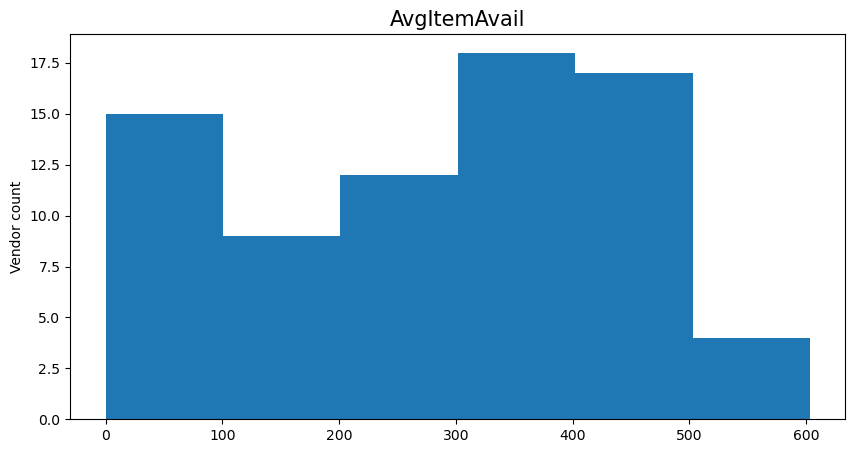

In [212]:
plot_hist_dataset(feature_num_df_wo_out, "AvgItemAvail")

### Eram: Shannon's entropy of the ram modules sold

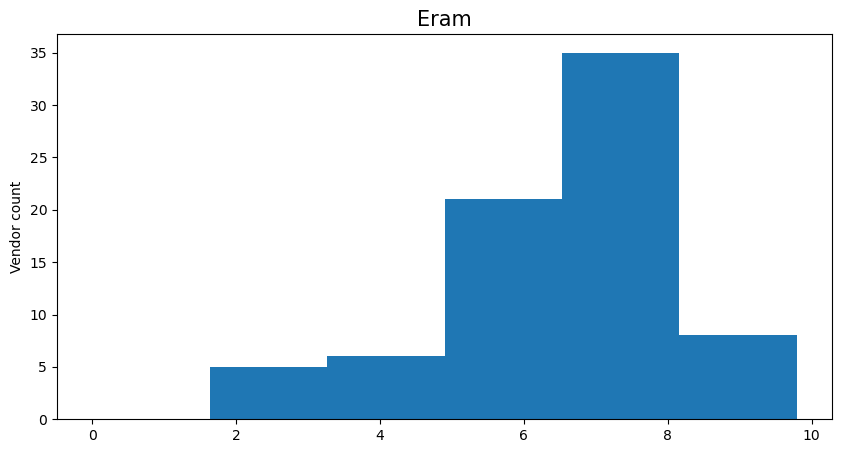

In [213]:
plot_hist_dataset(feature_num_df_wo_out, "Eram")

### Egeo: Shannon's entropy of the countries in which the sales took place

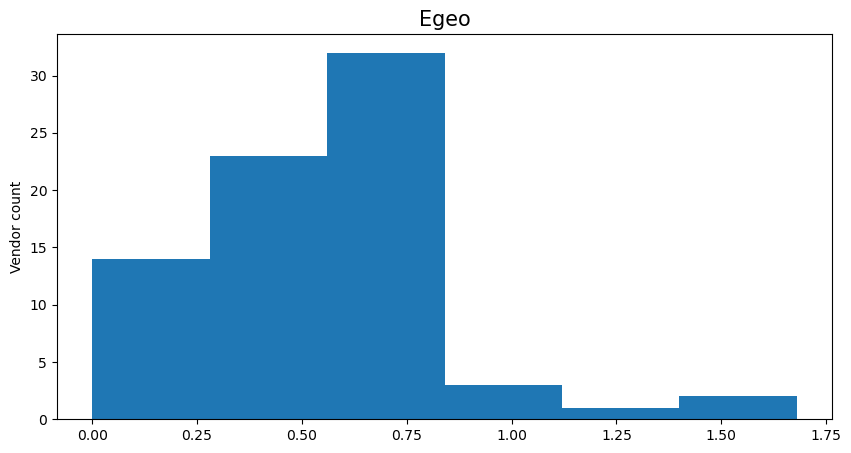

In [214]:
plot_hist_dataset(feature_num_df_wo_out, "Egeo")

### Ecur: Shannon's entropy of the currencies used

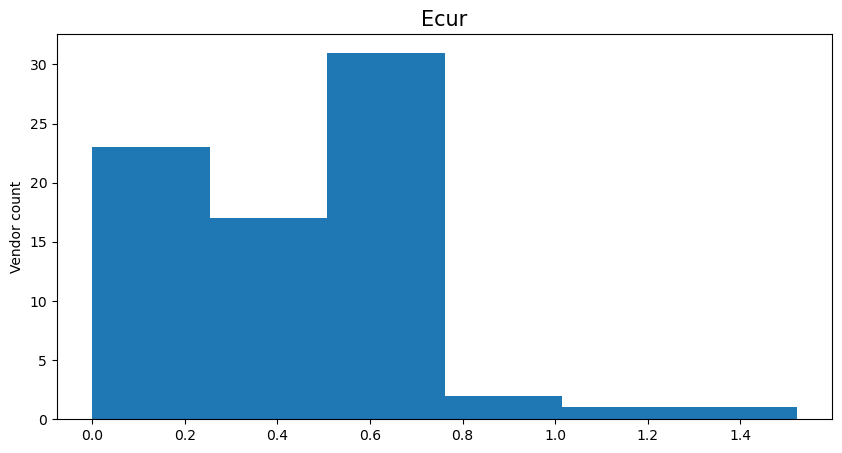

In [215]:
plot_hist_dataset(feature_num_df_wo_out, "Ecur")

## Categorical analysis without outliers

### TopBrand: top grossing brand for vendors

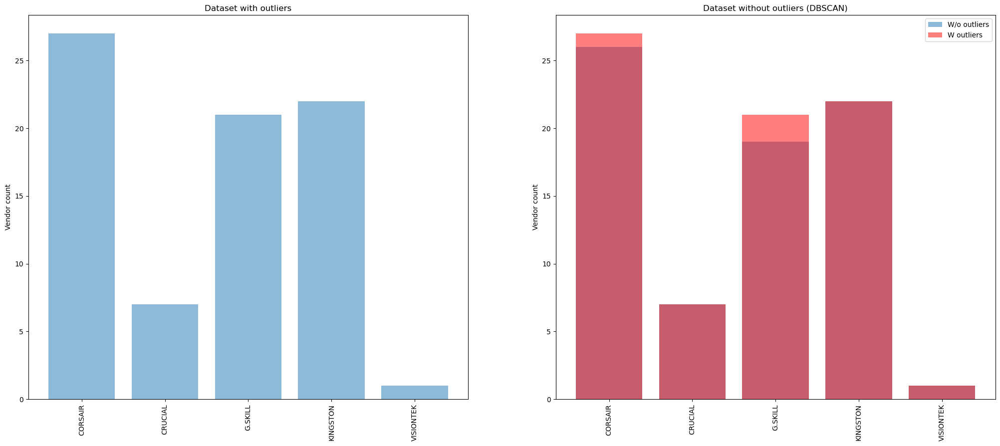

In [216]:
plot_value_comparison_cat(vend_df_cat, [feature_cat_df_wo_out], "TopBrand", ["DBSCAN"])

The outliers most profitable sales was ram from G.SKILL and CORSAIR, two mostly gaming oriented brands.

### TopCountry: top grossing country for vendors

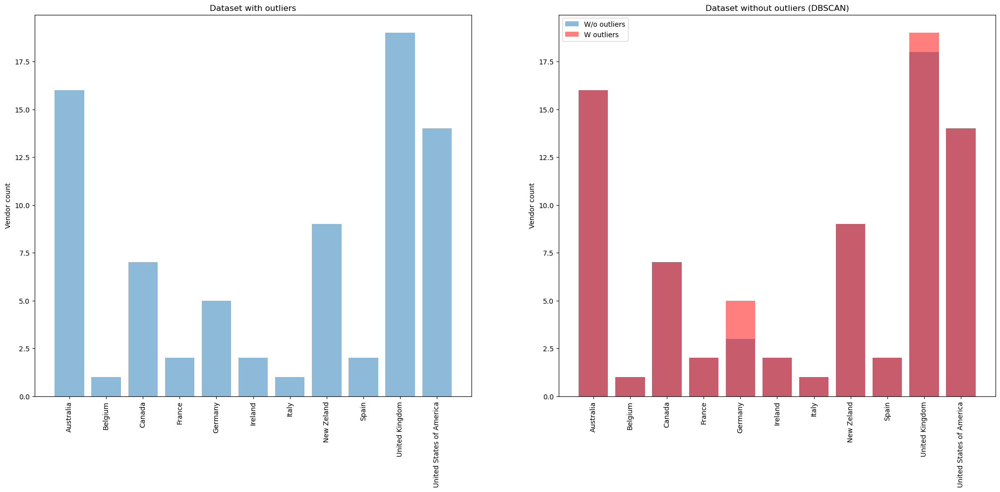

In [217]:
plot_value_comparison_cat(vend_df_cat, [feature_cat_df_wo_out], "TopCountry", ["DBSCAN"])

The results are not surprising given that Germany is the biggest buyer of ram in the original dataset and that geizhals_unknown is a german service.  
Likewise pricespy_unknows is a UK company.

### TopCurrency: top currency used for sales by vendors

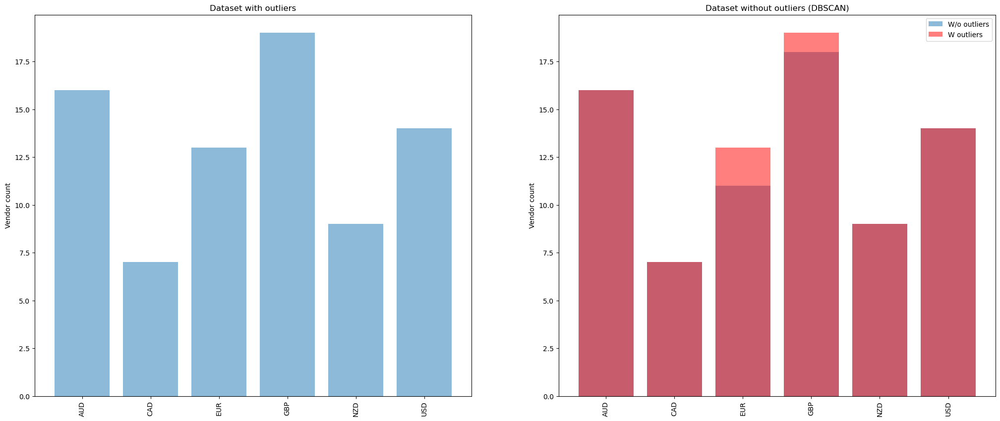

In [218]:
plot_value_comparison_cat(vend_df_cat, [feature_cat_df_wo_out], "TopCurrency", ["DBSCAN"])

Reflects the insights from TopCountry.

### TopSalesMonth: top month by revenue across years

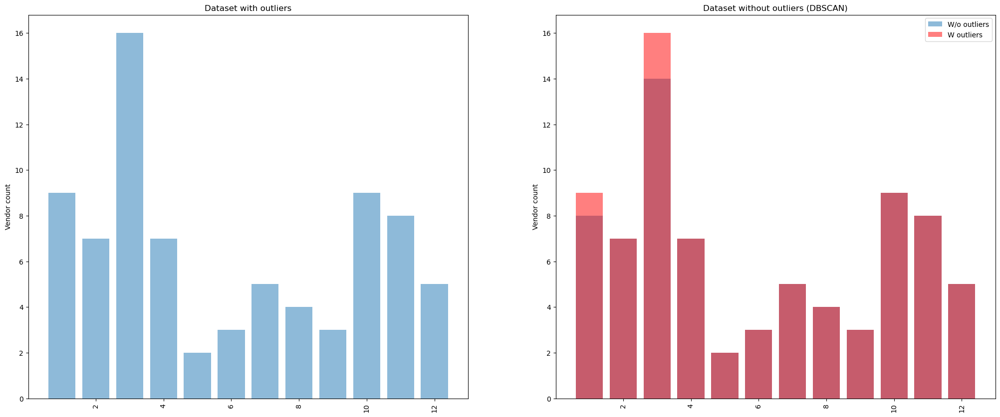

In [219]:
plot_value_comparison_cat(vend_df_cat, [feature_cat_df_wo_out], "TopSalesMonth", ["DBSCAN"])

A plurality of the vendors still have March as the most profitable month of the year.

## Feature summary

### Numerical features

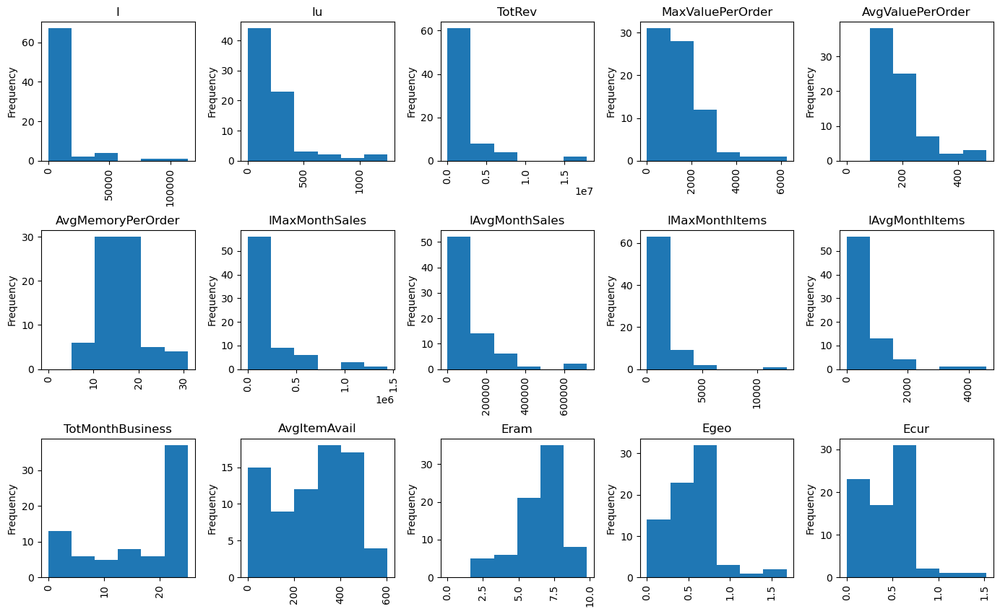

In [272]:
num_cols = 5
num_rows = int(np.ceil(len(feature_num_df_wo_out.columns)/num_cols))
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(17, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.3)

for i in range(len(feature_num_df_wo_out.columns)):
    feature = feature_num_df_wo_out.columns[i]
    
    bin_num = int(np.ceil(np.log2(feature_num_df_wo_out.shape[0]+1)))
    bins_list = np.linspace(0, feature_num_df_wo_out[feature].max(), bin_num)
    
    col_id = i%num_cols
    row_id = i//num_cols

    feature_num_df_wo_out[feature].plot(kind="hist", bins=bins_list, ax=axes[row_id][col_id], title=feature, rot=90)

### Categorical features

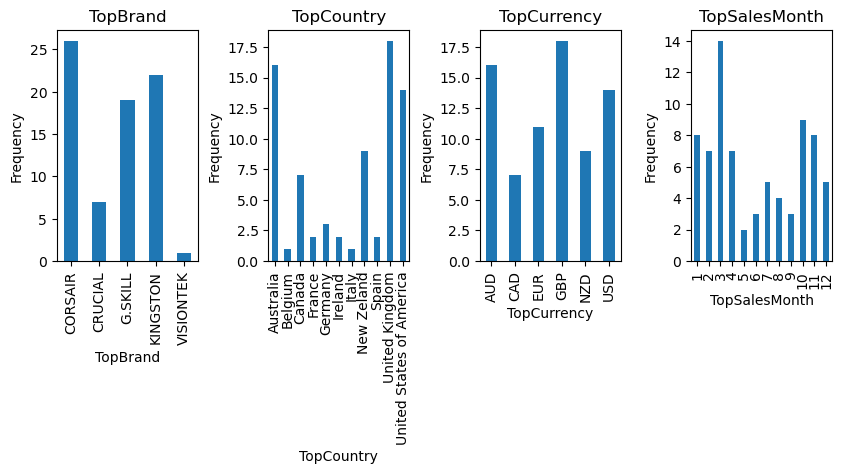

In [265]:
fig, axes = plt.subplots(nrows=1, ncols=len(feature_cat_df_wo_out.columns), figsize=(10, 3))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

for i in range(len(feature_cat_df_wo_out.columns)):
    feature = feature_cat_df_wo_out.columns[i]

    feature_cat_df_wo_out.groupby(feature).size().plot(kind="bar", ax=axes[i], title=feature, rot=90, ylabel="Frequency")

## Feature redundancy

For our analysis purposes, we don't need all of the features defined above given the high correlations between them.  
We will therefore remove these redundant features (corr >= 0.80) in order to simplify future tasks.

In [220]:
feature_num_df_wo_redund = feature_num_df_wo_out.drop(["TotRev", "IMaxMonthSales", "IMaxMonthItems", \
                                                     "IAvgMonthItems", "AvgItemAvail"], axis=1)

Other highly correlated features such as AvgMemoryPerOrder and IAvgMonthSales are being kept because we think that they could be useful in characterising the vendors in future tasks.

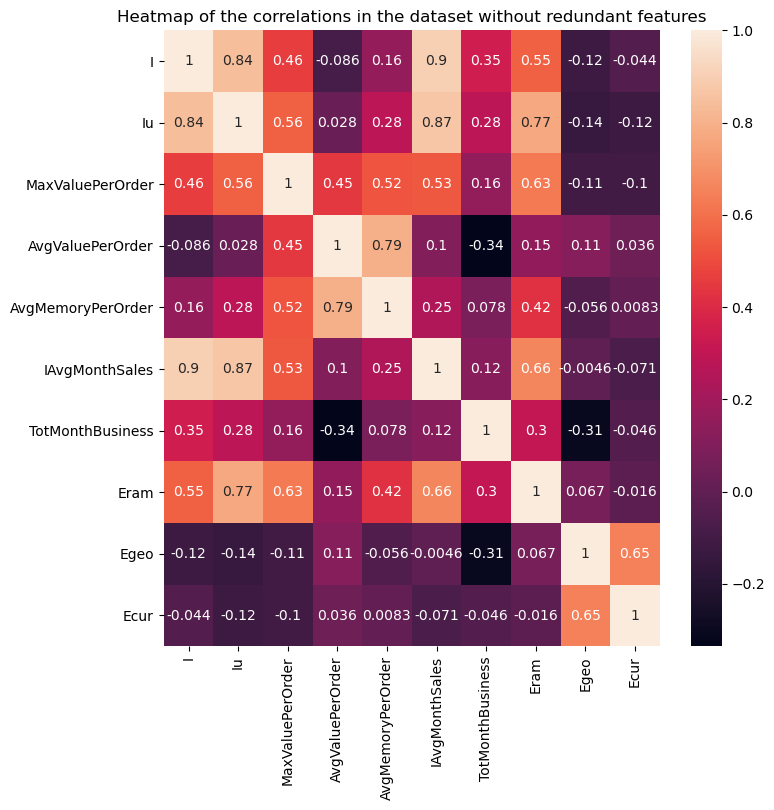

In [276]:
plt.figure(figsize=(8,8))
plt.title("Heatmap of the correlations in the dataset without redundant features")
sn.heatmap(feature_num_df_wo_redund.corr(), annot=True)
plt.show()

### Conclusions  

### Results to csv  
We save both the dataframes with and wihtout outliers, in order to use them in the next tasks.

In [222]:
feature_df_num_w_out = vend_df_num.drop(["TotRev", "IMaxMonthSales", "IMaxMonthItems", "IAvgMonthItems", "AvgItemAvail"], axis=1)
feature_df_cat_w_out = vend_df_cat

feature_df_num_wo_out = feature_num_df_wo_redund
feature_df_cat_wo_out = feature_cat_df_wo_out

feature_df_num_w_out.to_csv('./task1-result_num_w_out.csv', sep=',', index=True)
feature_df_cat_w_out.to_csv('./task1-result_cat_w_out.csv', sep=',', index=True)
feature_df_num_wo_out.to_csv('./task1-result_num_wo_out.csv', sep=',', index=True)
feature_df_cat_wo_out.to_csv('./task1-result_cat_wo_out.csv', sep=',', index=True)

We also save the sales dataframe that we used to conduct the last part of the analysis, in order to reuse it in future tasks.  
Split in two for VCS convenience sake.

In [223]:
df_size = df_sales_wo_out_lof.shape[0]

df_sales_not_merged = df_sales.loc[df_sales.index.isin(df_sales_wo_out_lof.index)]

df_sales_not_merged.iloc[0:df_size//2].to_csv('./task1-df_sales-part1.csv', sep=',', index=True)
df_sales_not_merged.iloc[df_size//2:].to_csv('./task1-df_sales-part2.csv', sep=',', index=True)